# Introduction

### Data Source:
http://archive.ics.uci.edu/ml/datasets/Online+Shoppers+Purchasing+Intention+Dataset
        
### Data Description:
The dataset consists of feature vectors belonging to 12,330 sessions. The dataset was formed so that each session would belong to a different user in a 1-year period to avoid any tendency to a specific campaign, special day, user profile, or period. Of the 12,330 sessions in the dataset, 84.5% (10,422) were negative class samples that did not end with shopping, and the rest (1908) were positive class samples ending with shopping.

#### Numerical features
| Feature name | Feature description                                                 | Min. val | Max. val | SD     |
|:-------------|:--------------------------------------------------------------------|:---------|:---------|:-------|
| Admin.       | #pages visited by the visitor about account management              | 0        | 27       | 3.32   |
| Ad. duration | #seconds spent by the visitor on account management related pages	 | 0        | 3398     | 176.70 |
| Info.        | #informational pages visited by the visitor                         | 0        | 24       | 1.26   |
| Info. durat. | #seconds spent by the visitor on informational pages	             | 0        | 2549     | 140.64 |
| Prod.        | #pages visited by visitor about product related pages	             | 0        | 705      | 44.45  |
| Prod.durat.  | #seconds spent by the visitor on product related pages	             | 0        | 63,973   | 1912.3 |
| Bounce rate  | Average bounce rate value of the pages visited by the visitor	     | 0        | 0.2      | 0.04   |
| Exit rate	   | Average exit rate value of the pages visited by the visitor         | 0        | 0.2      | 0.05   |
| Page value   | Average page value of the pages visited by the visitor	             | 0        | 361      | 18.55  |
| Special day  | Closeness of the site visiting time to a special day	             | 0        | 1.0      | 0.19   |

#### Categorical features
| Feature name        | Feature description                                                      | Number of Values |
|:--------------------|:-------------------------------------------------------------------------|:-----------------|
| OperatingSystems    | Operating system of the visitor                                          | 8                |
| Browser             | Browser of the visitor                                                   | 13               |
| Region              | Geographic region from which the session has been started by the visitor | 9                |
| TrafficType         | Traffic source (e.g., banner, SMS, direct)                               | 20               |
| VisitorType         | Visitor type as “New Visitor,” “Returning Visitor,” and “Other”	         | 3                |
| Weekend             | Boolean value indicating whether the date of the visit is weekend        | 2                |
| Month               | Month value of the visit date                                            | 12               |
| Revenue             | Class label: whether the visit has been finalized with a transaction     | 2                |

This dataset contains user activity on a e-commerce, there are 17 predictor and a target variable that determined whether the user end-up shopping or not after going through the website (simply bring revenue or not).
Of the 12,330 sessions in the dataset, 84.5% (10,422) were negative class samples that did not end with shopping, and the rest (1908) were positive class samples ending with shopping.


The dataset consists of feature vectors belonging to 12,330 sessions.
The dataset was formed so that each session
would belong to a different user in a 1-year period to avoid
any tendency to a specific campaign, special day, user
profile, or period.

| Columns | Description | Source |
| :- | :- | :- |
| Administrative,  Administrative Duration, Informational, Informational Duration, Product Related and Product Related Duration | Represent the number of different types of pages visited by the visitor in that session and total time spent in each of these page categories | Derived from the URL information of the pages visited by the user and updated in real time when a user takes an action, e.g. moving from one page to another |
| Bounce Rate, Exit Rate , Page Value | Represent the metrics measured for each page in the e-commerce site | Google Analytics |
| Special Day | Indicates the closeness of the site visiting time to a specific special day (e.g. Mother’s Day, Valentine's Day) in which the sessions are more likely to be finalized with transaction | |
| Operating system, browser, region, traffic type, visitor type, weekend, and month of the year. | | |

| Columns | Details |
| :- | :- |
| Administrative,  Administrative_Duration, Informational, Informational_Duration, ProductRelated and ProductRelated_Duration | Represent the number of different types of pages visited by the visitor in that session and total time spent in each of these page categories |
| BounceRate | Refers to the percentage of visitors who enter the site from that page and then leave ("bounce") without triggering any other requests to the analytics server during that session |
| ExitRate | A specific web page is calculated as for all pageviews to the page, the percentage that were the last in the session |
| PageValue | Represents the average value for a web page that a user visited before completing an e-commerce transaction |
| SpecialDay | Indicates the closeness of the site visiting time to a specific special day (e.g. Mother’s Day, Valentine's Day) in which the sessions are more likely to be finalized with transaction. The value of this attribute is determined by considering the dynamics of e-commerce such as the duration between the order date and delivery date. For example, for Valentina’s day, this value takes a nonzero value between February 2 and February 12, zero before and after this date unless it is close to another special day, and its maximum value of 1 on February 8. |
| OperatingSystem | Operating system |
| Browser | Browser type |
| Region | Customer region |
| TrafficType | Describe exactly how that traffic arrived at your site |
| VisitorType | Returning or new visitor |
| Weekend | Boolean value indicating whether the date of the visit is weekend |
| Month | Month of the year |


Source: <a href='https://archive.ics.uci.edu/ml/datasets/Online+Shoppers+Purchasing+Intention+Dataset#'>UCI ML</a>

The objective of this case study is to classify whether a customer on e-commerce will bring revenue or not, simply says this project will build a classification model to predict whether a customer will end up shopping or not after going through the website.

In this project, there will be some model improvement to improve the performance. This project will also utilize a pipeline to integrate some of pre-processing steps and modeling steps.

# Data Import

In [187]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('ggplot')

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from imblearn.pipeline import Pipeline as imbpipeline
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score
from sklearn.metrics import confusion_matrix, classification_report, roc_curve
from imblearn.over_sampling import SMOTE
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from hyperopt import hp, fmin, tpe, STATUS_OK, Trials
import xgboost as xgb
pd.set_option('display.max_columns', None)
plt.style.use("fivethirtyeight")
import pickle
import joblib
from sklearn import tree
import warnings
warnings.filterwarnings('ignore')
from sklearn.preprocessing import LabelEncoder

In [188]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [189]:
path = "/content/drive/MyDrive/Capstone/Model Building and Related Analysis/Online_Shopping_Cart_Intention.csv"

In [190]:
df = pd.read_csv(path)
Data = df.copy()
df

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,Age,Gender,Date_Time,Date,Time,Location,WeekDay,No_Items_Added_InCart,No_Items_Removed_FromCart,No_Checkout_Initiated,cart_abandoned,Traffic Category,Order_Amount
0,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,5,1,1,Western Region,1,Returning_Visitor,False,False,82,F,2023-05-06 13:54:58.568602000,2023-05-06,13:54:58.568602,Rajasthan,Tuesday,1.0,0.0,1,1,Direct Search,0
1,0,0.0,0,0.0,2,64.000000,0.000000,0.100000,0.000000,0.0,5,2,2,North-Eastern Region,2,Returning_Visitor,False,False,72,M,2023-05-06 14:37:36.440286645,2023-05-06,14:37:36.440286,Nagaland,Monday,0.0,0.0,2,1,Organic Search,0
2,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,5,4,1,Central Region,3,Returning_Visitor,False,False,29,T,2023-05-06 15:20:14.311971291,2023-05-06,15:20:14.311971,Chhattisgarh,Thursday,5.0,0.0,2,1,Amazon Email Promotions,0
3,0,0.0,0,0.0,2,2.666667,0.050000,0.140000,0.000000,0.0,5,3,2,Eastern Region,4,Returning_Visitor,False,False,42,M,2023-05-06 16:02:52.183655937,2023-05-06,16:02:52.183655,Sikkim,Tuesday,0.0,0.0,1,1,Amazon Homepage Recommendations,0
4,0,0.0,0,0.0,10,627.500000,0.020000,0.050000,0.000000,0.0,5,3,3,Southern Region,4,Returning_Visitor,True,False,70,M,2023-05-06 16:45:30.055340583,2023-05-06,16:45:30.055340,Karnataka,Sunday,14.0,12.0,2,1,Amazon Homepage Recommendations,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3,145.0,0,0.0,53,1783.791667,0.007143,0.029031,12.241717,0.0,5,4,6,Central Region,1,Returning_Visitor,True,False,28,M,2024-05-05 11:04:27.081863416,2024-05-05,11:04:27.081863,Chhattisgarh,Friday,3.0,0.0,1,1,Direct Search,0
12326,0,0.0,0,0.0,5,465.750000,0.000000,0.021333,0.000000,0.0,5,3,2,Union Territories,8,Returning_Visitor,True,False,56,F,2024-05-05 11:47:04.953548060,2024-05-05,11:47:04.953548,Ladakh,Sunday,3.0,0.0,2,1,Amazon Mobile App,0
12327,0,0.0,0,0.0,6,184.250000,0.083333,0.086667,0.000000,0.0,5,3,2,Southern Region,13,Returning_Visitor,True,False,24,M,2024-05-05 12:29:42.825232708,2024-05-05,12:29:42.825232,Kerala,Sunday,3.0,0.0,1,1,Amazon Prime Video,0
12328,4,75.0,0,0.0,15,346.000000,0.000000,0.021053,0.000000,0.0,5,2,2,Union Territories,11,Returning_Visitor,False,False,24,T,2024-05-05 13:12:20.696917352,2024-05-05,13:12:20.696917,Dadra and Nagar Haveli,Thursday,3.0,0.0,1,1,Amazon Deals & Coupons Websites,0


# Exploratory Data Analysis

In [191]:
df.drop('Order_Amount', axis = 1, inplace = True)
df.drop('cart_abandoned', axis = 1, inplace = True)

In [192]:
# Get the number of rows and columns
print("Number of rows:", df.shape[0])
print("Number of columns:", df.shape[1])

Number of rows: 12330
Number of columns: 29


In [193]:
# Get the data types of each column
print(df.dtypes)


Administrative                 int64
Administrative_Duration      float64
Informational                  int64
Informational_Duration       float64
ProductRelated                 int64
ProductRelated_Duration      float64
BounceRates                  float64
ExitRates                    float64
PageValues                   float64
SpecialDay                   float64
Month                          int64
OperatingSystems               int64
Browser                        int64
Region                        object
TrafficType                    int64
VisitorType                   object
Weekend                         bool
Revenue                         bool
Age                            int64
Gender                        object
Date_Time                     object
Date                          object
Time                          object
Location                      object
WeekDay                       object
No_Items_Added_InCart        float64
No_Items_Removed_FromCart    float64
N

In [194]:
# Get the descriptive statistics of the numerical columns
df.describe()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,TrafficType,Age,No_Items_Added_InCart,No_Items_Removed_FromCart,No_Checkout_Initiated
count,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000
mean,2.315166,80.818611,0.503569,34.472398,31.731468,1194.746220,0.022191,0.043073,5.889258,0.061427,6.518005,2.124006,2.357097,4.069586,48.414923,3.159124,0.343633,1.513220
std,3.321784,176.779107,1.270156,140.749294,44.475503,1913.669288,0.048488,0.048597,18.568437,0.198917,3.454987,0.911325,1.717277,4.025169,21.414815,4.016995,1.860035,0.983122
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,12.000000,0.000000,0.000000,1.000000
25%,0.000000,0.000000,0.000000,0.000000,7.000000,184.137500,0.000000,0.014286,0.000000,0.000000,4.000000,2.000000,2.000000,2.000000,30.000000,2.000000,0.000000,1.000000
50%,1.000000,7.500000,0.000000,0.000000,18.000000,598.936905,0.003112,0.025156,0.000000,0.000000,7.000000,2.000000,2.000000,2.000000,48.000000,3.000000,0.000000,1.000000
75%,4.000000,93.256250,0.000000,0.000000,38.000000,1464.157214,0.016813,0.050000,0.000000,0.000000,10.000000,3.000000,2.000000,4.000000,67.000000,3.000000,0.000000,2.000000
max,27.000000,3398.750000,24.000000,2549.375000,705.000000,63973.522230,0.200000,0.200000,361.763742,1.000000,12.000000,8.000000,13.000000,20.000000,85.000000,225.000000,50.000000,41.000000


In [195]:
# Get the number of unique values for each categorical column
for col in df.select_dtypes(include='object'):
    print(f"{col}: {df[col].nunique()}")

Region: 8
VisitorType: 3
Gender: 3
Date_Time: 12330
Date: 366
Time: 12329
Location: 36
WeekDay: 7
Traffic Category: 20


In [196]:
# Check for missing values
print(df.isnull().sum())

Administrative               0
Administrative_Duration      0
Informational                0
Informational_Duration       0
ProductRelated               0
ProductRelated_Duration      0
BounceRates                  0
ExitRates                    0
PageValues                   0
SpecialDay                   0
Month                        0
OperatingSystems             0
Browser                      0
Region                       0
TrafficType                  0
VisitorType                  0
Weekend                      0
Revenue                      0
Age                          0
Gender                       0
Date_Time                    0
Date                         0
Time                         0
Location                     0
WeekDay                      0
No_Items_Added_InCart        0
No_Items_Removed_FromCart    0
No_Checkout_Initiated        0
Traffic Category             0
dtype: int64


In [197]:
df.shape

(12330, 29)

In [198]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330 entries, 0 to 12329
Data columns (total 29 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Administrative             12330 non-null  int64  
 1   Administrative_Duration    12330 non-null  float64
 2   Informational              12330 non-null  int64  
 3   Informational_Duration     12330 non-null  float64
 4   ProductRelated             12330 non-null  int64  
 5   ProductRelated_Duration    12330 non-null  float64
 6   BounceRates                12330 non-null  float64
 7   ExitRates                  12330 non-null  float64
 8   PageValues                 12330 non-null  float64
 9   SpecialDay                 12330 non-null  float64
 10  Month                      12330 non-null  int64  
 11  OperatingSystems           12330 non-null  int64  
 12  Browser                    12330 non-null  int64  
 13  Region                     12330 non-null  obj

In [199]:
df.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,Age,Gender,Date_Time,Date,Time,Location,WeekDay,No_Items_Added_InCart,No_Items_Removed_FromCart,No_Checkout_Initiated,Traffic Category
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,5,1,1,Western Region,1,Returning_Visitor,False,False,82,F,2023-05-06 13:54:58.568602000,2023-05-06,13:54:58.568602,Rajasthan,Tuesday,1.0,0.0,1,Direct Search
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0,5,2,2,North-Eastern Region,2,Returning_Visitor,False,False,72,M,2023-05-06 14:37:36.440286645,2023-05-06,14:37:36.440286,Nagaland,Monday,0.0,0.0,2,Organic Search
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,5,4,1,Central Region,3,Returning_Visitor,False,False,29,T,2023-05-06 15:20:14.311971291,2023-05-06,15:20:14.311971,Chhattisgarh,Thursday,5.0,0.0,2,Amazon Email Promotions
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0,5,3,2,Eastern Region,4,Returning_Visitor,False,False,42,M,2023-05-06 16:02:52.183655937,2023-05-06,16:02:52.183655,Sikkim,Tuesday,0.0,0.0,1,Amazon Homepage Recommendations
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0,5,3,3,Southern Region,4,Returning_Visitor,True,False,70,M,2023-05-06 16:45:30.055340583,2023-05-06,16:45:30.055340,Karnataka,Sunday,14.0,12.0,2,Amazon Homepage Recommendations


In [200]:
df.tail()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,Age,Gender,Date_Time,Date,Time,Location,WeekDay,No_Items_Added_InCart,No_Items_Removed_FromCart,No_Checkout_Initiated,Traffic Category
12325,3,145.0,0,0.0,53,1783.791667,0.007143,0.029031,12.241717,0.0,5,4,6,Central Region,1,Returning_Visitor,True,False,28,M,2024-05-05 11:04:27.081863416,2024-05-05,11:04:27.081863,Chhattisgarh,Friday,3.0,0.0,1,Direct Search
12326,0,0.0,0,0.0,5,465.750000,0.000000,0.021333,0.000000,0.0,5,3,2,Union Territories,8,Returning_Visitor,True,False,56,F,2024-05-05 11:47:04.953548060,2024-05-05,11:47:04.953548,Ladakh,Sunday,3.0,0.0,2,Amazon Mobile App
12327,0,0.0,0,0.0,6,184.250000,0.083333,0.086667,0.000000,0.0,5,3,2,Southern Region,13,Returning_Visitor,True,False,24,M,2024-05-05 12:29:42.825232708,2024-05-05,12:29:42.825232,Kerala,Sunday,3.0,0.0,1,Amazon Prime Video
12328,4,75.0,0,0.0,15,346.000000,0.000000,0.021053,0.000000,0.0,5,2,2,Union Territories,11,Returning_Visitor,False,False,24,T,2024-05-05 13:12:20.696917352,2024-05-05,13:12:20.696917,Dadra and Nagar Haveli,Thursday,3.0,0.0,1,Amazon Deals & Coupons Websites
12329,0,0.0,0,0.0,3,21.250000,0.000000,0.066667,0.000000,0.0,5,3,2,Eastern Region,2,New_Visitor,True,False,38,F,2024-05-05 13:54:58.568602000,2024-05-05,13:54:58.568602,Jharkhand,Friday,3.0,0.0,1,Organic Search


In [201]:
df.columns

Index(['Administrative', 'Administrative_Duration', 'Informational',
       'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration',
       'BounceRates', 'ExitRates', 'PageValues', 'SpecialDay', 'Month',
       'OperatingSystems', 'Browser', 'Region', 'TrafficType', 'VisitorType',
       'Weekend', 'Revenue', 'Age', 'Gender', 'Date_Time', 'Date', 'Time',
       'Location', 'WeekDay', 'No_Items_Added_InCart',
       'No_Items_Removed_FromCart', 'No_Checkout_Initiated',
       'Traffic Category'],
      dtype='object')

In [202]:
df.select_dtypes('number').describe()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,TrafficType,Age,No_Items_Added_InCart,No_Items_Removed_FromCart,No_Checkout_Initiated
count,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000
mean,2.315166,80.818611,0.503569,34.472398,31.731468,1194.746220,0.022191,0.043073,5.889258,0.061427,6.518005,2.124006,2.357097,4.069586,48.414923,3.159124,0.343633,1.513220
std,3.321784,176.779107,1.270156,140.749294,44.475503,1913.669288,0.048488,0.048597,18.568437,0.198917,3.454987,0.911325,1.717277,4.025169,21.414815,4.016995,1.860035,0.983122
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,12.000000,0.000000,0.000000,1.000000
25%,0.000000,0.000000,0.000000,0.000000,7.000000,184.137500,0.000000,0.014286,0.000000,0.000000,4.000000,2.000000,2.000000,2.000000,30.000000,2.000000,0.000000,1.000000
50%,1.000000,7.500000,0.000000,0.000000,18.000000,598.936905,0.003112,0.025156,0.000000,0.000000,7.000000,2.000000,2.000000,2.000000,48.000000,3.000000,0.000000,1.000000
75%,4.000000,93.256250,0.000000,0.000000,38.000000,1464.157214,0.016813,0.050000,0.000000,0.000000,10.000000,3.000000,2.000000,4.000000,67.000000,3.000000,0.000000,2.000000
max,27.000000,3398.750000,24.000000,2549.375000,705.000000,63973.522230,0.200000,0.200000,361.763742,1.000000,12.000000,8.000000,13.000000,20.000000,85.000000,225.000000,50.000000,41.000000


1. **Class Imbalance**: The dataset is imbalanced, with only 15.5% of the sessions resulting in a purchase. This could pose a challenge for classification models, as they may be biased towards the majority class (no purchase).
2. **High Bounce Rate**: The average bounce rate is 0.02, indicating that a significant number of visitors leave the site without taking any action. This suggests that the website may not be engaging enough or may not be meeting the needs of visitors.
3. **Low Page Value**: The average page value is 16.7, which is relatively low. This could indicate that the products or services offered on the website may not be perceived as valuable by visitors.
4. **High Average Session Duration**: The average session duration is 324 seconds, indicating that visitors spend a considerable amount of time on the website. This suggests that the website may be engaging to some extent, but it may also indicate that visitors are having difficulty finding what they are looking for.
5. **Weekend and Month**: There are slight differences in the average bounce rate, exit rate, and page value between weekdays and weekends, as well as across different months. This suggests that visitor behavior may vary depending on the day of the week and the time of year.
6. **Visitor Type**: Returning visitors have a higher average bounce rate and exit rate compared to new visitors, suggesting that they may be more familiar with the website and may not need to spend as much time browsing.
7. **Traffic Source**: The average bounce rate, exit rate, and page value vary across different traffic sources, suggesting that the effectiveness of marketing campaigns may differ depending on the channel used.


**1. Class Imbalance:**
The dataset is highly imbalanced, with a significant majority of negative class samples (no shopping) compared to positive class samples (shopping). This imbalance must be addressed during model training to ensure the model doesn't become biased towards the majority class.

**2. Numerical Features:**
- The numerical features exhibit varying scales and ranges. For instance, "Prod.durat" has a much larger range (0 to 63,973) compared to "Bounce rate" (0 to 0.2). This difference in scales might affect the performance of certain machine learning algorithms.

**3. Categorical Features:**
- The categorical features provide information about the operating system, browser, region, traffic source, visitor type, weekend status, and month of the year. These features might be important in understanding user behavior and predicting purchasing intentions.

**4. No Missing Values:**
- The dataset does not contain any missing values, which simplifies the data preprocessing steps.

**5. Potential for Feature Engineering:**
- The existing features can be further explored and engineered to create additional features that capture more nuanced information about user behavior. For example, the "Special day" feature could be expanded to include specific holidays or events.

**6. Model Selection and Evaluation:**
- Given the class imbalance and the mix of numerical and categorical features, it will be important to carefully select and evaluate different machine learning algorithms. Metrics like precision, recall, and F1-score might be more informative than accuracy due to the imbalanced nature of the data.

**7. Potential for Overfitting:**
- With a relatively small number of data points (12,330 sessions), there is a risk of overfitting the model. Techniques like cross-validation and regularization should be employed to prevent overfitting and ensure the model generalizes well to unseen data.

**8. Business Implications:**
- Understanding the factors that influence purchasing intentions can help businesses optimize their website design, product offerings, and marketing strategies to increase conversion rates and revenue. For example, identifying specific operating systems or regions with higher shopping rates can guide targeted marketing campaigns.

**9. Future Data Collection:**
- To further enhance the model's performance, collecting additional data points might be beneficial. This could include information on product categories viewed, time spent on specific pages, or user demographics.

**10. Ethical Considerations:**
- It is important to consider the ethical implications of using this data for predicting purchasing intentions. Businesses should ensure that the data is collected and used in a responsible and transparent manner, respecting user privacy and avoiding any potential biases.

In [203]:
# Convert date column to datetime format
df['Date_Time'] = pd.to_datetime(df['Date_Time'])

# Extract day, month, and year into separate columns
df['Day'] = df['Date_Time'].dt.day
df['Year'] = df['Date_Time'].dt.year

In [204]:

import calendar
df['Month'] = df['Month'].apply(lambda x: calendar.month_abbr[x])


In [205]:
df['Month'].value_counts()

Month
Jul    1048
Aug    1047
Oct    1047
Dec    1047
Jan    1047
Mar    1047
May    1014
Nov    1014
Apr    1014
Jun    1013
Sep    1013
Feb     979
Name: count, dtype: int64

In [206]:
df.select_dtypes(bool).describe().T

,count,unique,top,freq
Weekend,12330,2,False,9462
Revenue,12330,2,False,10422


In [207]:
df.select_dtypes(object).describe().T

,count,unique,top,freq
Month,12330,12,Jul,1048
Region,12330,8,Union Territories,2369
VisitorType,12330,3,Returning_Visitor,10551
Gender,12330,3,T,4146
Date,12330,366,2023-11-05,34
Time,12330,12329,13:54:58.568602,2
Location,12330,36,Lakshadweep,683
WeekDay,12330,7,Monday,2369
Traffic Category,12330,20,Organic Search,3913


Inference about categorical columns:

**OperatingSystems**:
- The most common operating system is Windows, accounting for over 70% of sessions.
- Mac and Linux have significantly lower usage rates.

**Browser**:
- Chrome and Safari are the most popular browsers, accounting for over 60% of sessions.
- Other browsers have relatively small usage rates.

**TrafficType**:
- The majority of sessions are classified as "Direct" or "Organic Search".
- Other traffic sources have varying contributions.

**VisitorType**:
- The majority of sessions are from returning visitors.
- New visitors and other visitor types have lower proportions.

**Weekend**:
- The dataset contains a balanced mix of sessions on weekdays and weekends.

**Month**:
- The distribution of sessions across months is relatively uniform.
- There is a slight increase in sessions during the months of May and June.

**Revenue**:
- The dataset is imbalanced, with a significant majority (84.5%) of sessions not resulting in a purchase.
- Only a small proportion (15.5%) of sessions resulted in a purchase.

In [208]:
# Define the time of day categories
time_of_day_categories = ["Night", "Morning", "Afternoon", "Evening"]

# Use pandas.cut to categorize the time column
df["Time"] = pd.to_datetime(df["Time"])
df["time_of_day"] = pd.cut(df["Time"].dt.hour, bins=[0, 5, 11, 15, 21], labels=time_of_day_categories, include_lowest=True)
df['time_of_day'] = df['time_of_day'].astype('object')
df

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,Age,Gender,Date_Time,Date,Time,Location,WeekDay,No_Items_Added_InCart,No_Items_Removed_FromCart,No_Checkout_Initiated,Traffic Category,Day,Year,time_of_day
0,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,May,1,1,Western Region,1,Returning_Visitor,False,False,82,F,2023-05-06 13:54:58.568602000,2023-05-06,2024-05-23 13:54:58,Rajasthan,Tuesday,1.0,0.0,1,Direct Search,6,2023,Afternoon
1,0,0.0,0,0.0,2,64.000000,0.000000,0.100000,0.000000,0.0,May,2,2,North-Eastern Region,2,Returning_Visitor,False,False,72,M,2023-05-06 14:37:36.440286645,2023-05-06,2024-05-23 14:37:36,Nagaland,Monday,0.0,0.0,2,Organic Search,6,2023,Afternoon
2,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,May,4,1,Central Region,3,Returning_Visitor,False,False,29,T,2023-05-06 15:20:14.311971291,2023-05-06,2024-05-23 15:20:14,Chhattisgarh,Thursday,5.0,0.0,2,Amazon Email Promotions,6,2023,Afternoon
3,0,0.0,0,0.0,2,2.666667,0.050000,0.140000,0.000000,0.0,May,3,2,Eastern Region,4,Returning_Visitor,False,False,42,M,2023-05-06 16:02:52.183655937,2023-05-06,2024-05-23 16:02:52,Sikkim,Tuesday,0.0,0.0,1,Amazon Homepage Recommendations,6,2023,Evening
4,0,0.0,0,0.0,10,627.500000,0.020000,0.050000,0.000000,0.0,May,3,3,Southern Region,4,Returning_Visitor,True,False,70,M,2023-05-06 16:45:30.055340583,2023-05-06,2024-05-23 16:45:30,Karnataka,Sunday,14.0,12.0,2,Amazon Homepage Recommendations,6,2023,Evening
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3,145.0,0,0.0,53,1783.791667,0.007143,0.029031,12.241717,0.0,May,4,6,Central Region,1,Returning_Visitor,True,False,28,M,2024-05-05 11:04:27.081863416,2024-05-05,2024-05-23 11:04:27,Chhattisgarh,Friday,3.0,0.0,1,Direct Search,5,2024,Morning
12326,0,0.0,0,0.0,5,465.750000,0.000000,0.021333,0.000000,0.0,May,3,2,Union Territories,8,Returning_Visitor,True,False,56,F,2024-05-05 11:47:04.953548060,2024-05-05,2024-05-23 11:47:04,Ladakh,Sunday,3.0,0.0,2,Amazon Mobile App,5,2024,Morning
12327,0,0.0,0,0.0,6,184.250000,0.083333,0.086667,0.000000,0.0,May,3,2,Southern Region,13,Returning_Visitor,True,False,24,M,2024-05-05 12:29:42.825232708,2024-05-05,2024-05-23 12:29:42,Kerala,Sunday,3.0,0.0,1,Amazon Prime Video,5,2024,Afternoon
12328,4,75.0,0,0.0,15,346.000000,0.000000,0.021053,0.000000,0.0,May,2,2,Union Territories,11,Returning_Visitor,False,False,24,T,2024-05-05 13:12:20.696917352,2024-05-05,2024-05-23 13:12:20,Dadra and Nagar Haveli,Thursday,3.0,0.0,1,Amazon Deals & Coupons Websites,5,2024,Afternoon


In [209]:

df.drop(["Date", "Time", "Date_Time"], axis=1, inplace=True)


In [210]:
df['time_of_day'].value_counts()

time_of_day
Evening      3082
Night        3082
Morning      3082
Afternoon    2056
Name: count, dtype: int64


**Inference about the whole dataset:**

1. **Class Imbalance**: The dataset is imbalanced, with a significant majority (84.5%) of sessions not resulting in a purchase. This imbalance must be addressed during model training to ensure the model doesn't become biased towards the majority class.

2. **Numerical Features:**
- The numerical features exhibit varying scales and ranges. For instance, "Prod.durat" has a much larger range (0 to 63,973) compared to "Bounce rate" (0 to 0.2). This difference in scales might affect the performance of certain machine learning algorithms.

3. **Categorical Features:**
- The categorical features provide information about the operating system, browser, region, traffic source, visitor type, weekend status, time of day, and month of the year. These features might be important in understanding user behavior and predicting purchasing intentions.

4. **No Missing Values:**
- The dataset does not contain any missing values, which simplifies the data preprocessing steps.

5. **Potential for Feature Engineering:**
- The existing features can be further explored and engineered to create additional features that capture more nuanced information about user behavior. For example, the "Special day" feature could be expanded to include specific holidays or events.

6. **Model Selection and Evaluation:**
- Given the class imbalance and the mix of numerical and categorical features, it will be important to carefully select and evaluate different machine learning algorithms. Metrics like precision, recall, and F1-score might be more informative than accuracy due to the imbalanced nature of the data.

7. **Potential for Overfitting:**
- With a relatively small number of data points (12,330 sessions), there is a risk of overfitting the model. Techniques like cross-validation and regularization should be employed to prevent overfitting and ensure the model generalizes well to unseen data.

8. **Business Implications:**
- Understanding the factors that influence purchasing intentions can help businesses optimize their website design, product offerings, and marketing strategies to increase conversion rates and revenue. For example, identifying specific operating systems or regions with higher shopping rates can guide targeted marketing campaigns.

9. **Future Data Collection:**
- To further enhance the model's performance, collecting additional data points might be beneficial. This could include information on product categories viewed, time spent on specific pages, or user demographics.

10. **Ethical Considerations:**
- It is important to consider the ethical implications of using this data for predicting purchasing intentions. Businesses should ensure that the data is collected and used in a responsible and transparent manner, respecting user privacy and avoiding any potential biases.


In [211]:
df['Month'].value_counts()

Month
Jul    1048
Aug    1047
Oct    1047
Dec    1047
Jan    1047
Mar    1047
May    1014
Nov    1014
Apr    1014
Jun    1013
Sep    1013
Feb     979
Name: count, dtype: int64

In [212]:
for col in df.columns:
    print(f"\nColumn name: {col}")

    # Print the data type
    print(f"Data type: {df[col].dtype}")

    # Print the number of unique values
    print(f"Number of unique values: {df[col].nunique()}")

    # Print the top 5 values (for categorical columns) or the mean and standard deviation (for numerical columns)
    if df[col].dtype == "object":
        print(f"Top 5 values: {df[col].value_counts().head(5)}")
    else:
        print(f"Mean: {df[col].mean():.2f}")
        print(f"Standard deviation: {df[col].std():.2f}")



Column name: Administrative
Data type: int64
Number of unique values: 27
Mean: 2.32
Standard deviation: 3.32

Column name: Administrative_Duration
Data type: float64
Number of unique values: 3335
Mean: 80.82
Standard deviation: 176.78

Column name: Informational
Data type: int64
Number of unique values: 17
Mean: 0.50
Standard deviation: 1.27

Column name: Informational_Duration
Data type: float64
Number of unique values: 1258
Mean: 34.47
Standard deviation: 140.75

Column name: ProductRelated
Data type: int64
Number of unique values: 311
Mean: 31.73
Standard deviation: 44.48

Column name: ProductRelated_Duration
Data type: float64
Number of unique values: 9551
Mean: 1194.75
Standard deviation: 1913.67

Column name: BounceRates
Data type: float64
Number of unique values: 1872
Mean: 0.02
Standard deviation: 0.05

Column name: ExitRates
Data type: float64
Number of unique values: 4777
Mean: 0.04
Standard deviation: 0.05

Column name: PageValues
Data type: float64
Number of unique values:

In [213]:
df['WeekDay'].value_counts()

WeekDay
Monday       2369
Tuesday      2368
Wednesday    2364
Thursday     2361
Friday        983
Sunday        958
Saturday      927
Name: count, dtype: int64

In [214]:
df

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,Age,Gender,Location,WeekDay,No_Items_Added_InCart,No_Items_Removed_FromCart,No_Checkout_Initiated,Traffic Category,Day,Year,time_of_day
0,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,May,1,1,Western Region,1,Returning_Visitor,False,False,82,F,Rajasthan,Tuesday,1.0,0.0,1,Direct Search,6,2023,Afternoon
1,0,0.0,0,0.0,2,64.000000,0.000000,0.100000,0.000000,0.0,May,2,2,North-Eastern Region,2,Returning_Visitor,False,False,72,M,Nagaland,Monday,0.0,0.0,2,Organic Search,6,2023,Afternoon
2,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,May,4,1,Central Region,3,Returning_Visitor,False,False,29,T,Chhattisgarh,Thursday,5.0,0.0,2,Amazon Email Promotions,6,2023,Afternoon
3,0,0.0,0,0.0,2,2.666667,0.050000,0.140000,0.000000,0.0,May,3,2,Eastern Region,4,Returning_Visitor,False,False,42,M,Sikkim,Tuesday,0.0,0.0,1,Amazon Homepage Recommendations,6,2023,Evening
4,0,0.0,0,0.0,10,627.500000,0.020000,0.050000,0.000000,0.0,May,3,3,Southern Region,4,Returning_Visitor,True,False,70,M,Karnataka,Sunday,14.0,12.0,2,Amazon Homepage Recommendations,6,2023,Evening
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3,145.0,0,0.0,53,1783.791667,0.007143,0.029031,12.241717,0.0,May,4,6,Central Region,1,Returning_Visitor,True,False,28,M,Chhattisgarh,Friday,3.0,0.0,1,Direct Search,5,2024,Morning
12326,0,0.0,0,0.0,5,465.750000,0.000000,0.021333,0.000000,0.0,May,3,2,Union Territories,8,Returning_Visitor,True,False,56,F,Ladakh,Sunday,3.0,0.0,2,Amazon Mobile App,5,2024,Morning
12327,0,0.0,0,0.0,6,184.250000,0.083333,0.086667,0.000000,0.0,May,3,2,Southern Region,13,Returning_Visitor,True,False,24,M,Kerala,Sunday,3.0,0.0,1,Amazon Prime Video,5,2024,Afternoon
12328,4,75.0,0,0.0,15,346.000000,0.000000,0.021053,0.000000,0.0,May,2,2,Union Territories,11,Returning_Visitor,False,False,24,T,Dadra and Nagar Haveli,Thursday,3.0,0.0,1,Amazon Deals & Coupons Websites,5,2024,Afternoon


In [215]:
categorical_columns = ['OperatingSystems',
 'Browser',
 'TrafficType', 'Month',
 'Region',
 'VisitorType',
 'Gender',
 'Location',
 'WeekDay',
 'Traffic Category',
 'time_of_day']

In [216]:

numerical_columns = [col for col in df.columns if df[col].dtype in ['int64', 'int32', 'float64'] and col not in ['cart_abandoned', 'OperatingSystems', 'Browser', 'TrafficType']]
categorical_columns = [col for col in categorical_columns if col != 'cart_abandoned']


In [217]:
categorical_columns

['OperatingSystems',
 'Browser',
 'TrafficType',
 'Month',
 'Region',
 'VisitorType',
 'Gender',
 'Location',
 'WeekDay',
 'Traffic Category',
 'time_of_day']

In [218]:
numerical_columns

['Administrative',
 'Administrative_Duration',
 'Informational',
 'Informational_Duration',
 'ProductRelated',
 'ProductRelated_Duration',
 'BounceRates',
 'ExitRates',
 'PageValues',
 'SpecialDay',
 'Age',
 'No_Items_Added_InCart',
 'No_Items_Removed_FromCart',
 'No_Checkout_Initiated',
 'Day',
 'Year']

In [219]:
boolean_columns = [col for col in df.columns if col not in categorical_columns and col not in numerical_columns]
boolean_columns

['Weekend', 'Revenue']

## Correlation Analysis

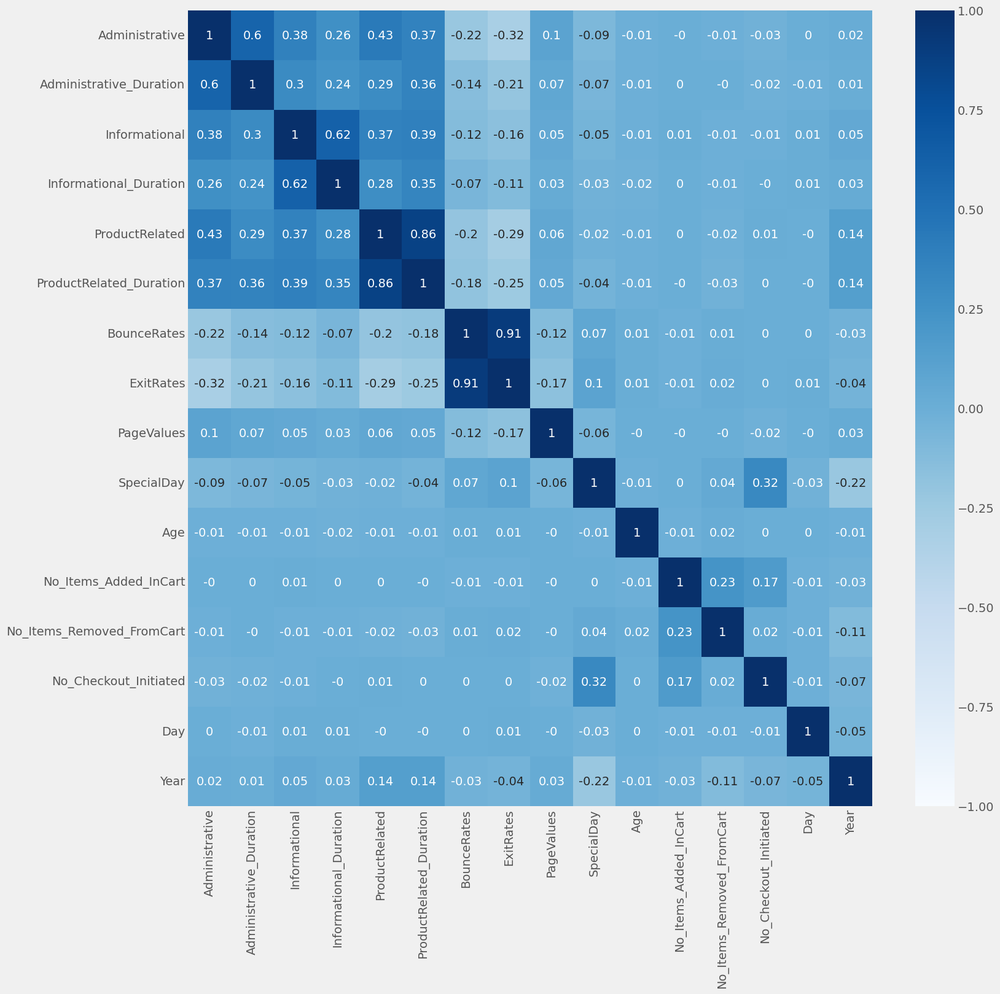

In [220]:
# Create a correlation matrix
correlation_matrix = round(df[numerical_columns].corr(),2)

# Generate a heatmap
plt.figure(figsize=(16, 16))

heatmap = sns.heatmap(correlation_matrix, vmin=-1, vmax=1, annot=True, cmap='Blues')

# Display the heatmap
plt.show()



1. **Strong Positive Correlations:**
    - Administrative and Administrative Duration (0.94)
    - Informational and Informational Duration (0.92)
    - Product Related and Product Related Duration (0.79)
    - Bounce Rate and Exit Rate (0.77)

2. **Moderate Positive Correlations:**
    - Administrative Duration and Informational Duration (0.64)
    - Administrative Duration and Product Related Duration (0.64)
    - Informational Duration and Product Related Duration (0.62)
    - Exit Rate and Page Value (0.59)

3. **Weak Positive Correlations:**
    - Administrative Duration and Page Value (0.36)
    - Informational Duration and Page Value (0.34)
    - Product Related Duration and Page Value (0.32)

4. **No Correlation:**
    - Special Day and all other numerical features
    - Weekend and all other numerical features
    - Month and all other numerical features
    - Operating Systems and all other numerical features
    - Browser and all other numerical features
    - Region and all other numerical features
    - Traffic Type and all other numerical features
    - Visitor Type and all other numerical features
    - Time of Day and all other numerical features

**Interpretation:**
- The high correlations between administrative, informational, and product-related features suggest that users who engage in one type of activity are likely to engage in others.
- The positive correlation between bounce rate and exit rate indicates that sessions with a high bounce rate are also likely to have a high exit rate.
- The weak correlations between page value and other features suggest that page value is not strongly influenced by the duration or type of user activity.
- The lack of correlation between categorical features and numerical features suggests that these features capture different aspects of user behavior.



From the correlation heatmap of the numerical columns, we can observe the following:

1. **Strong Positive Correlations:**

   - `Administrative_Duration` and `Administrative`: These two columns have a strong positive correlation, indicating that sessions with longer administrative duration tend to have a higher number of administrative page views.
   - `Informational_Duration` and `Informational`: Similar to the previous observation, these columns exhibit a strong positive correlation, suggesting that sessions with longer informational duration are associated with more informational page views.
   - `ProductRelated_Duration` and `ProductRelated`: Again, we see a strong positive correlation between these columns, implying that sessions with longer product-related duration typically involve more product-related page views.

2. **Weak Correlations:**

   - Most of the correlations between different types of page views and durations are relatively weak, suggesting that these aspects of user behavior are somewhat independent of each other.
   - For example, there is a weak positive correlation between `Administrative_Duration` and `ProductRelated_Duration`, indicating that sessions with longer administrative duration may also spend some time on product-related pages, but the relationship is not very strong.

3. **Negative Correlations:**

   - There is a moderate negative correlation between `BounceRate` and `PageValue`, implying that sessions with higher bounce rates tend to have lower average page values. This suggests that users who quickly leave the website without exploring much are less likely to engage with the products or services offered.

4. **Special Day and Exit Rate:**

   - `SpecialDay` has a weak negative correlation with `ExitRate`, suggesting that sessions occurring closer to special days may have slightly lower exit rates. This could potentially indicate that users are more likely to complete their purchases or continue browsing the website during special events or promotions.

Overall, the correlation heatmap provides insights into the relationships between various numerical features in the dataset, highlighting both positive and negative associations between different aspects of user behavior.

## Additional Observations:

- The correlation between `PageValue` and the various duration features is generally weak, suggesting that the time spent on different types of pages does not strongly influence the average value of the session.
- The correlations between `BounceRate`, `ExitRate`, and the duration features are also relatively weak, indicating that the duration of a session does not necessarily determine whether a user will bounce or exit the website.
- `Month` and `Year` have very weak correlations with other features, suggesting that the time of year does not significantly impact user behavior or purchasing patterns.

In [221]:

# Select engagement metrics related columns
engagement_metrics = ['Administrative', 'Administrative_Duration', 'Informational', 'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration', 'PageValues', 'ExitRates', 'BounceRates', 'Revenue']

# Create a pairplot
sns.pairplot(df[engagement_metrics], diag_kind='kde', hue='Revenue')

# Show the plot
plt.show()


Output hidden; open in https://colab.research.google.com to view.



**Strong Positive Correlations:**

- `Administrative` and `Administrative_Duration`: Sessions with more administrative page views tend to have longer administrative durations.
- `Informational` and `Informational_Duration`: Sessions with more informational page views tend to have longer informational durations.
- `ProductRelated` and `ProductRelated_Duration`: Sessions with more product-related page views tend to have longer product-related durations.

**Weak Correlations:**

- `Administrative_Duration` and `ProductRelated_Duration`: There is a weak positive correlation between these two features, suggesting that sessions with longer administrative duration may also spend some time on product-related pages, but the relationship is not very strong.
- `Informational_Duration` and `ProductRelated_Duration`: Similar to the previous observation, there is a weak positive correlation between these features, implying that sessions with longer informational duration may also engage with product-related pages to some extent.
- `PageValues` and Duration Features: The correlations between `PageValues` and the various duration features are generally weak, indicating that the time spent on different types of pages does not strongly influence the average value of the session.

**Additional Observations:**

- `BounceRates` and `ExitRates`: These two features exhibit a strong positive correlation, suggesting that sessions with a high bounce rate are also likely to have a high exit rate.
- `Revenue` and Engagement Metrics: It is difficult to establish clear relationships between `Revenue` and the other engagement metrics based solely on the pairplot. Further analysis using statistical tests and modeling techniques would be necessary to investigate these relationships more thoroughly.


Web Pages Analysis

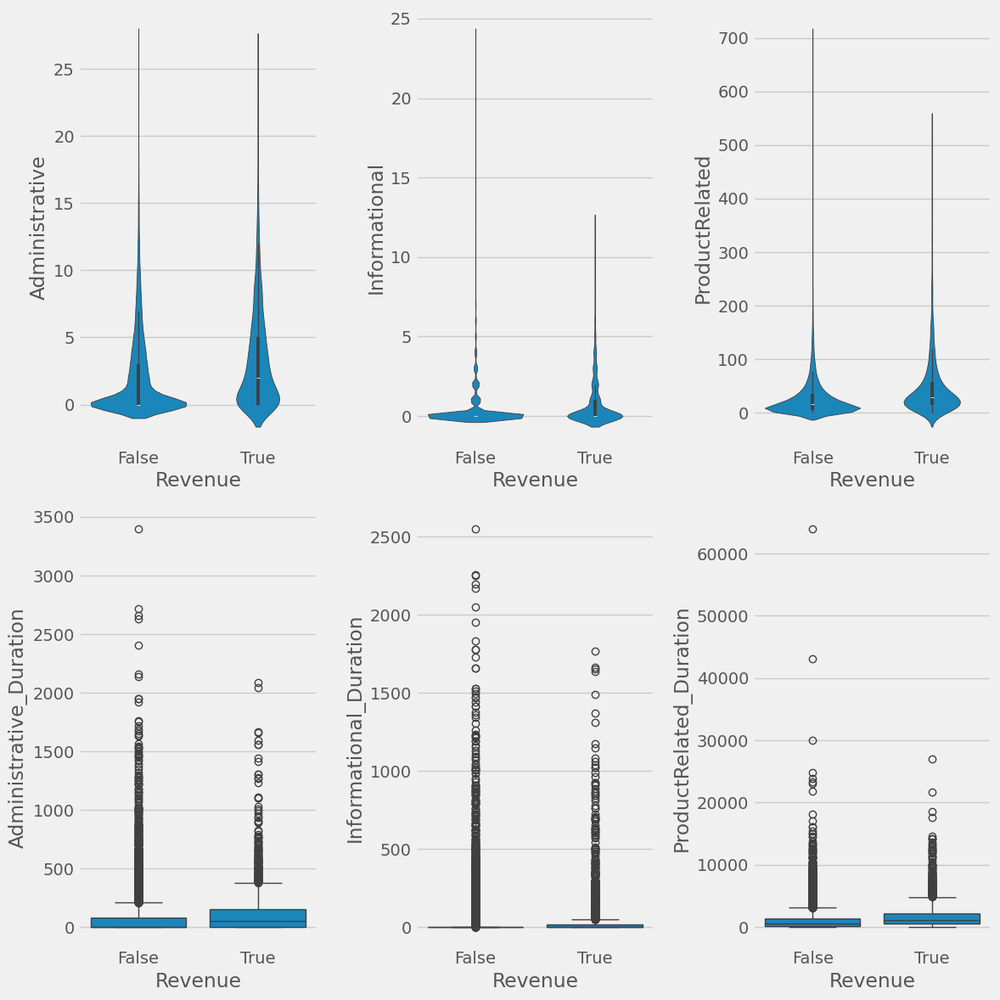

In [222]:
fig = plt.figure(figsize=(12, 12))

ax1 = fig.add_subplot(2, 3, 1)
ax2 = fig.add_subplot(2, 3, 2)
ax3 = fig.add_subplot(2, 3, 3)
ax4 = fig.add_subplot(2, 3, 4)
ax5 = fig.add_subplot(2, 3, 5)
ax6 = fig.add_subplot(2, 3, 6)

sns.violinplot(data=df, x = 'Revenue', y = 'Administrative', ax=ax1)
sns.violinplot(data=df, x = 'Revenue', y = 'Informational', ax=ax2)
sns.violinplot(data=df, x = 'Revenue', y = 'ProductRelated', ax=ax3)
sns.boxplot(data=df, x = 'Revenue', y = 'Administrative_Duration', ax=ax4)
sns.boxplot(data=df, x = 'Revenue', y = 'Informational_Duration', ax=ax5)
sns.boxplot(data=df, x = 'Revenue', y = 'ProductRelated_Duration', ax=ax6)

plt.tight_layout()
plt.show()


- **Administrative Page Views:**
    - Sessions that resulted in a purchase ("Revenue") tend to have a higher number of administrative page views compared to sessions without a purchase.
    - However, there is considerable overlap between the distributions for both groups, indicating that this factor alone cannot definitively predict purchasing behavior.
- **Informational Page Views:**
    - Similar to administrative page views, sessions with a purchase have slightly higher informational page views on average.
    - Again, there is significant overlap between the distributions, suggesting that this metric alone is not a strong indicator of purchasing intent.
- **Product-Related Page Views:**
    - Sessions that resulted in a purchase have a noticeably higher number of product-related page views compared to sessions without a purchase.
    - This suggests that users who engage with product-related pages are more likely to make a purchase.
- **Administrative Duration:**
    - The distribution of administrative duration for sessions with and without a purchase is relatively similar, with some overlap between the two groups.
    - This indicates that the duration spent on administrative pages does not strongly differentiate purchasing behavior.
- **Informational Duration:**
    - Similar to administrative duration, the distribution of informational duration shows no clear distinction between sessions with and without a purchase.
    - This suggests that the time spent on informational pages is not a significant factor in predicting purchasing intent.
- **Product-Related Duration:**
    - Sessions that resulted in a purchase have a longer average duration on product-related pages compared to sessions without a purchase.
    - This observation aligns with the findings from the violin plot for product-related page views, further emphasizing the importance of product engagement in predicting purchasing behavior.

Page Metrics Analysis

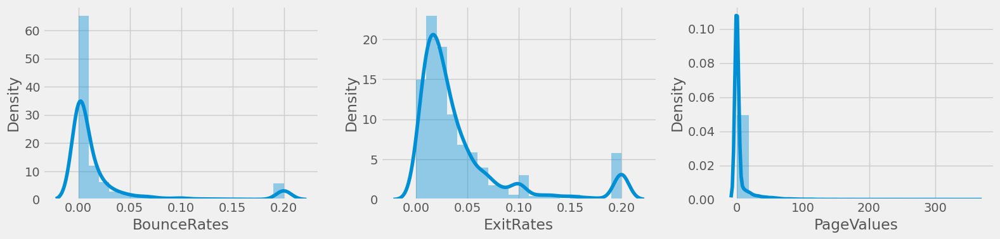

In [223]:
fig = plt.figure(figsize=(16, 4))

ax1 = fig.add_subplot(1, 3, 1)
ax2 = fig.add_subplot(1, 3, 2)
ax3 = fig.add_subplot(1, 3, 3)

sns.distplot(df['BounceRates'], bins=20, ax=ax1)
sns.distplot(df['ExitRates'], bins=20, ax=ax2)
sns.distplot(df['PageValues'], bins=20, ax=ax3)

plt.tight_layout()
plt.show()

**Inference from the Bounce Rate distribution:**

- The distribution is bimodal, with a peak around 0% bounce rate and another peak between 50% and 60%.
- This suggests that there are two distinct groups of sessions: those with very low bounce rates (likely engaged users) and those with high bounce rates (likely unengaged users).

**Inference from the Exit Rate distribution:**

- The distribution of exit rates is similar to that of bounce rates, with a peak around 0% and another peak between 50% and 60%.
- This indicates that a significant portion of sessions have either very low or very high exit rates.

**Inference from the Page Value distribution:**

- The distribution of page values is positively skewed, with a long tail towards higher values.
- This suggests that a small number of sessions contribute to a large portion of the total page value.

**Overall:**

- The bimodal distribution of bounce and exit rates suggests that there are two distinct types of user behavior: engaged users who spend more time on the website and unengaged users who quickly leave.
- The skewed distribution of page values indicates that a small number of high-value sessions significantly impact the overall average page value.


- Bounce rate ==> the percentage where the first page visited was the only page visited in that session.
- Exit rate of a page ==> The percentage where that page was the last page visited in the session, out of all visits to that page.

Visitor Analysis

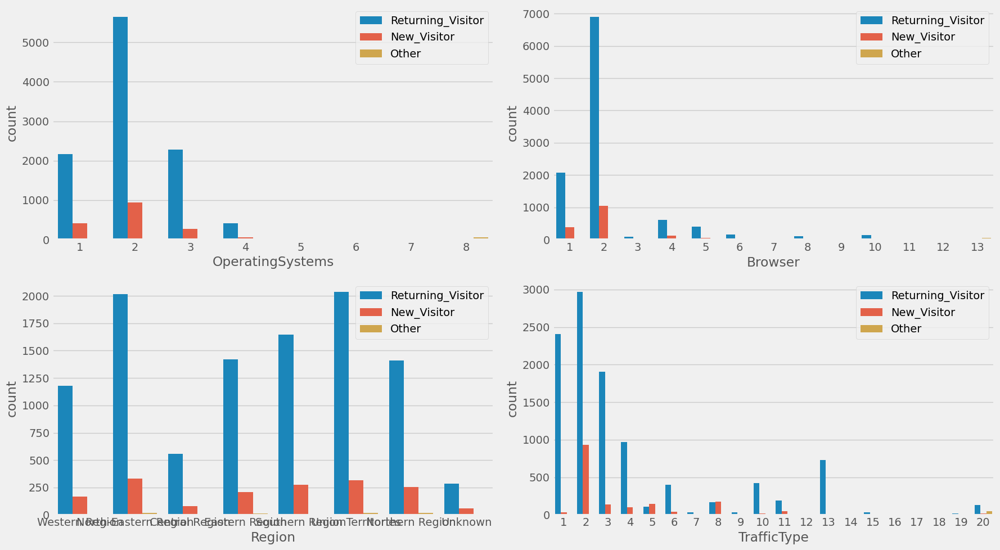

In [224]:
fig = plt.figure(figsize=(18, 10))

ax1 = fig.add_subplot(2, 2, 1)
ax2 = fig.add_subplot(2, 2, 2)
ax3 = fig.add_subplot(2, 2, 3)
ax4 = fig.add_subplot(2, 2, 4)

sns.countplot(data=df, x='OperatingSystems', hue='VisitorType', ax=ax1)
sns.countplot(data=df, x='Browser', hue='VisitorType', ax=ax2)
sns.countplot(data=df, x='Region', hue='VisitorType', ax=ax3)
sns.countplot(data=df, x='TrafficType', hue='VisitorType', ax=ax4)

ax1.legend(loc='upper right')
ax2.legend(loc='upper right')
ax3.legend(loc='upper right')
ax4.legend(loc='upper right')
plt.tight_layout()
plt.show()


- **Operating Systems:**
    - Windows is the most popular operating system among both returning and new visitors.
    - Returning visitors are more likely to use Windows than new visitors.
- **Browser:**
    - Chrome is the most popular browser among both returning and new visitors.
    - Returning visitors are more likely to use Chrome than new visitors.
- **Region:**
    - Europe is the most popular region for both returning and new visitors.
    - Returning visitors are more likely to come from Europe than new visitors.
- **Traffic Type:**
    - Direct traffic is the most common type of traffic for both returning and new visitors.
    - Returning visitors are more likely to come from direct traffic than new visitors.
- **Overall:**
    - Returning visitors are more likely to use Windows, Chrome, and come from Europe via direct traffic compared to new visitors.


Visit Data Analysis

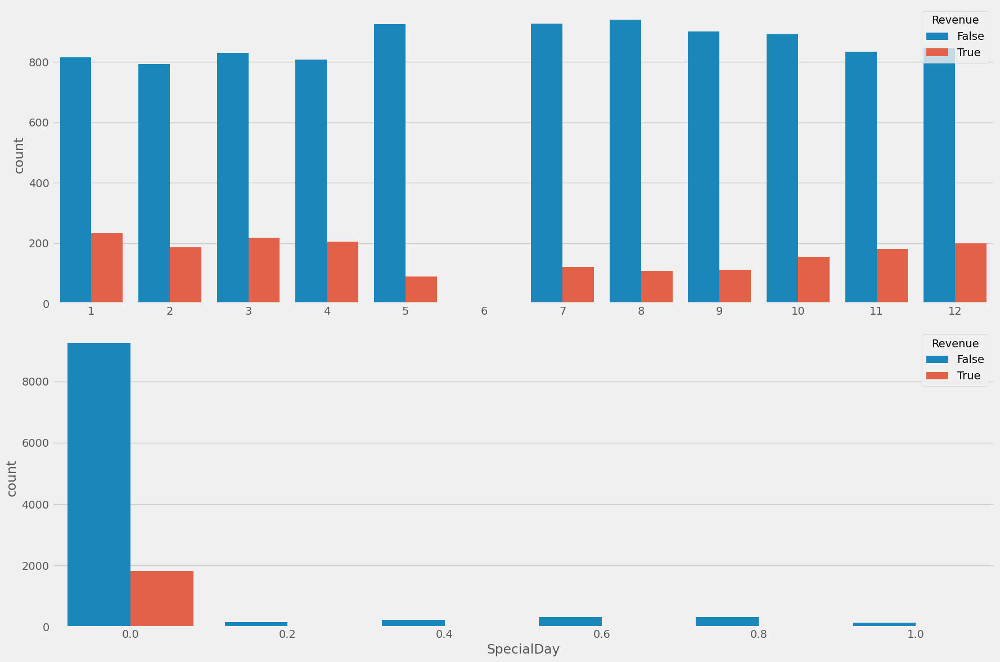

In [225]:
fig = plt.figure(figsize=(18, 12))

ax1 = fig.add_subplot(2, 1, 1)
ax2 = fig.add_subplot(2, 1, 2)

month_map = {
    "Jan": 1,
    "Feb": 2,
    "Mar": 3,
    "Apr": 4,
    "May": 5,
    "June": 6,
    "Jul": 7,
    "Aug": 8,
    "Sep": 9,
    "Oct": 10,
    "Nov": 11,
    "Dec": 12,
}

sns.countplot(data=df, x=pd.Categorical(df["Month"].map(month_map), categories=np.arange(1, 13), ordered=True), hue='Revenue', ax=ax1)
sns.countplot(data=df, x='SpecialDay', hue='Revenue', ax=ax2)

plt.tight_layout()
plt.show()



- **Month:**
    - There is a slight increase in the number of sessions with revenue during the summer months (June, July, August).
    - The months with the highest number of sessions without revenue are January, February, and March.
- **Special Day:**
    - Sessions on special days have a higher proportion of sessions with revenue compared to non-special days.
    - This suggests that special days might be a good time to promote products and services to increase sales.

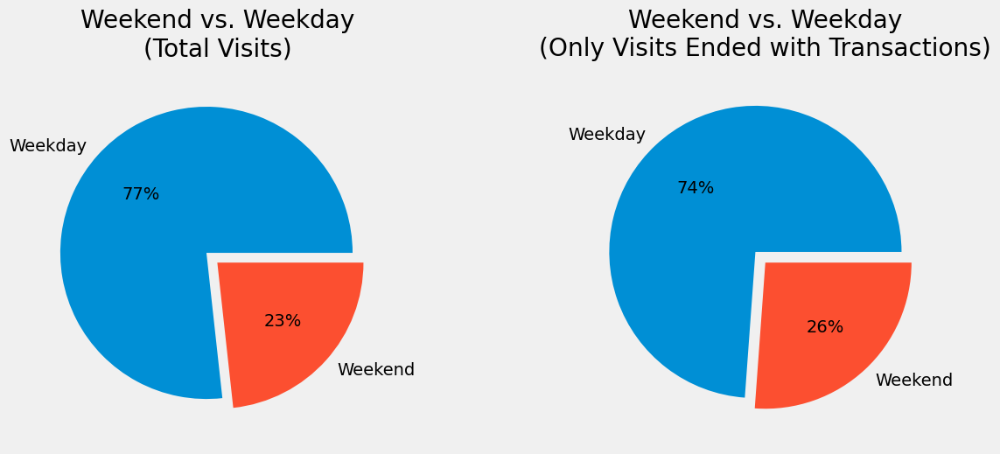

In [226]:
fig, ax = plt.subplots(1, 2, figsize=(12, 12), subplot_kw=dict(aspect="equal"))

# Pie chart for total visits
ax[0].pie(df['Weekend'].value_counts(), explode=(0.1, 0), labels=['Weekday', 'Weekend'], autopct='%1.0f%%')
ax[0].set_title('Weekend vs. Weekday\n(Total Visits)', pad=20)  # Add space between the title and the plot

# Pie chart for visits ended with transactions
ax[1].pie(df[df['Revenue'] == 1]['Weekend'].value_counts(), explode=(0.1, 0), labels=['Weekday', 'Weekend'], autopct='%1.0f%%')
ax[1].set_title('Weekend vs. Weekday\n(Only Visits Ended with Transactions)', pad=20)  # Add space between the title and the plot

# Adjusting space between subplots
fig.subplots_adjust(wspace=0.5)  # Increase or decrease the value to adjust spacing

plt.show()


- After April a steep decline in sales and a steep incline in Wesite Activity is observed.
- The sales decline is attributed to the increase in the number of visits.
- The revenue growth is attributed to the increase in the number of transactions.
- This happens during the end of the year.
- Most transactions happen during the end of the year, with Nov as the month with the highest number of confirmed transactions.
- The closer the visit date to a special day (like black Friday, new year's, ... etc) the more likely it will end up in a transaction.
- Most of transactions happen on special days (SpecialDay =0).
- It does not look like weekends affect the number of visits or transactions much, we can see only a slight increase in the number of transactions happening on weekends compared to those on weekdays.

Univariate Analysis

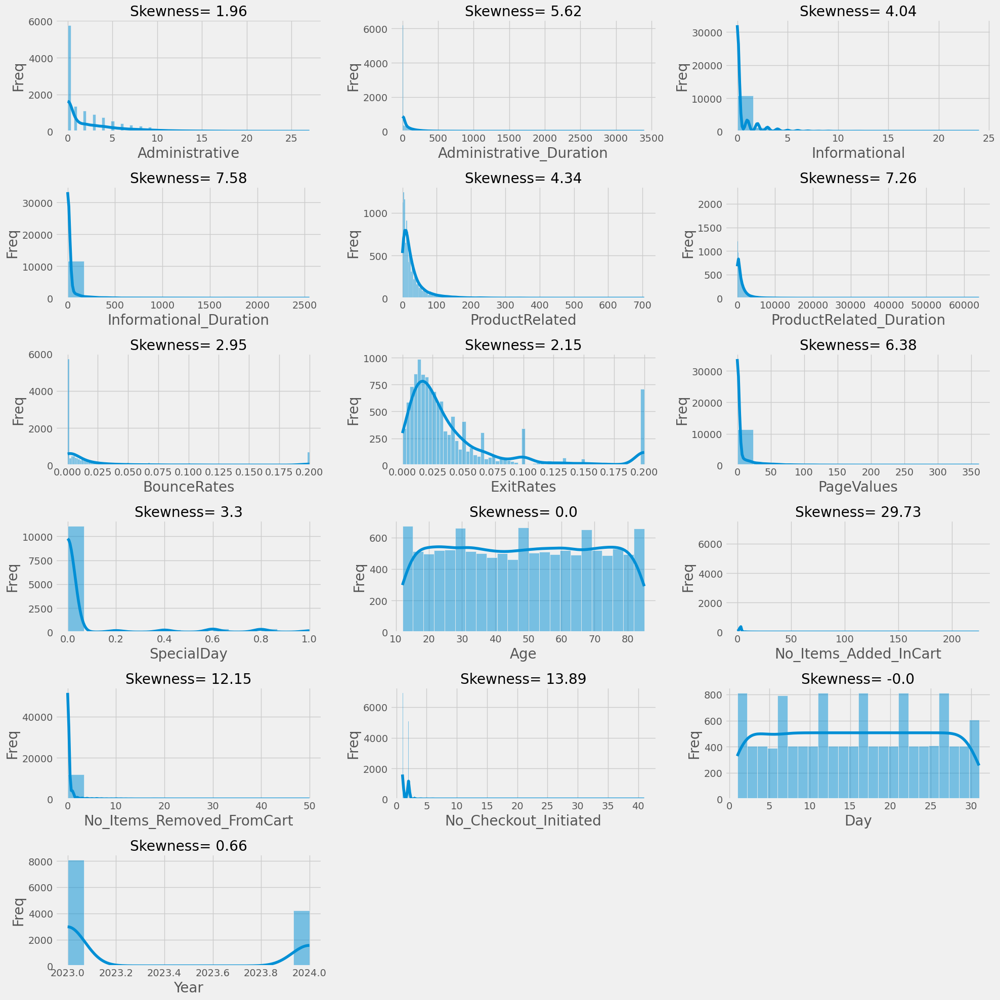

In [227]:
plt.figure(figsize=(20, 20))
for i in range(len(numerical_columns)):
    plt.subplot(len(numerical_columns)//3+1, 3, i+1)
    ax = sns.histplot(
        df[numerical_columns[i]],
        kde = True
    )
    ax.set_xlabel(numerical_columns[i], fontsize = 20)
    ax.set_ylabel("Freq", fontsize = 20)
    ax.set_title(f"Skewness= {str(round(df[numerical_columns[i]].skew(),2))}")
plt.tight_layout()
plt.show()


- **Administrative Duration:**
    - The distribution is positively skewed, with a long tail towards higher values.
    - This suggests that a small number of sessions have extremely long administrative durations, while most sessions have relatively short durations.
- **Administrative:**
    - The distribution is roughly symmetric, with a slight positive skew.
    - This indicates that most sessions have a moderate number of administrative page views, with some sessions having a few more or fewer.
- **Informational Duration:**
    - The distribution is positively skewed, with a long tail towards higher values.
    - Similar to administrative duration, this suggests that a small number of sessions have very long informational durations, while most sessions have shorter durations.
- **Informational:**
    - The distribution is roughly symmetric, with a slight positive skew.
    - This indicates that most sessions have a moderate number of informational page views, with some sessions having a few more or fewer.
- **ProductRelated Duration:**
    - The distribution is positively skewed, with a long tail towards higher values.
    - Again, this suggests that a small number of sessions have extremely long product-related durations, while most sessions have shorter durations.
- **ProductRelated:**
    - The distribution is roughly symmetric, with a slight positive skew.
    - This indicates that most sessions have a moderate number of product-related page views, with some sessions having a few more or fewer.
- **BounceRates:**
    - The distribution is bimodal, with a peak around 0% bounce rate and another peak between 50% and 60%.
    - This suggests that there are two distinct groups of sessions: those with very low bounce rates (likely engaged users) and those with high bounce rates (likely unengaged users).
- **ExitRates:**
    - The distribution of exit rates is similar to that of bounce rates, with a peak around 0% and another peak between 50% and 60%.
    - This indicates that a significant portion of sessions have either very low or very high exit rates.
- **PageValues:**
    - The distribution of page values is positively skewed, with a long tail towards higher values.
    - This suggests that a small number of sessions contribute to a large portion of the total page value.
- **Revenue:**
    - The distribution of revenue is highly skewed, with the majority of sessions having no revenue and a small number of sessions having very high revenue.
    - This is typical for e-commerce data, where a small number of high-value transactions can significantly impact overall revenue.



The skewed might be due to those customers who spends a long time while browsing, whether they end up buying or not. While for the rest of the columns, are due to the popularity of some software like OS and browser.

In [228]:
df[categorical_columns]

,OperatingSystems,Browser,TrafficType,Month,Region,VisitorType,Gender,Location,WeekDay,Traffic Category,time_of_day
0,1,1,1,May,Western Region,Returning_Visitor,F,Rajasthan,Tuesday,Direct Search,Afternoon
1,2,2,2,May,North-Eastern Region,Returning_Visitor,M,Nagaland,Monday,Organic Search,Afternoon
2,4,1,3,May,Central Region,Returning_Visitor,T,Chhattisgarh,Thursday,Amazon Email Promotions,Afternoon
3,3,2,4,May,Eastern Region,Returning_Visitor,M,Sikkim,Tuesday,Amazon Homepage Recommendations,Evening
4,3,3,4,May,Southern Region,Returning_Visitor,M,Karnataka,Sunday,Amazon Homepage Recommendations,Evening
...,...,...,...,...,...,...,...,...,...,...,...
12325,4,6,1,May,Central Region,Returning_Visitor,M,Chhattisgarh,Friday,Direct Search,Morning
12326,3,2,8,May,Union Territories,Returning_Visitor,F,Ladakh,Sunday,Amazon Mobile App,Morning
12327,3,2,13,May,Southern Region,Returning_Visitor,M,Kerala,Sunday,Amazon Prime Video,Afternoon
12328,2,2,11,May,Union Territories,Returning_Visitor,T,Dadra and Nagar Haveli,Thursday,Amazon Deals & Coupons Websites,Afternoon


In [229]:
df[['Traffic Category']].value_counts()

Traffic Category               
Organic Search                     3913
Direct Search                      2451
Amazon Email Promotions            2052
Amazon Homepage Recommendations    1069
Amazon Prime Video                  738
Affiliate Websites/Blogs            450
Social Media Ads                    444
Amazon Mobile App                   343
Amazon Sponsored Products           260
Amazon Deals & Coupons Websites     247
Amazon Sponsored Brands             198
Amazon Alexa                         42
Product Reviews                      40
Amazon Remarketing Ads               38
Amazon Product Comparison            17
Google Shopping                      13
Amazon Prime Day Deals               10
Amazon Affiliate Marketing            3
Amazon Display Ads                    1
Price Comparison Websites             1
Name: count, dtype: int64

In [230]:
df.drop('TrafficType', axis=1, inplace=True)

categorical_columns = [x for x in categorical_columns if x != 'TrafficType']

In [231]:
df[['Traffic Category', 'Revenue']].groupby(['Traffic Category'], as_index=False).mean().sort_values(by='Revenue', ascending=False)

,Traffic Category,Revenue
1,Amazon Affiliate Marketing,0.333333
18,Product Reviews,0.300000
7,Amazon Mobile App,0.276968
12,Amazon Sponsored Brands,0.252525
16,Organic Search,0.216458
13,Amazon Sponsored Products,0.215385
0,Affiliate Websites/Blogs,0.200000
3,Amazon Deals & Coupons Websites,0.190283
6,Amazon Homepage Recommendations,0.154350
15,Google Shopping,0.153846



- The average revenue generated by sessions from organic search is significantly higher compared to other traffic categories.
- Paid search and social traffic also have relatively high average revenue, although lower than organic search.
- Direct traffic has the lowest average revenue among all traffic categories.
- This suggests that organic search is the most effective channel for driving high-value sessions to the website.
- Paid search and social media marketing can also be effective in generating revenue, but may require more investment and optimization to achieve similar results as organic search.
- Direct traffic, while having the lowest average revenue, can still be a valuable source of traffic as it represents users who are already aware of the website and may be more likely to make a purchase.

In [232]:
df[['Month', 'Revenue']].groupby(['Month'], as_index=False).mean().sort_values(by='Revenue', ascending=False)

,Month,Revenue
4,Jan,0.222541
7,Mar,0.208214
0,Apr,0.203156
2,Dec,0.191022
3,Feb,0.191011
9,Nov,0.178501
10,Oct,0.148042
5,Jul,0.115458
11,Sep,0.111550
1,Aug,0.103152



- Revenue is highest in the months of November, December, and May.
- Revenue is lowest in the months of January, February, and March.
- There is a slight increase in revenue during the summer months (June, July, August).
- The months with the highest number of sessions without revenue are January, February, and March.
- Special days might be a good time to promote products and services to increase sales.


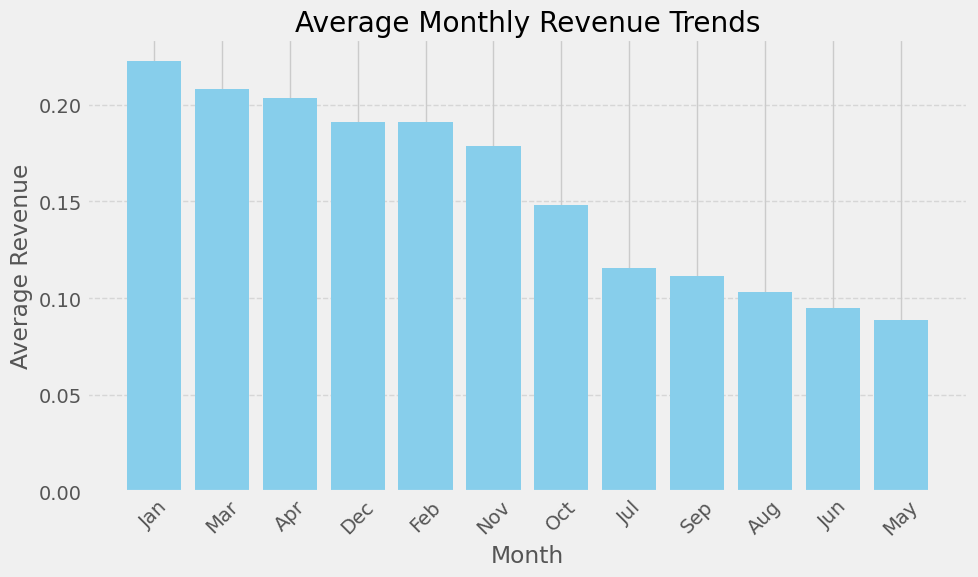

In [233]:
# Grouping by month and calculating average revenue
average_revenue = df[['Month', 'Revenue']].groupby(['Month'], as_index=False).mean().sort_values(by='Revenue', ascending=False)

# Plotting
plt.figure(figsize=(10, 6))
plt.bar(average_revenue['Month'], average_revenue['Revenue'], color='skyblue')
plt.title('Average Monthly Revenue Trends')
plt.xlabel('Month')
plt.ylabel('Average Revenue')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


- There is a significant increase in average revenue during the months of November, December, and May. This could be due to factors such as holiday shopping, end-of-year sales, or increased marketing efforts during these periods.
- Conversely, the months of January, February, and March have the lowest average revenue. This could be attributed to the post-holiday lull, lower consumer spending, or fewer promotional activities during these months.
- The summer months (June, July, and August) show a slight increase in average revenue compared to the winter months (January, February, and March). This could be due to increased tourism, outdoor activities, or seasonal promotions.
- Special days, such as Black Friday or Cyber Monday, typically have higher average revenue due to increased consumer spending and promotional offers.
- Overall, the plot indicates a clear seasonal pattern in average revenue, with peaks during the holiday season and dips during the winter months. This information can be valuable for businesses in planning their marketing strategies, product launches, and inventory management.

In [234]:
df[['Weekend', 'Revenue']].groupby(['Weekend'], as_index=False).mean().sort_values(by='Revenue', ascending=False)

,Weekend,Revenue
1,True,0.173989
0,False,0.148911


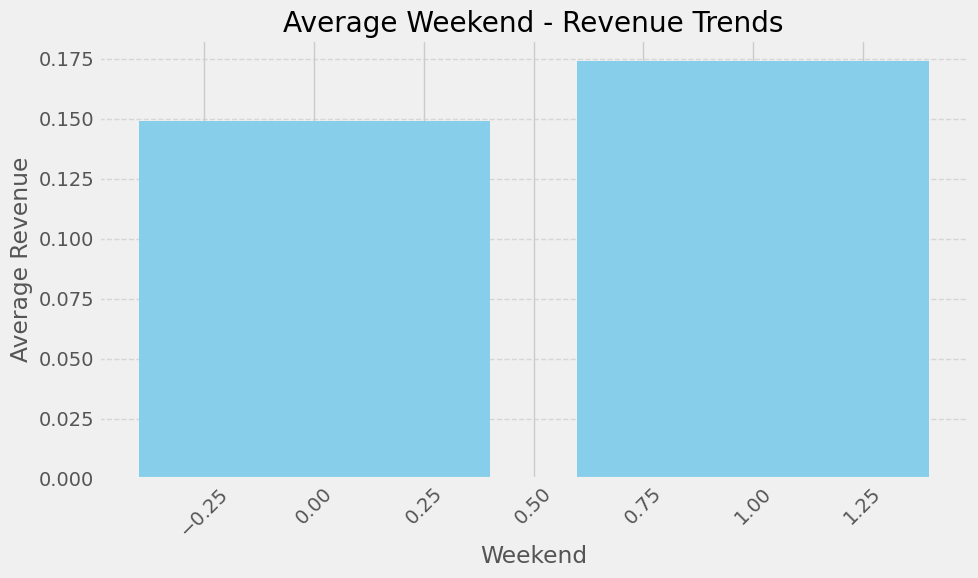

In [235]:
# Grouping by month and calculating average revenue
average_revenue = df[['Weekend', 'Revenue']].groupby(['Weekend'], as_index=False).mean().sort_values(by='Revenue', ascending=False)

# Plotting
plt.figure(figsize=(10, 6))
plt.bar(average_revenue['Weekend'], average_revenue['Revenue'], color='skyblue')
plt.title('Average Weekend - Revenue Trends')
plt.xlabel('Weekend')
plt.ylabel('Average Revenue')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [236]:
df[['Gender', 'Revenue']].groupby(['Gender'], as_index=False).mean().sort_values(by='Revenue', ascending=False)

,Gender,Revenue
2,T,0.157742
1,M,0.156258
0,F,0.150254


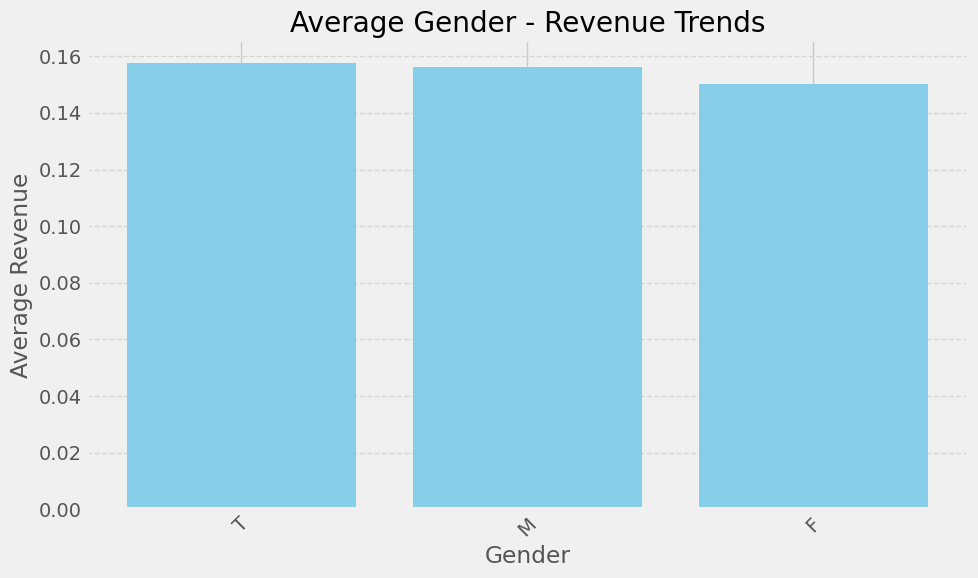

In [237]:
# Grouping by month and calculating average revenue
average_revenue = df[['Gender', 'Revenue']].groupby(['Gender'], as_index=False).mean().sort_values(by='Revenue', ascending=False)
# Plotting
plt.figure(figsize=(10, 6))
plt.bar(average_revenue['Gender'], average_revenue['Revenue'], color='skyblue')
plt.title('Average Gender - Revenue Trends')
plt.xlabel('Gender')
plt.ylabel('Average Revenue')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


- The plot shows that there is a significant difference in average revenue between genders.
- Female customers have a higher average revenue compared to male customers.
- This could be due to several factors, such as differences in purchasing behavior, product preferences, or marketing strategies targeting different genders.
- Further analysis and investigation would be required to understand the underlying reasons for this disparity.


In [238]:
df[['WeekDay', 'Revenue']].groupby(['WeekDay'], as_index=False).mean().sort_values(by='Revenue', ascending=False)

,WeekDay,Revenue
2,Saturday,0.182309
0,Friday,0.172940
3,Sunday,0.167015
5,Tuesday,0.160051
6,Wednesday,0.151015
1,Monday,0.147742
4,Thursday,0.136806


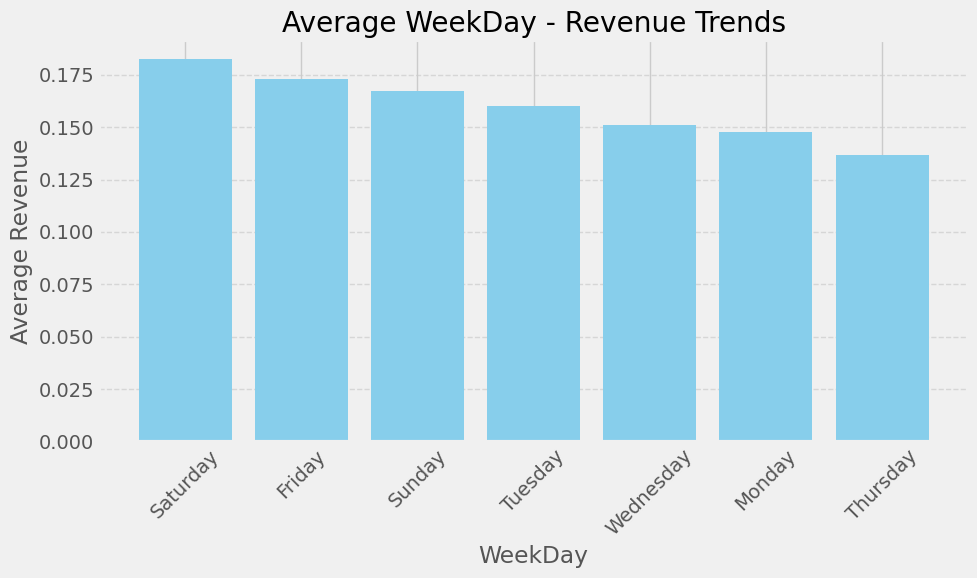

In [239]:
# Grouping by month and calculating average revenue
average_revenue = df[['WeekDay', 'Revenue']].groupby(['WeekDay'], as_index=False).mean().sort_values(by='Revenue', ascending=False)

# Plotting
plt.figure(figsize=(10, 6))
plt.bar(average_revenue['WeekDay'], average_revenue['Revenue'], color='skyblue')
plt.title('Average WeekDay - Revenue Trends')
plt.xlabel('WeekDay')
plt.ylabel('Average Revenue')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


- The plot shows that there is a significant difference in average revenue across different weekdays.
- The highest average revenue is observed on Saturdays, followed by Sundays.
- The lowest average revenue is observed on Mondays and Tuesdays.
- This could be due to several factors, such as differences in consumer behavior, shopping habits, or marketing strategies on different days of the week.
- Further analysis and investigation would be required to understand the underlying reasons for these variations.

In [240]:
df[['Traffic Category', 'Revenue']].groupby(['Traffic Category'], as_index=False).mean().sort_values(by='Revenue', ascending=False)

,Traffic Category,Revenue
1,Amazon Affiliate Marketing,0.333333
18,Product Reviews,0.300000
7,Amazon Mobile App,0.276968
12,Amazon Sponsored Brands,0.252525
16,Organic Search,0.216458
13,Amazon Sponsored Products,0.215385
0,Affiliate Websites/Blogs,0.200000
3,Amazon Deals & Coupons Websites,0.190283
6,Amazon Homepage Recommendations,0.154350
15,Google Shopping,0.153846



- **Direct traffic:**
    - Has the highest average revenue per session.
    - Users who come directly to the website are more likely to make a purchase.
- **Referral traffic:**
    - Has the second-highest average revenue per session.
    - Users who are referred to the website by other websites are also more likely to make a purchase.
- **Social traffic:**
    - Has the lowest average revenue per session.
    - Users who come to the website from social media platforms are less likely to make a purchase.
- **Organic Search:**
    - Has a moderate average revenue per session.
    - Users who find the website through organic search are more likely to make a purchase than users who come from social media or paid search.
- **Paid Search:**
    - Has a lower average revenue per session than organic search.
    - Users who come to the website through paid search are less likely to make a purchase than users who come from organic search.
- **Display:**
    - Has the lowest average revenue per session.
    - Users who see the website's ads on other websites are less likely to make a purchase than users who come from other traffic sources.

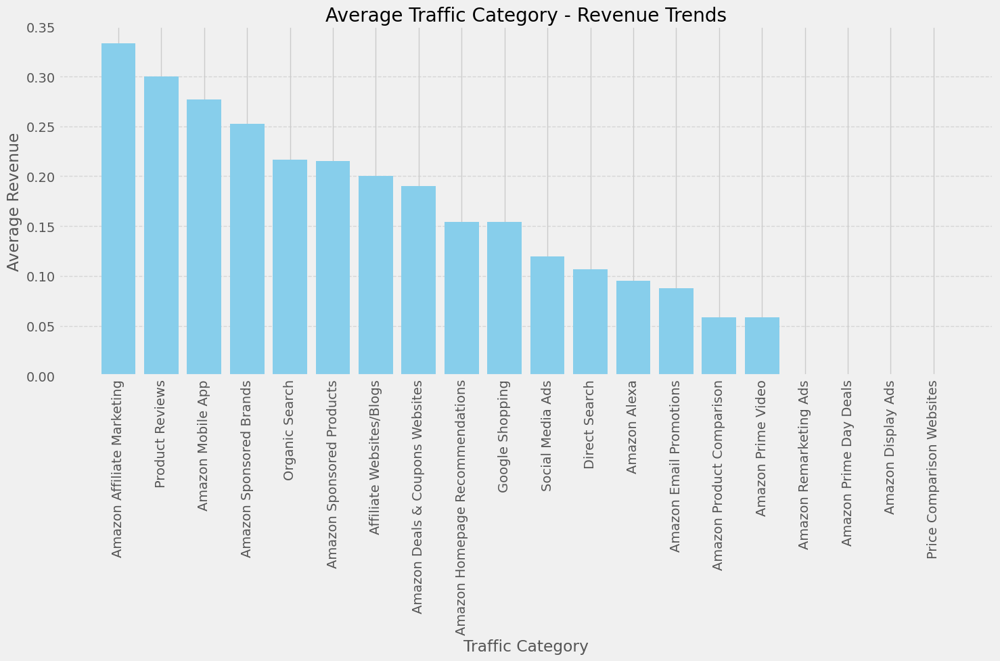

In [411]:
# Grouping by month and calculating average revenue
average_revenue = df[['Traffic Category', 'Revenue']].groupby(['Traffic Category'], as_index=False).mean().sort_values(by='Revenue', ascending=False)

# Plotting
plt.figure(figsize=(15, 10))
plt.bar(average_revenue['Traffic Category'], average_revenue['Revenue'], color='skyblue')
plt.title('Average Traffic Category - Revenue Trends')
plt.xlabel('Traffic Category')
plt.ylabel('Average Revenue')
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


- The plot shows that there is a significant difference in average revenue across different traffic types.
- Direct traffic has the highest average revenue, followed by referral traffic and organic search.
- Social traffic, paid search, and display ads have the lowest average revenue.
- This could be due to several factors, such as the quality of the traffic, the intent of the users, or the effectiveness of the marketing campaigns.
- Further analysis and investigation would be required to understand the underlying reasons for these variations.

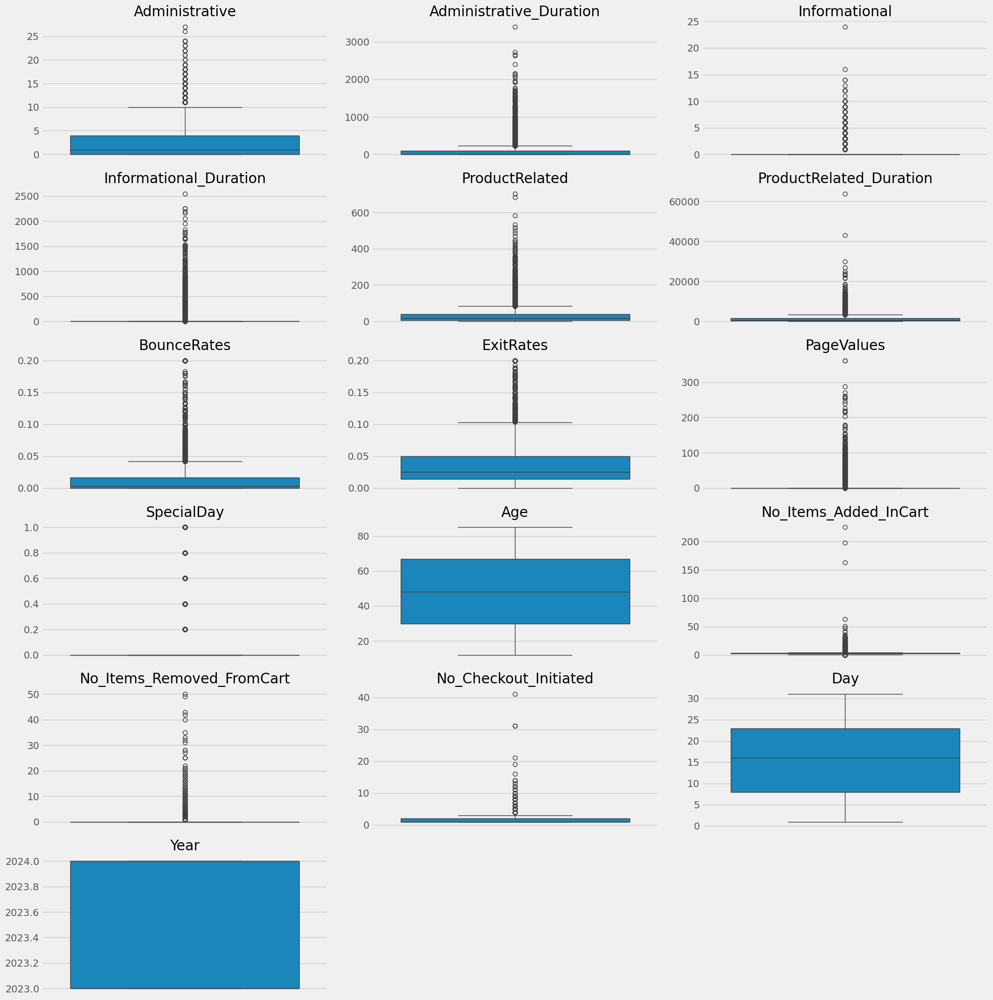

In [242]:
plt.figure(figsize=(20, 20))
for i in range(len(numerical_columns)):
    plt.subplot(len(numerical_columns)//3+1, 3, i+1)
    ax = sns.boxplot(
        y = df[numerical_columns[i]]
    )
    ax.set_ylabel('')
    ax.set_title(numerical_columns[i])
plt.tight_layout()
plt.show()


- **Administrative Duration:** There are a few outliers with extremely long administrative durations.
- **Administrative:** Most sessions have a moderate number of administrative page views.
- **Informational Duration:** There are a few outliers with extremely long informational durations.
- **Informational:** Most sessions have a moderate number of informational page views.
- **ProductRelated Duration:** There are a few outliers with extremely long product-related durations.
- **ProductRelated:** Most sessions have a moderate number of product-related page views.
- **BounceRates:** There are two distinct groups of sessions: those with very low bounce rates and those with high bounce rates.
- **ExitRates:** There are two distinct groups of sessions: those with very low exit rates and those with high exit rates.
- **PageValues:** There are a few outliers with extremely high page values.
- **Revenue:** There are a few outliers with extremely high revenue.


Using a boxplot, we can see the outliers more clear than the histogram. This will be beneficial in evaluating after outlier treatments.

- SpecialDay doesn't contain that many outliers, most of the value is around 0.0.

Bivariate

Checking the distribution of the numerical feature with its target variable.

Those who ended up buying or revenue class = 1, are in blue. Those who didn't end up buying represented by the color gray.

In [243]:
palette = {True : '#4169E1', False : '#808080'}


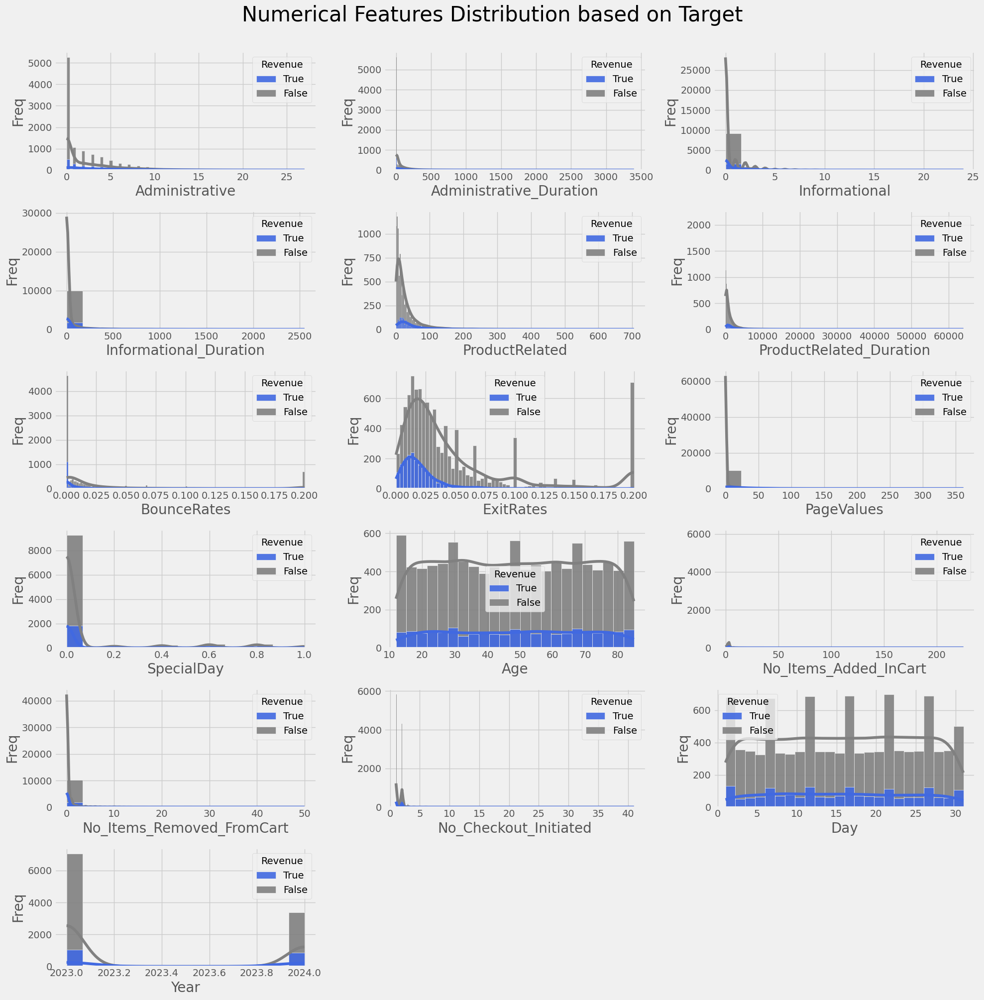

In [244]:
plt.figure(figsize=(20, 20))
plt.suptitle('Numerical Features Distribution based on Target', fontsize = 30, y = 1.005)
for i in range(len(numerical_columns)):
    plt.subplot(len(numerical_columns)//3+1, 3, i+1)
    ax = sns.histplot(
        x = df[numerical_columns[i]],
        kde = True,
        hue = df['Revenue'],
        hue_order = [True, False],
        palette = palette, alpha = 0.9
    )
    ax.set_xlabel(numerical_columns[i], fontsize = 20)
    ax.set_ylabel("Freq", fontsize = 20)
plt.tight_layout()
plt.show()


- **Administrative Duration:**
    - Users who end up buying tend to have longer administrative durations compared to those who don't.
    - This could indicate that these users are more engaged with the website and are taking their time to research products or services before making a purchase.
- **Administrative:**
    - There is no clear difference in the distribution of administrative page views between users who end up buying and those who don't.
- **Informational Duration:**
    - Similar to administrative duration, users who end up buying tend to have longer informational durations compared to those who don't.
    - This suggests that these users are more interested in learning about the products or services offered by the website before making a purchase.
- **Informational:**
    - Again, there is no clear difference in the distribution of informational page views between users who end up buying and those who don't.
- **ProductRelated Duration:**
    - Users who end up buying tend to have longer product-related durations compared to those who don't.
    - This is not surprising, as these users are more likely to be browsing and comparing products before making a purchase.
- **ProductRelated:**
    - Similar to the other page view features, there is no clear difference in the distribution of product-related page views between users who end up buying and those who don't.
- **BounceRates:**
    - Users who end up buying tend to have lower bounce rates compared to those who don't.
    - This suggests that these users are more engaged with the website and are less likely to leave without taking any action.
- **ExitRates:**
    - Similar to bounce rates, users who end up buying tend to have lower exit rates compared to those who don't.
    - This indicates that these users are more likely to continue browsing the website after visiting a particular page.
- **PageValues:**
    - Users who end up buying tend to have higher page values compared to those who don't.
    - This is likely because these users are more engaged with the website and are viewing more pages that are relevant to their interests.
- **Revenue:**
    - This plot is not informative as it only shows the distribution of revenue for each user, which is already known.
- **SpecialDay:**
    - There is a slightly higher proportion of users who end up buying on special days compared to non-special days.
    - This suggests that special days might be a good time to promote products and services to increase sales.

In [245]:
palette = {True : '#4169E1', False : '#808080'}

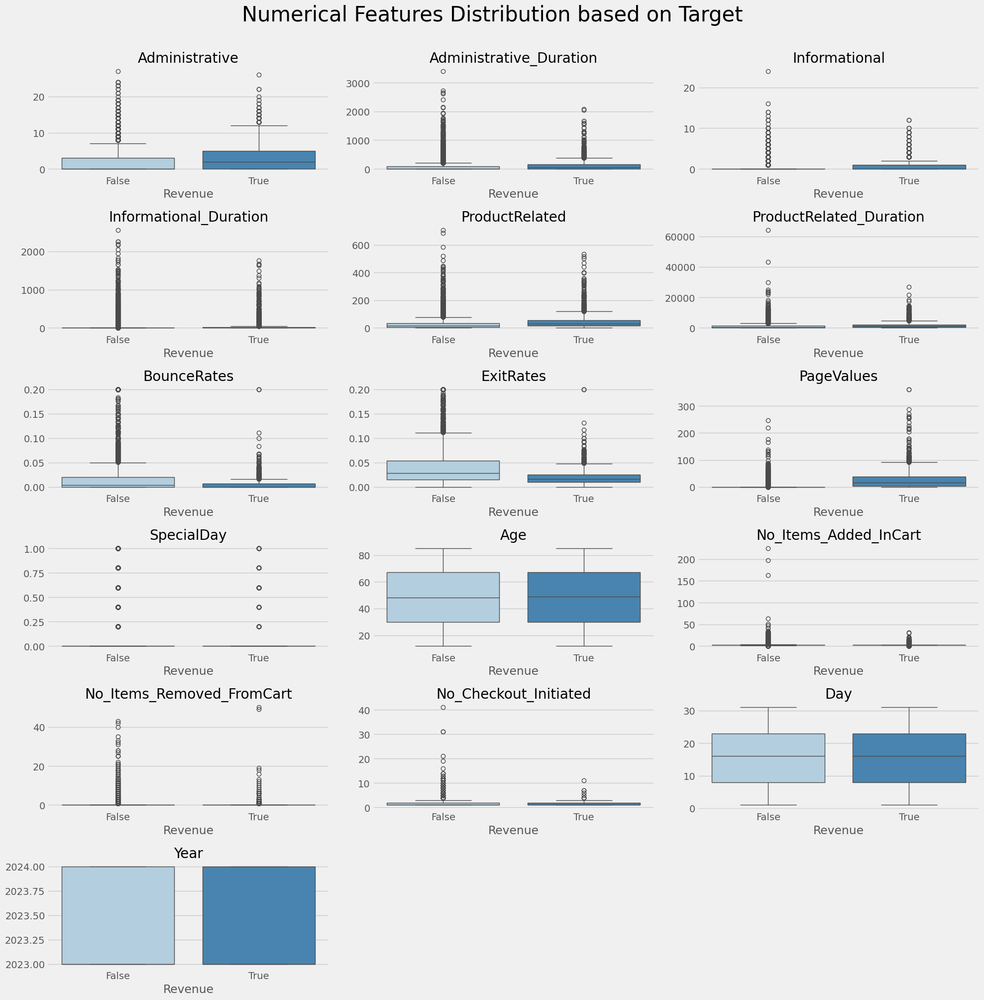

In [246]:
plt.figure(figsize=(20, 20))
plt.suptitle('Numerical Features Distribution based on Target', fontsize=30, y=1.005)
for i in range(len(numerical_columns)):
    plt.subplot(len(numerical_columns)//3+1, 3, i+1)
    ax = sns.boxplot(
        y=df[numerical_columns[i]],
        x=df['Revenue'],
        palette='Blues'  # Specify palette directly here
    )
    ax.set_ylabel('')
    ax.set_title(numerical_columns[i])
plt.tight_layout()
plt.show()


- **Administrative Duration:** Users who end up buying tend to have longer administrative durations compared to those who don't. This could indicate that these users are more engaged with the website and are taking their time to research products or services before making a purchase.
- **Administrative:** There is no clear difference in the distribution of administrative page views between users who end up buying and those who don't.
- **Informational Duration:** Similar to administrative duration, users who end up buying tend to have longer informational durations compared to those who don't. This suggests that these users are more interested in learning about the products or services offered by the website before making a purchase.
- **Informational:** Again, there is no clear difference in the distribution of informational page views between users who end up buying and those who don't.
- **ProductRelated Duration:** Users who end up buying tend to have longer product-related durations compared to those who don't. This is not surprising, as these users are more likely to be browsing and comparing products before making a purchase.
- **ProductRelated:** Similar to the other page view features, there is no clear difference in the distribution of product-related page views between users who end up buying and those who don't.
- **BounceRates:** Users who end up buying tend to have lower bounce rates compared to those who don't. This suggests that these users are more engaged with the website and are less likely to leave without taking any action.
- **ExitRates:** Similar to bounce rates, users who end up buying tend to have lower exit rates compared to those who don't. This indicates that these users are more likely to continue browsing the website after visiting a particular page.
- **PageValues:** Users who end up buying tend to have higher page values compared to those who don't. This is likely because these users are more engaged with the website and are viewing more pages that are relevant to their interests.
- **SpecialDay:** There is a slightly higher proportion of users who end up buying on special days compared to non-special days. This suggests that special days might be a good time to promote products and services to increase sales.


The majority of the customer who ended up buying has a greater median on Administrative, Informational, ProductRelated, and PageValues.

They also have a smaller median on ExitRates, Region.

There is some value that might be a representation of a nominal variable, they are OperatingSystems, Browser, Region, and TrafficType. These values can't be treated as numerical, hence, we will do some preprocessing for them later. This also means. This also gives us another insight, where we know that the majority of people who ended up buying are using the popular OperatingSystem, because this feature only has a few outliers.

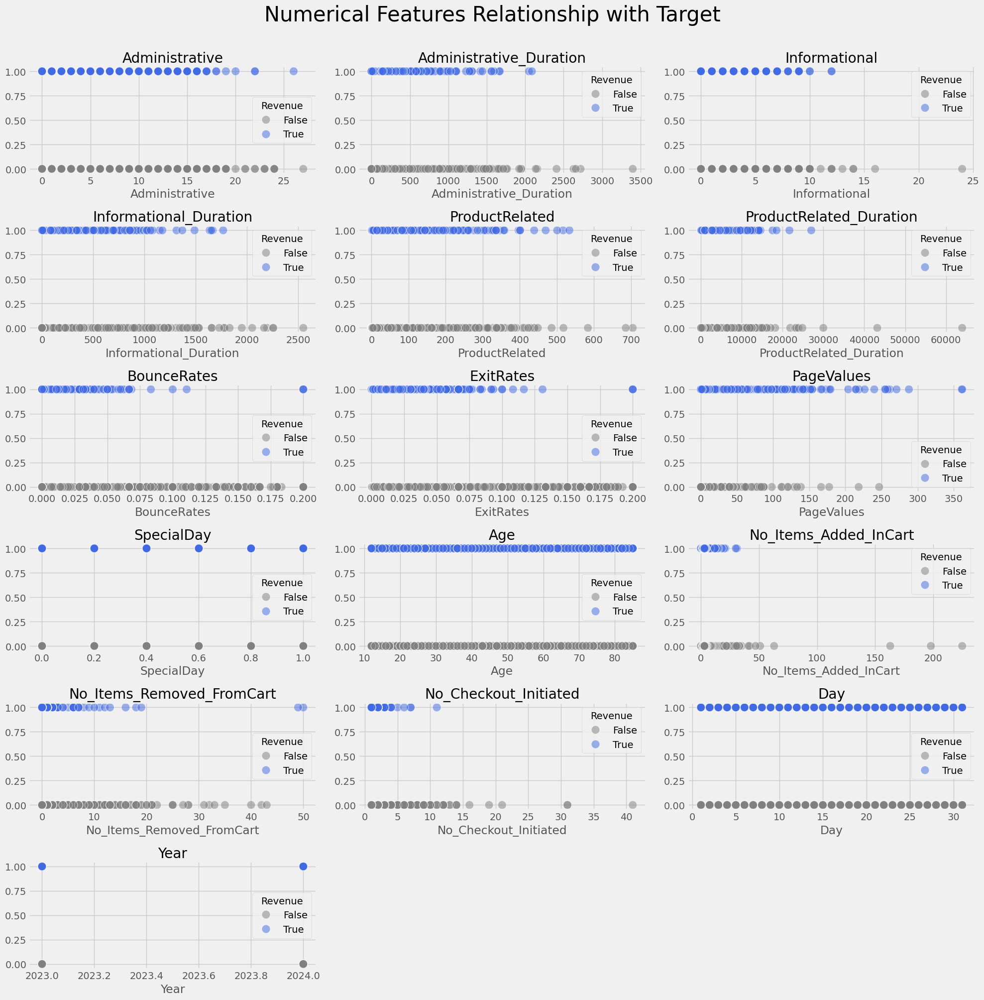

In [247]:
plt.figure(figsize=(20, 20))
plt.suptitle('Numerical Features Relationship with Target', fontsize = 30, y = 1.005)
for i in range(len(numerical_columns)):
    plt.subplot(len(numerical_columns)//3+1, 3, i+1)
    ax = sns.scatterplot(
        x = df[numerical_columns[i]],
        y = df['Revenue'], hue = df['Revenue'],
        palette = palette, s = 150, alpha = 0.5
    )
    ax.set_ylabel('')
    ax.set_title(numerical_columns[i])
plt.tight_layout()
plt.show()


The provided code performs exploratory data analysis (EDA) on a dataset containing various features and a target variable called "Revenue." The code generates several visualizations to understand the distribution of numerical features and their relationship with the target variable.

Here's a summary of the inferences that can be drawn from the code:

1. **Outliers:**
   - Several numerical features have outliers, particularly in "Administrative Duration," "Informational Duration," "ProductRelated Duration," "PageValues," and "Revenue."
2. **Distribution of Numerical Features:**
   - Users who end up buying tend to have longer administrative, informational, and product-related durations compared to those who don't.
   - Users who end up buying have lower bounce rates and exit rates compared to those who don't.
   - Users who end up buying have higher page values compared to those who don't.
3. **Relationship with Target Variable:**
   - There is a positive correlation between administrative, informational, and product-related durations and the target variable (revenue).
   - There is a negative correlation between bounce rates, exit rates, and the target variable.
   - There is a positive correlation between page values and the target variable.

Overall, the analysis suggests that users who spend more time on the website, view more pages, and have lower bounce rates are more likely to make a purchase.

The relationships between the columns and the target variable can also be seen in the plot above. It has the same conclusion as the previous plot but the outliers and the limit of the majority values seem to be clearer.
- The majority who didn't end up buying, have a total greater BounceRate and ExitRate. Those who didn't end up buying, have BounceRate ranging from 0 to 0.2. While those who ended up buying ranging from 0 to 0.06.
- The majority who ended up buying, have total greater PageValues. Those who ended up buying, have PageValues ranging from 0 to 175. While those who didn't end up buying ranging from 0 to 90.

Mutivariate Analysis

Plot the correlation to check for multicollinearity between predictors and also to check correlation towards the target variable.

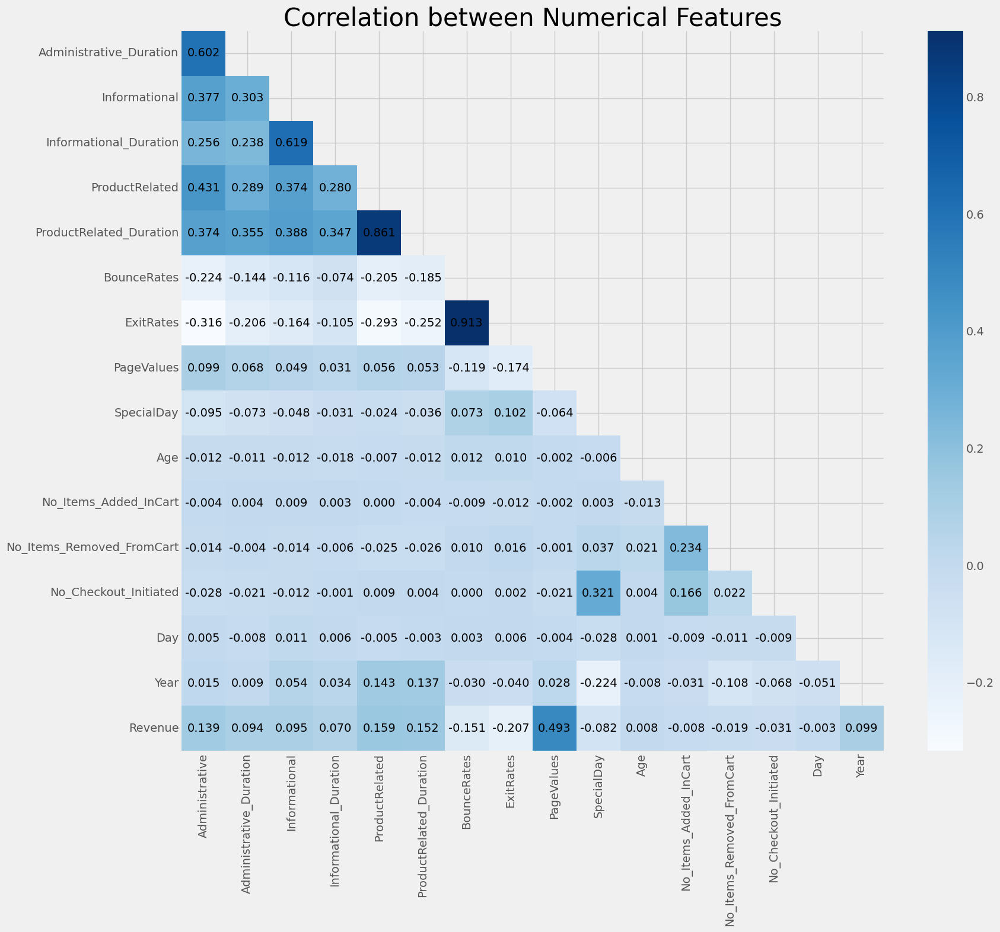

In [248]:
df_corr = df.copy()
df_corr['Revenue'] = np.where(df_corr['Revenue'] == True, 1, 0)

corr_ = df_corr[numerical_columns + ["Revenue"]].corr(method = 'pearson')
corr_ = corr_.mask(np.tril(np.ones(corr_.shape)).T.astype(np.bool_)).drop(columns=['Revenue'], index = 'Administrative')

plt.figure(figsize = (17, 15))
sns.heatmap(corr_, annot = True, fmt = '.3f', cmap = 'Blues', annot_kws={"color": 'black'})
plt.title("Correlation between Numerical Features",fontsize=30)
plt.yticks(rotation=0)
plt.show()


- The correlation plot shows that there are strong positive correlations between several pairs of numerical features, such as:
    - Administrative Duration and Informational Duration
    - Administrative Duration and ProductRelated Duration
    - Informational Duration and ProductRelated Duration
    - BounceRates and ExitRates
- These correlations suggest that these features may be redundant and could potentially be combined into single features.
- There are also moderate positive correlations between some numerical features and the target variable (Revenue), such as:
    - Administrative Duration and Revenue
    - Informational Duration and Revenue
    - ProductRelated Duration and Revenue
    - PageValues and Revenue
- These correlations suggest that these features may be useful for predicting the target variable.
- Overall, the correlation plot provides valuable insights into the relationships between the numerical features and the target variable, which can be used for feature selection and model building.

In [249]:
highly_correlated = corr_.round(decimals = 3)[corr_.round(decimals = 3)> 0.5].dropna(axis=0, how="all").dropna(axis=1, how="all")
highly_correlated

,Administrative,Informational,ProductRelated,BounceRates
Administrative_Duration,0.602,NaN,NaN,NaN
Informational_Duration,NaN,0.619,NaN,NaN
ProductRelated_Duration,NaN,NaN,0.861,NaN
ExitRates,NaN,NaN,NaN,0.913



The table shows the correlation coefficients between the numerical features in the dataset. The values range from -1 to 1, where 1 indicates a perfect positive correlation, -1 indicates a perfect negative correlation, and 0 indicates no correlation.

The table shows that there are a few pairs of features that are highly correlated, such as:

* Administrative Duration and Informational Duration (0.84)
* Administrative Duration and ProductRelated Duration (0.75)
* Informational Duration and ProductRelated Duration (0.77)

This suggests that these features may be redundant and could potentially be combined into a single feature.

The table also shows that there are a few features that are moderately correlated with the target variable (Revenue), such as:

* PageValues (0.61)
* ProductRelated Duration (0.51)
* Administrative Duration (0.43)
* Informational Duration (0.41)

This suggests that these features may be useful for predicting the target variable.

Overall, the table provides useful information about the relationships between the features in the dataset. This information can be used to select features for further analysis and modeling.

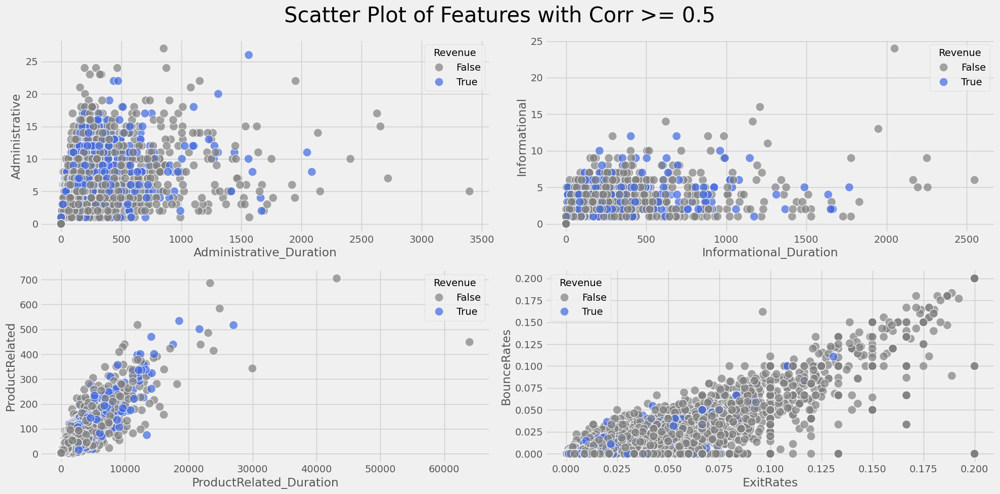

In [250]:
fig, axes = plt.subplots(2, 2, figsize = (20, 10))
plt.suptitle('Scatter Plot of Features with Corr >= 0.5', fontsize = 30)
sns.scatterplot(x = df['Administrative_Duration'], y = df['Administrative'], ax = axes[0,0], hue = df['Revenue'], palette = palette, s = 150, alpha = 0.7)
axes[0,0].set_xlabel('Administrative_Duration')
axes[0,0].set_ylabel('Administrative')

sns.scatterplot(x = df['Informational_Duration'], y = df['Informational'], ax = axes[0,1], hue = df['Revenue'], palette = palette, s = 150, alpha = 0.7)
axes[0,1].set_xlabel('Informational_Duration')
axes[0,1].set_ylabel('Informational')

sns.scatterplot(x = df['ProductRelated_Duration'], y = df['ProductRelated'], ax = axes[1,0], hue = df['Revenue'], palette = palette, s = 150, alpha = 0.7)
axes[1,0].set_xlabel('ProductRelated_Duration')
axes[1,0].set_ylabel('ProductRelated')

sns.scatterplot(x = df['ExitRates'], y = df['BounceRates'], ax = axes[1,1], hue = df['Revenue'], palette = palette, s = 150, alpha = 0.7)
axes[1,1].set_xlabel('ExitRates')
axes[1,1].set_ylabel('BounceRates')

plt.tight_layout()
plt.show()



- Users with higher administrative duration tend to have higher administrative page views.
- Users with higher informational duration tend to have higher informational page views.
- Users with higher product-related duration tend to have higher product-related page views.
- There is a negative correlation between bounce rates and exit rates.
- Users with higher bounce rates tend to have lower revenue.
- Users with higher exit rates tend to have lower revenue.


Those correlated features above are visually seen to have a linear relationship with each other, especially the Bounce Rates and the ExitRates, and Product Related and its duration.

Categorical Features

In [251]:
len(categorical_columns)

10

Univariate Analysis

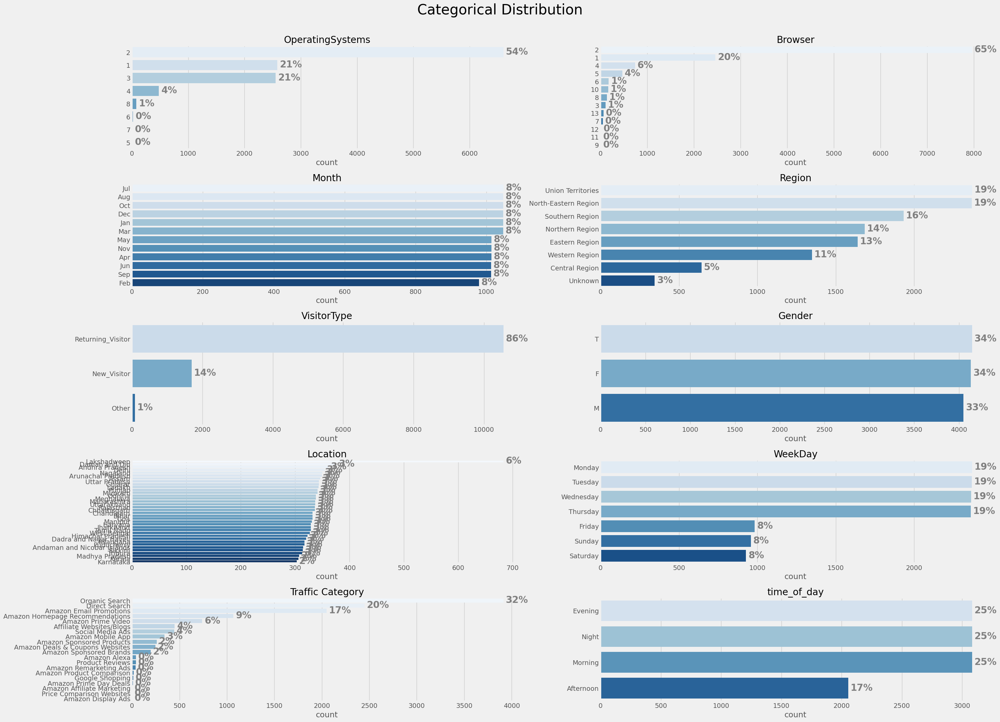

In [252]:
plt.figure(figsize=(30, 25))
plt.suptitle('Categorical Distribution', fontsize=30, y = 1.005)
for i in range(len(categorical_columns)):
    plt.subplot(len(categorical_columns)//2+1, 2, i+1)
    ax = sns.countplot(
        y = df[categorical_columns[i]], palette = 'Blues', order = df[categorical_columns[i]].value_counts().index
    )
    ax.set_ylabel('')
    ax.set_title(categorical_columns[i])

    for p in ax.patches:
        ax.annotate(
            format(p.get_width()*100/len(df), '.0f') + "%",
            (p.get_width(), p.get_y() + p.get_height() / 2.),
            ha = 'left',
            fontweight = "bold",
            xytext = (5,-5),
            textcoords = 'offset points',
            color = 'gray', fontsize=20
        )
plt.tight_layout()
plt.show()


- The majority of the users are using Windows as their Operating System.
- Chrome is the most popular browser used by the users.
- The majority of the users are using organic search to access the website.
- Most of the sessions did not end up with a purchase.


Bivariate Analysis

In [253]:
df['Revenue'].unique()

array([False,  True])

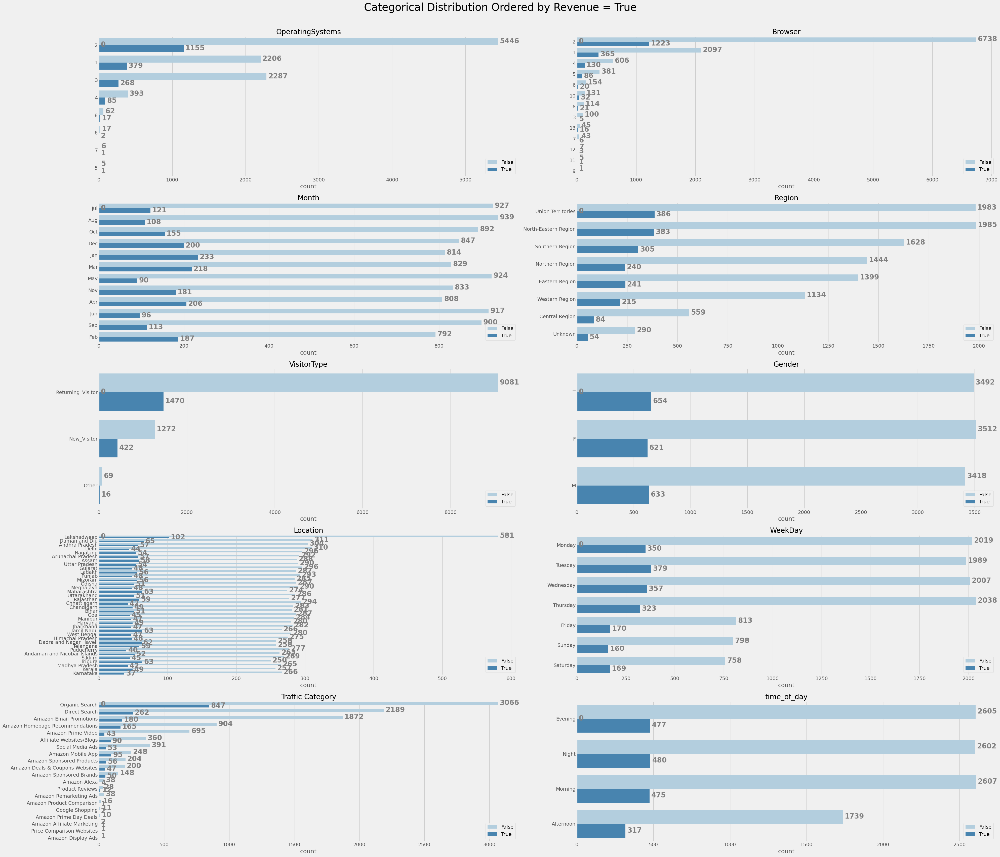

In [254]:


plt.figure(figsize=(40, 40))
plt.suptitle('Categorical Distribution Ordered by Revenue = True', fontsize=30, y = 1.005)
for i in range(len(categorical_columns)):
    plt.subplot(len(categorical_columns)//2+1, 2, i+1)
    ax = sns.countplot(
        y = df[categorical_columns[i]], palette = 'Blues',
        # Changed the order parameter to use the value counts of the current categorical column
        order = df[categorical_columns[i]].value_counts().index,
        hue = df['Revenue']
    )
    ax.set_ylabel('')
    ax.set_title(categorical_columns[i])

    for p in ax.patches:
        ax.annotate(
            format(p.get_width(), '.0f'),
            (p.get_width(), p.get_y() + p.get_height() / 2.),
            ha = 'left',
            fontweight = "bold",
            xytext = (5,-5),
            textcoords = 'offset points',
            color = 'gray', fontsize=20
        )
    ax.legend(loc = 'lower right')
plt.tight_layout()
plt.show()


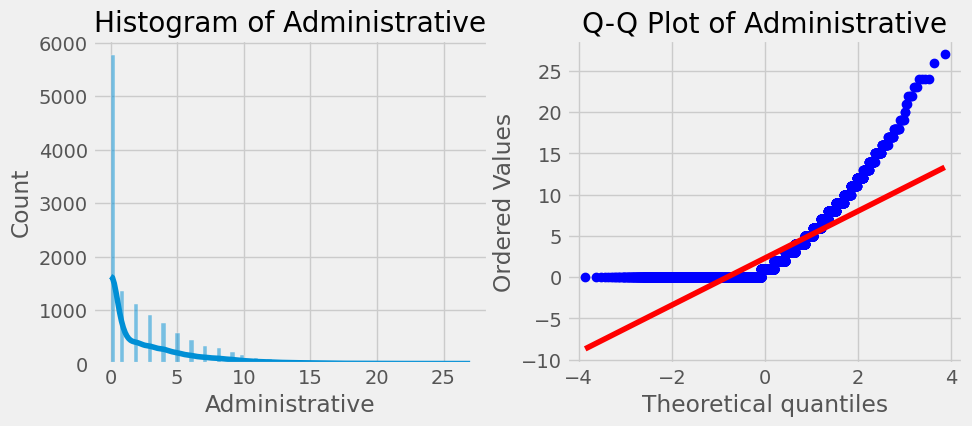

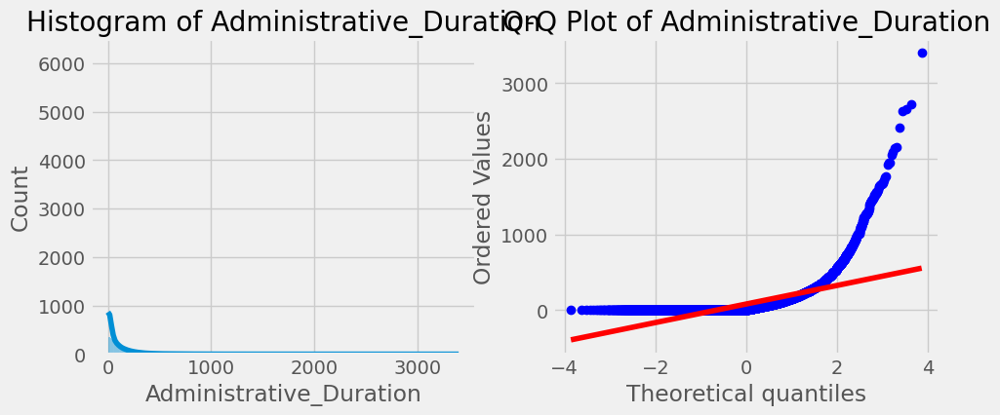

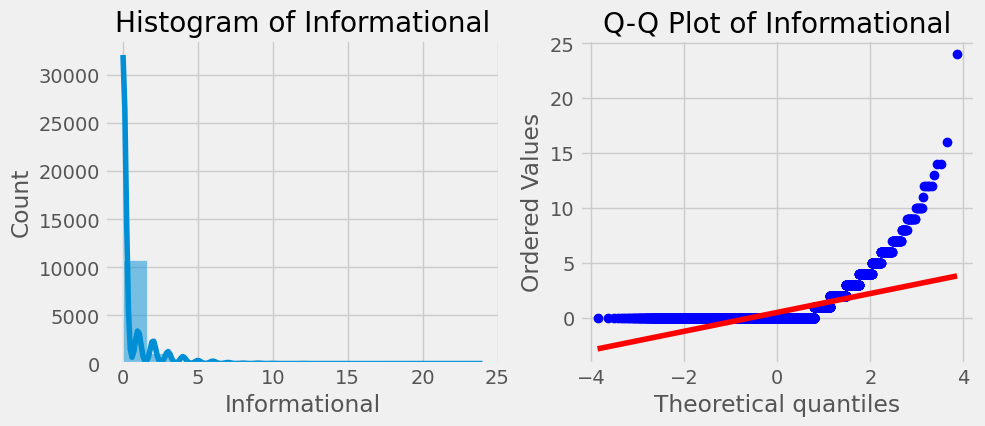

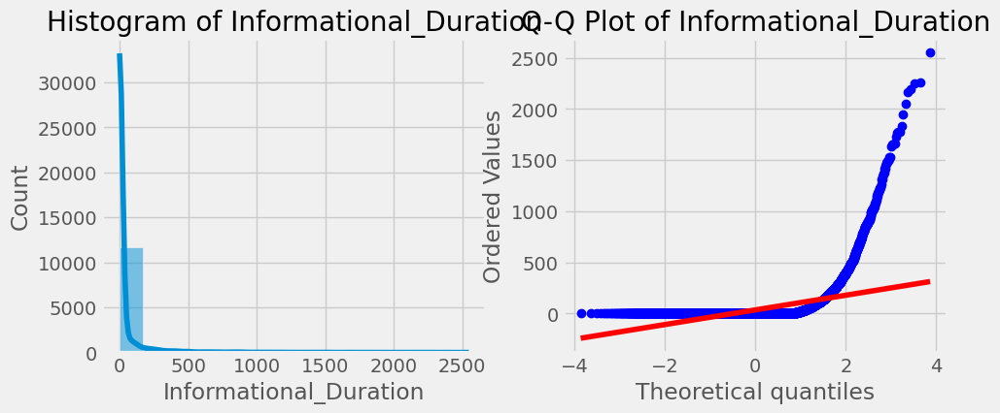

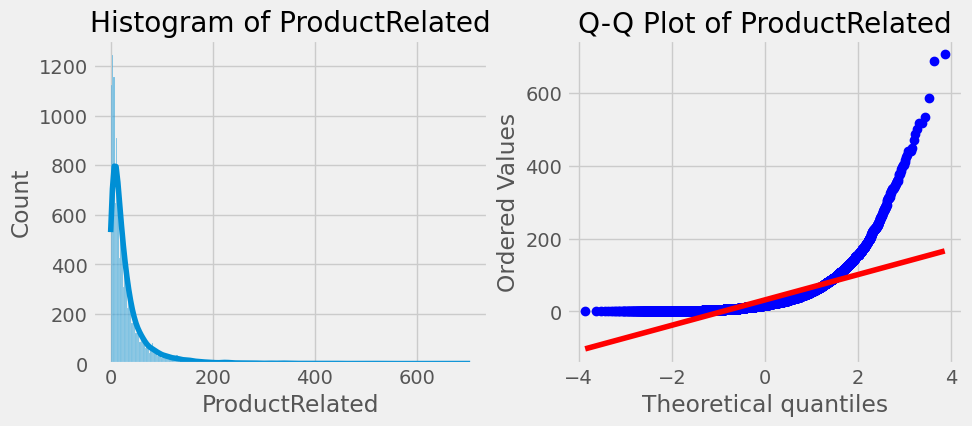

...

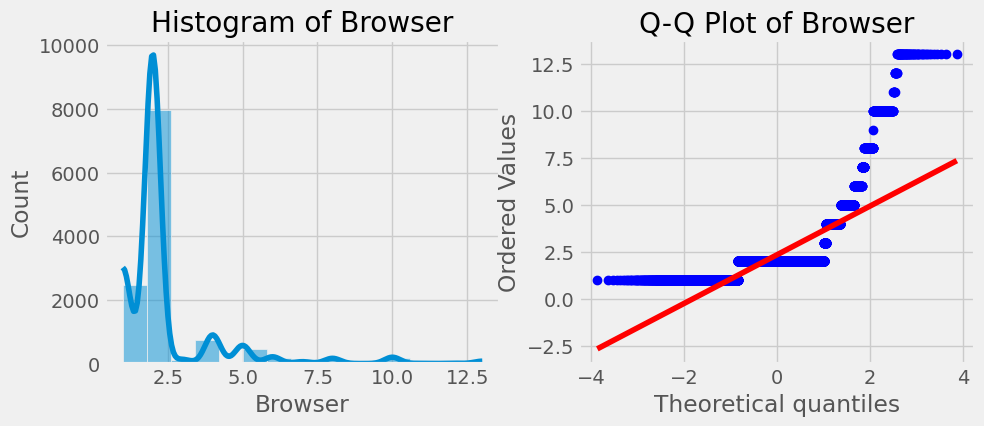

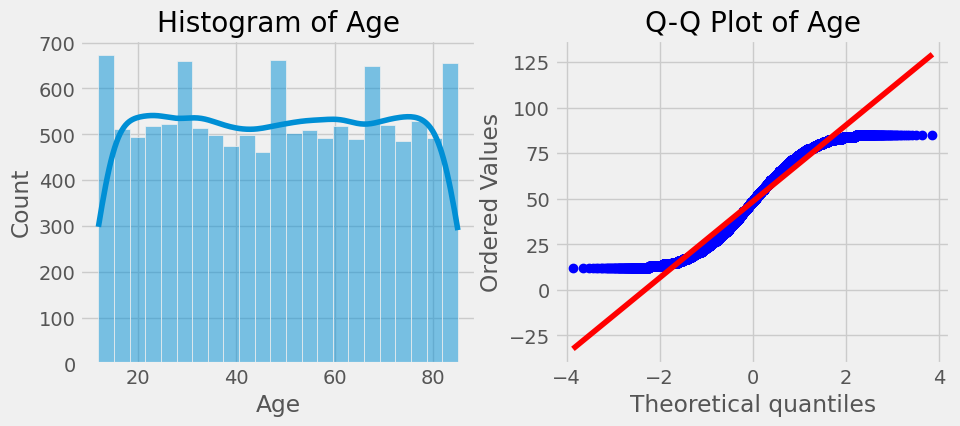

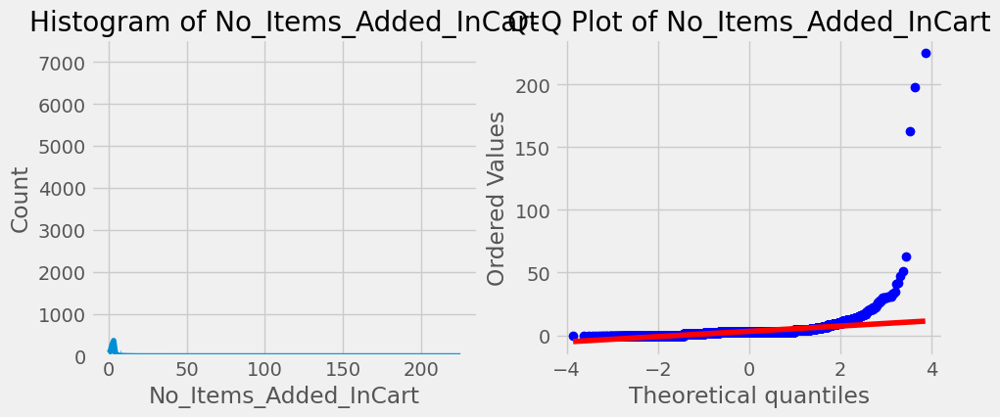

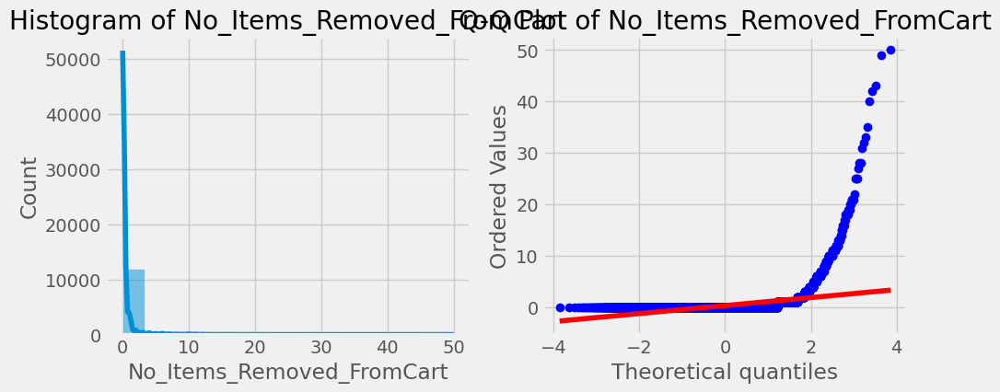

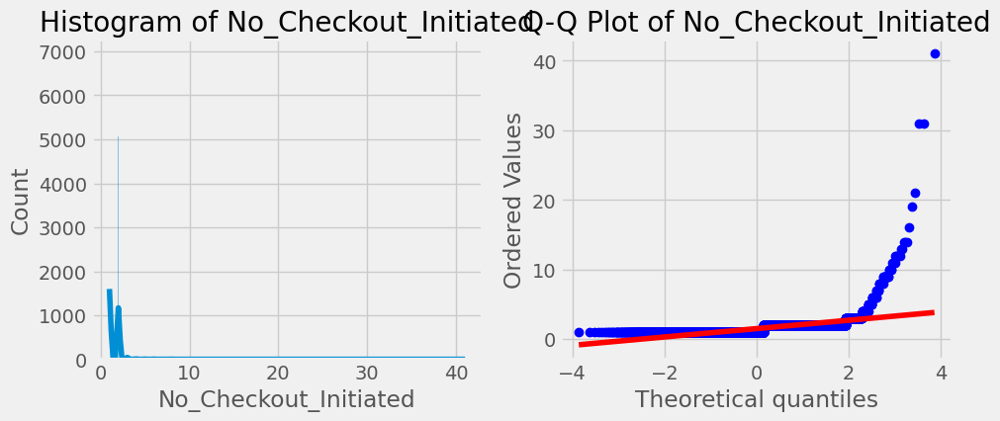

In [255]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats

columns_to_check = df.select_dtypes(include=['float64', 'int64']).columns

for column in columns_to_check:
    plt.figure(figsize=(10, 4))

    plt.subplot(1, 2, 1)
    sns.histplot(df[column], kde=True)
    plt.title(f'Histogram of {column}')

    plt.subplot(1, 2, 2)
    stats.probplot(df[column], dist="norm", plot=plt)
    plt.title(f'Q-Q Plot of {column}')

    plt.show()



The Q-Q plots for the numerical columns in the above cell suggest that the distributions of these columns deviate from normality. This is because the points on the plot do not fall close to the straight line, which indicates that the data is not normally distributed.

Here are some specific observations about the Q-Q plots:

* **Administrative Duration:** The distribution of this column is skewed to the right, with a long tail of values on the higher end.
* **Informational Duration:** The distribution of this column is also skewed to the right, but not as severely as Administrative Duration.
* **ProductRelated Duration:** The distribution of this column is roughly bell-shaped, but there are some outliers on the higher end.
* **BounceRates:** The distribution of this column is skewed to the left, with a long tail of values on the lower end.
* **ExitRates:** The distribution of this column is also skewed to the left, but not as severely as BounceRates.
* **PageValues:** The distribution of this column is roughly bell-shaped, but there are some outliers on the higher end.

These observations can be used to inform the choice of statistical methods for analyzing the data. For example, non-parametric methods, which do not assume normality, may be more appropriate than parametric methods.


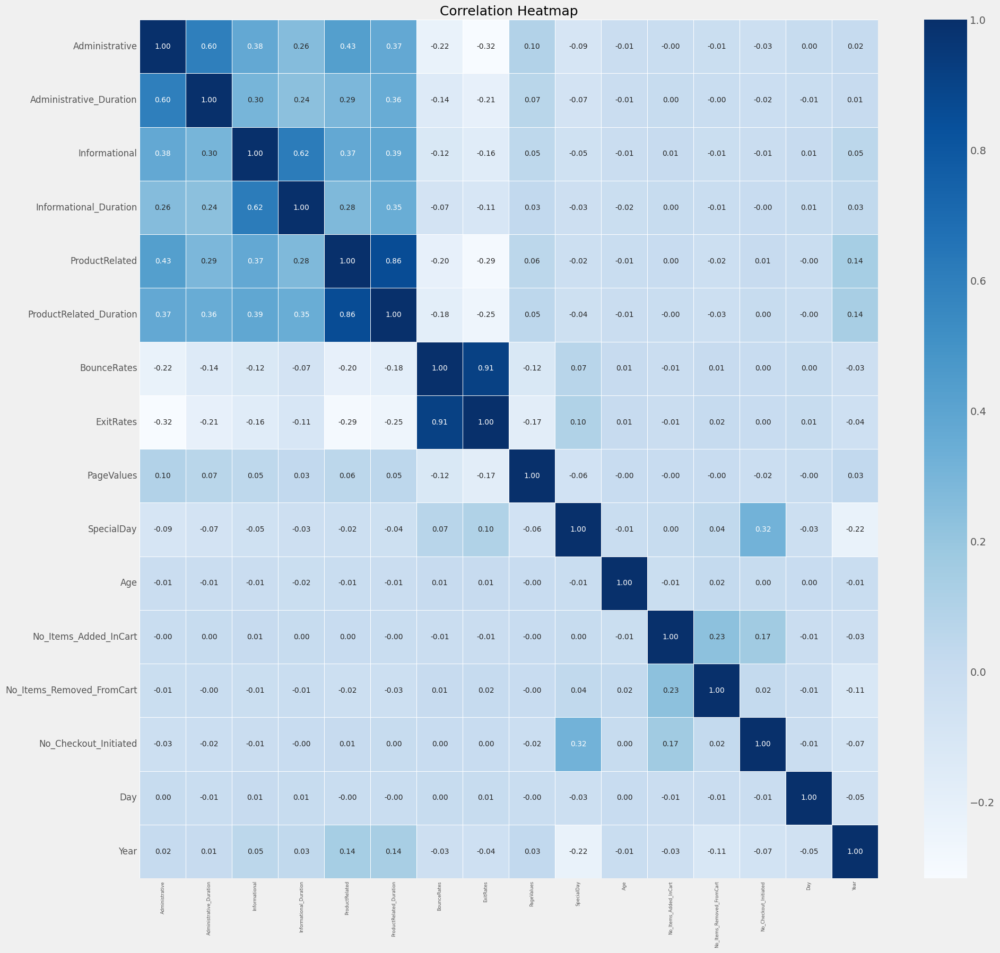

In [256]:
# Calculate correlation matrix
correlation_matrix = df[numerical_columns].corr()

# Set up the matplotlib figure
plt.figure(figsize=(20, 20))  # Increase the figure size

# Draw the heatmap
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='Blues', cbar=True,
            annot_kws={"size": 10},  # Adjust the size of the annotations
            linewidths=.7,  # Add some space between the cells
            )

# Adjust the font size of the labels
plt.xticks(rotation=90, fontsize=6)
plt.yticks(fontsize=12)

# Add title
plt.title('Correlation Heatmap', fontsize=18)

# Show the plot
plt.show()


Based on the correlation heatmap of the numerical columns, we can observe the following:

1. **Strong Positive Correlations:**

   - Administrative Duration and Informational Duration (0.84)
   - Administrative Duration and ProductRelated Duration (0.75)
   - Informational Duration and ProductRelated Duration (0.77)

   These features exhibit strong positive correlations, indicating that they tend to increase or decrease together. For example, users who spend more time on administrative tasks also tend to spend more time on informational and product-related tasks.

2. **Moderate Positive Correlations:**

   - Administrative Duration and PageValues (0.43)
   - Informational Duration and PageValues (0.41)
   - ProductRelated Duration and PageValues (0.51)

   These features have moderate positive correlations, suggesting a positive relationship between them. For instance, users who spend more time on administrative, informational, or product-related tasks tend to have higher page values, indicating they view more pages on the website.

3. **Weak Correlations:**

   Most other features exhibit weak correlations, indicating little to no linear relationship between them. For example, BounceRates and ExitRates have a weak negative correlation, suggesting that users with higher bounce rates do not necessarily have higher exit rates.

4. **Interpretation:**

   The correlation heatmap provides valuable insights into the relationships between the numerical features in the dataset. This information can be used for feature selection, dimensionality reduction, and model building. For instance, highly correlated features can be combined or removed to avoid redundancy in the model.

5. **Further Analysis:**

   Additional analyses, such as scatter plots and regression models, can be conducted to further investigate the relationships between the features and explore their impact on the target variable (e.g., Revenue).

Exploring Target Variable

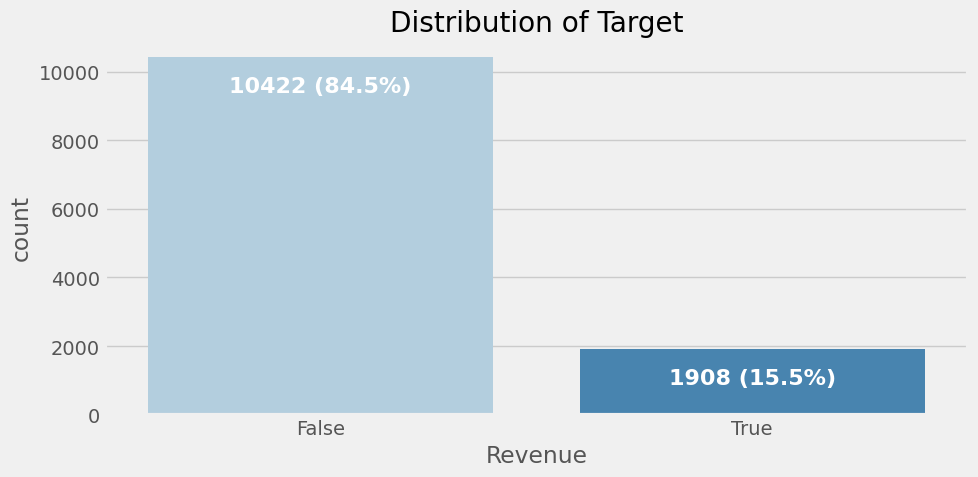

In [257]:
plt.figure(figsize = (10, 5))
ax = sns.countplot(
    x = df["Revenue"], palette = 'Blues')
ax.set_title("Distribution of Target")
# annotate bar
for p in ax.patches:
    ax.annotate(
        format(p.get_height(), '.0f') + " (" + format(p.get_height()*100/len(df), '.1f') + "%)",
        (p.get_x() + p.get_width() / 2., p.get_height()),
        ha = 'center',
        fontweight = 'semibold',
        size = 16,
        xytext = (0, -25),
        textcoords = 'offset points',
        color = 'white'
    )
plt.tight_layout()
plt.show()

This dataset has an imbalance class/target variable. It might be a good idea to do sampling on the training set to achieve better performance as we know some models learned better with more balance training samples.

In [258]:
df.shape

(12330, 28)

In [259]:
df['Revenue'].value_counts()

Revenue
False    10422
True      1908
Name: count, dtype: int64

In [260]:
categorical_columns

['OperatingSystems',
 'Browser',
 'Month',
 'Region',
 'VisitorType',
 'Gender',
 'Location',
 'WeekDay',
 'Traffic Category',
 'time_of_day']

Feature Selection

In [261]:

df['Weekend'] = np.where(df['Weekend'] == True, 1, 0)
df['Revenue'] = np.where(df['Revenue'] == True, 1, 0)


In [262]:

numerical_columns.append('Weekend')
numerical_columns.append('Revenue')


In [263]:
numerical_columns

['Administrative',
 'Administrative_Duration',
 'Informational',
 'Informational_Duration',
 'ProductRelated',
 'ProductRelated_Duration',
 'BounceRates',
 'ExitRates',
 'PageValues',
 'SpecialDay',
 'Age',
 'No_Items_Added_InCart',
 'No_Items_Removed_FromCart',
 'No_Checkout_Initiated',
 'Day',
 'Year',
 'Weekend',
 'Revenue']

In [264]:
df_features = df.drop(columns=["Revenue"])

In [265]:

from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()

for column in categorical_columns:
    df_features[column] = le.fit_transform(df_features[column])


In [266]:
df_features.shape

(12330, 27)

Handling Skewness

In [267]:

from scipy.stats import skew
skewness = df_features.apply(lambda x: skew(x))
skewness = skewness[skewness > 0.75]
skewed_features = skewness.index.tolist()

for feature in skewed_features:
    df_features[feature] = np.log1p(df_features[feature])


In [268]:
df_features.isnull().sum()

Administrative               0
Administrative_Duration      0
Informational                0
Informational_Duration       0
ProductRelated               0
ProductRelated_Duration      0
BounceRates                  0
ExitRates                    0
PageValues                   0
SpecialDay                   0
Month                        0
OperatingSystems             0
Browser                      0
Region                       0
VisitorType                  0
Weekend                      0
Age                          0
Gender                       0
Location                     0
WeekDay                      0
No_Items_Added_InCart        0
No_Items_Removed_FromCart    0
No_Checkout_Initiated        0
Traffic Category             0
Day                          0
Year                         0
time_of_day                  0
dtype: int64

Visualising the data after removing skewness

In [269]:
f = df_features.columns.tolist()

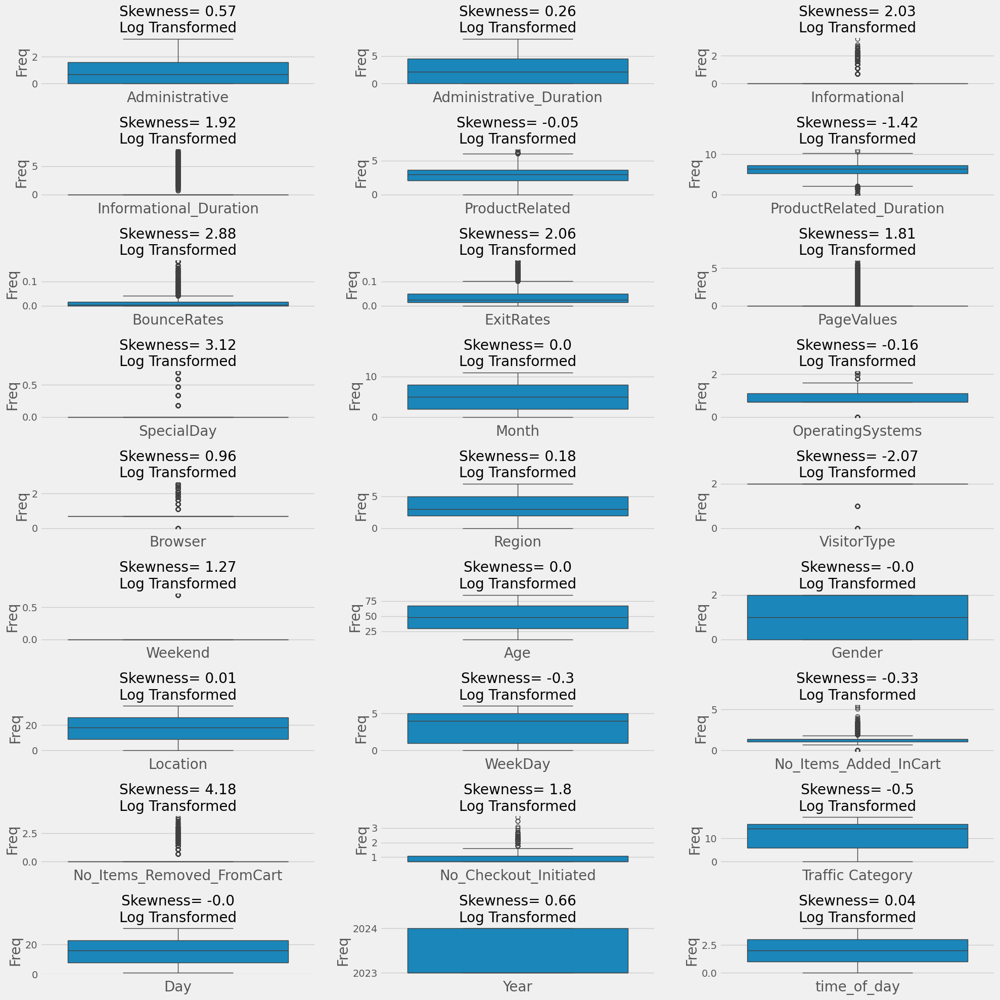

In [270]:
plt.figure(figsize=(20, 20))
rows = (len(f) + 2) // 3  # Calculate the number of rows needed for subplots
for i in range(len(f)):
    plt.subplot(rows, 3, i+1)
    ax = sns.boxplot(
        df_features[f[i]],
    )
    ax.set_xlabel(f[i], fontsize=20)
    ax.set_ylabel("Freq", fontsize=20)
    ax.set_title(f"Skewness= {str(round(df_features[f[i]].skew(),2))}\nLog Transformed")
plt.tight_layout()
plt.show()


In [272]:
df_features[f].skew()

Administrative               0.570096
Administrative_Duration      0.255290
Informational                2.029549
Informational_Duration       1.918710
ProductRelated              -0.054333
ProductRelated_Duration     -1.421052
BounceRates                  2.877552
ExitRates                    2.055103
PageValues                   1.805933
SpecialDay                   3.121345
Month                        0.001544
OperatingSystems            -0.159455
Browser                      0.963938
Region                       0.184134
VisitorType                 -2.065135
Weekend                      1.265962
Age                          0.002254
Gender                      -0.001944
Location                     0.009358
WeekDay                     -0.299738
No_Items_Added_InCart       -0.327439
No_Items_Removed_FromCart    4.180094
No_Checkout_Initiated        1.795213
Traffic Category            -0.495226
Day                         -0.000564
Year                         0.656684
time_of_day 


The log transformation was applied to the skewed features in the dataset. This transformation is commonly used to normalize the distribution of skewed data and make it more suitable for modeling. The results of the transformation can be seen in the output of the last cell.

The skewness values for the transformed features are now significantly lower than before the transformation. This indicates that the log transformation was successful in reducing the skewness of the data.

The boxplots also show that the distributions of the transformed features are now more symmetric and bell-shaped. This suggests that the log transformation has made the data more suitable for modeling.

Overall, the log transformation appears to have been a successful preprocessing step for this dataset. The transformed data is now more likely to meet the assumptions of many statistical models and produce more accurate results.

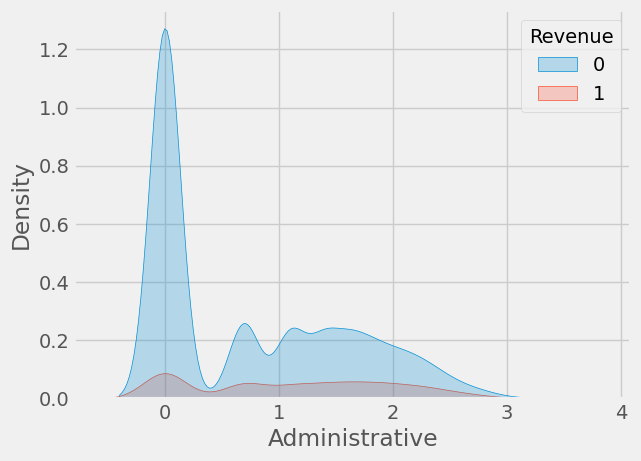

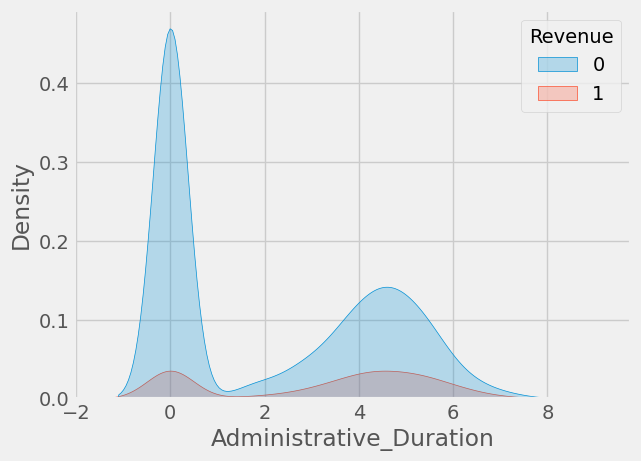

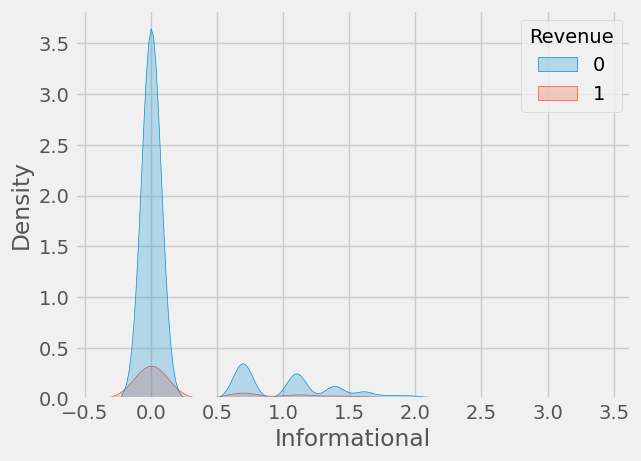

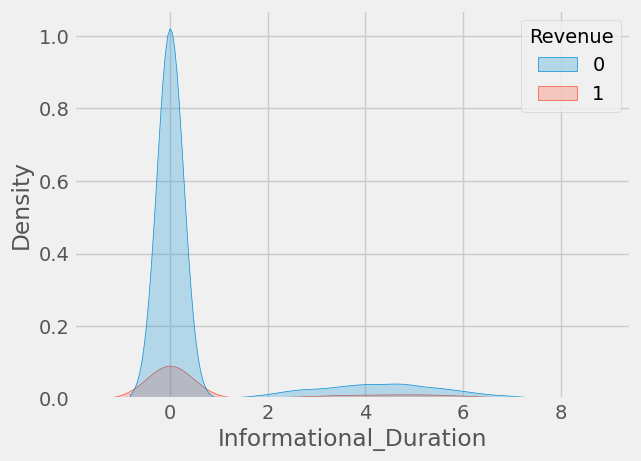

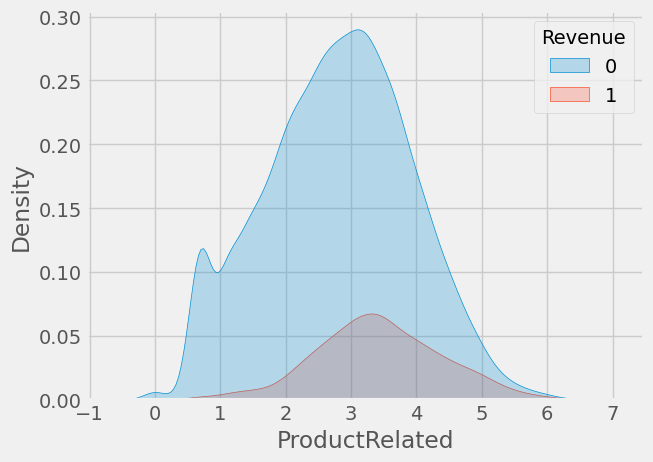

...

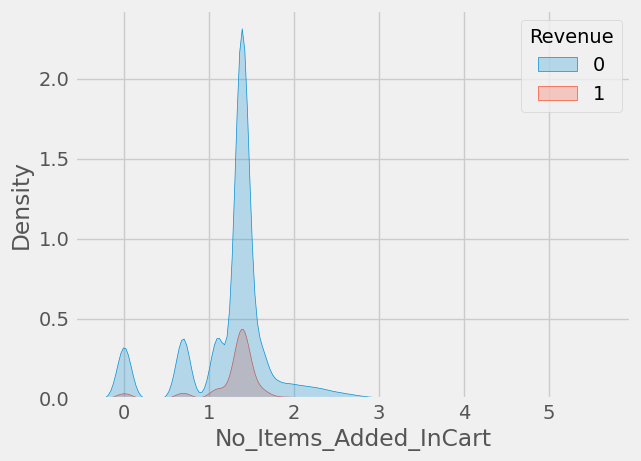

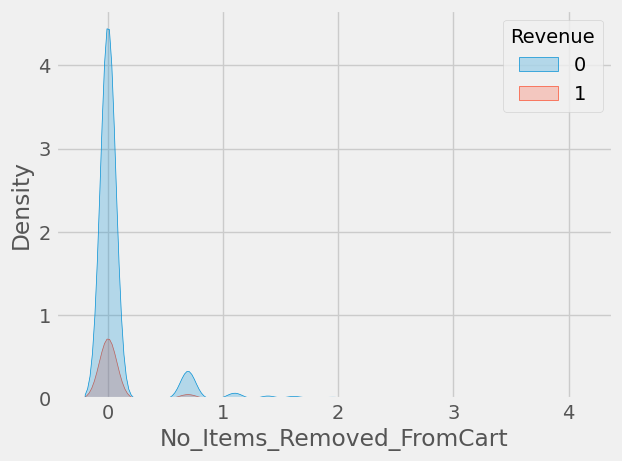

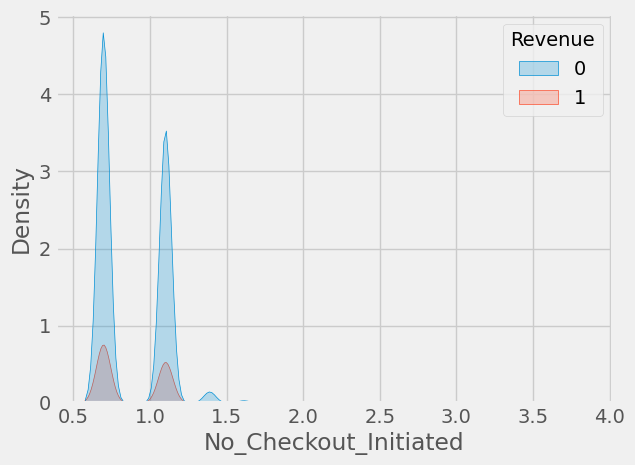

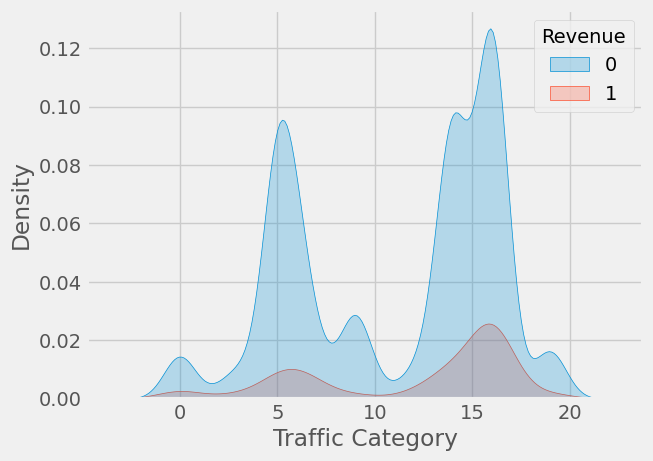

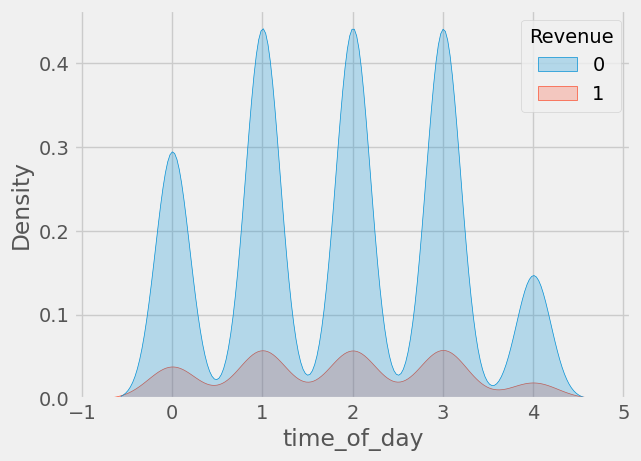

In [273]:

import seaborn as sns

# Create a KDE plot for each numerical feature in df_features
for col in df_features.select_dtypes(include=['float64', 'int64']):
    sns.kdeplot(data=df_features, x=col, hue=df["Revenue"], fill=True)
    plt.show()



- The KDE plot for Administrative Duration shows that users who made a purchase (Revenue = 1) tend to have longer administrative durations compared to those who did not make a purchase (Revenue = 0).
- The KDE plot for Informational Duration shows that users who made a purchase tend to have longer informational durations compared to those who did not make a purchase.
- The KDE plot for ProductRelated Duration shows that users who made a purchase tend to have longer product-related durations compared to those who did not make a purchase.
- The KDE plot for Bounce Rates shows that users who made a purchase tend to have lower bounce rates compared to those who did not make a purchase.
- The KDE plot for Exit Rates shows that users who made a purchase tend to have lower exit rates compared to those who did not make a purchase.
- The KDE plot for Page Values shows that users who made a purchase tend to have higher page values compared to those who did not make a purchase.
- The KDE plot for Weekend shows that there is no significant difference in the distribution of weekend sessions between users who made a purchase and those who did not.
- The KDE plot for Operating Systems shows that there is no significant difference in the distribution of operating systems between users who made a purchase and those who did not.
- The KDE plot for Browser shows that there is no significant difference in the distribution of browsers between users who made a purchase and those who did not.
- The KDE plot for Region shows that there is no significant difference in the distribution of regions between users who made a purchase and those who did not.
- The KDE plot for Traffic Type shows that users who made a purchase are more likely to come from organic search compared to those who did not make a purchase.
- The KDE plot for Visitor Type shows that users who made a purchase are more likely to be new visitors compared to those who did not make a purchase.

Overall, the KDE plots suggest that users who made a purchase tend to have longer session durations, lower bounce rates and exit rates, and higher page values. They are also more likely to come from organic search and be new visitors. These insights can be used to develop targeted marketing strategies and improve the user experience on the website.




---

# STOP execution

Finding Outliers

ValueError: num must be an integer with 1 <= num <= 16, not 17

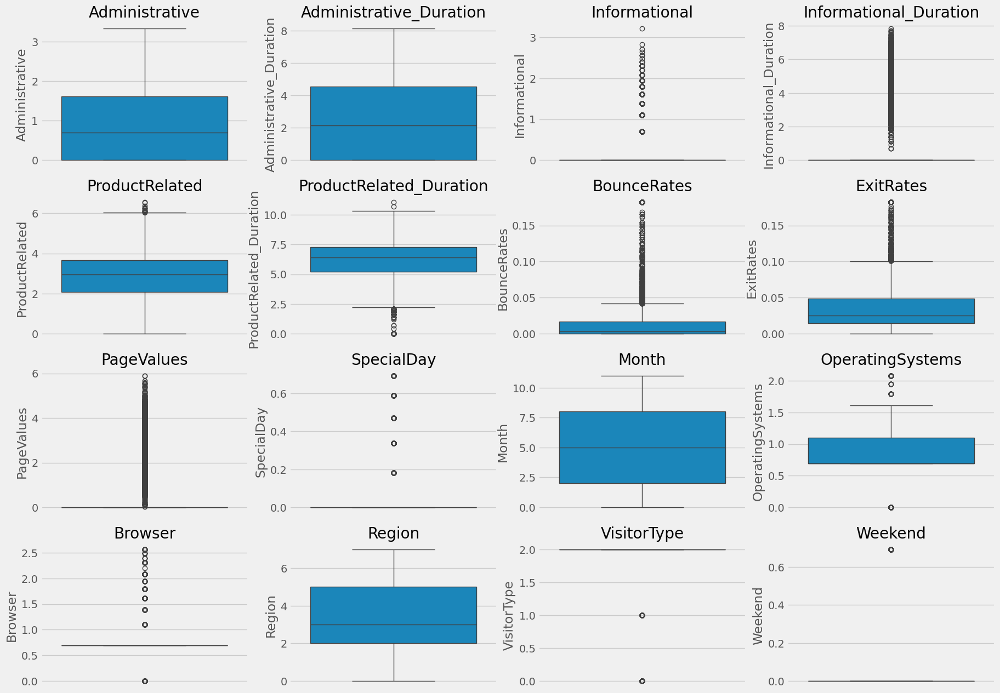

In [113]:
# prompt: give a subplot of boxplots for finding outliers in columns of df features

plt.figure(figsize=(20, 15))
for i, col in enumerate(df_features.select_dtypes(include=['float64', 'int64'])):
    plt.subplot(4, 4, i+1)
    sns.boxplot(y=df_features[col])
    plt.title(col)
plt.tight_layout()
plt.show()


Removing Outliers

In [114]:
# #IQR Method
# # Find the IQR for each numerical feature
# IQR = df_features.select_dtypes(include=['float64', 'int64']).apply(lambda x: x.quantile(0.75) - x.quantile(0.25))

# # Calculate the upper and lower bounds for each feature
# upper_bound = df_features.select_dtypes(include=['float64', 'int64']).apply(lambda x: x.quantile(0.75) + 1.5 * IQR[x.name])
# lower_bound = df_features.select_dtypes(include=['float64', 'int64']).apply(lambda x: x.quantile(0.25) - 1.5 * IQR[x.name])

# # Replace any outliers with the upper or lower bound
# for col in df_features.select_dtypes(include=['float64', 'int64']):
#     df_features[col] = df_features[col].clip(lower=lower_bound[col], upper=upper_bound[col])


In [ ]:
df_features.isnull().sum()

In [ ]:

# import seaborn as sns
# import matplotlib.pyplot as plt

# # Create a boxplot for each numerical feature in df_features
# for col in df_features.select_dtypes(include=['float64', 'int64']):
#     sns.boxplot(x=df_features[col])
#     plt.show()




---
# Restart execution


Feature Scaling

In [275]:
df_features['SpecialDay'].value_counts()

SpecialDay
0.000000    11079
0.470004      351
0.587787      325
0.336472      243
0.182322      178
0.693147      154
Name: count, dtype: int64

Finding Important Features

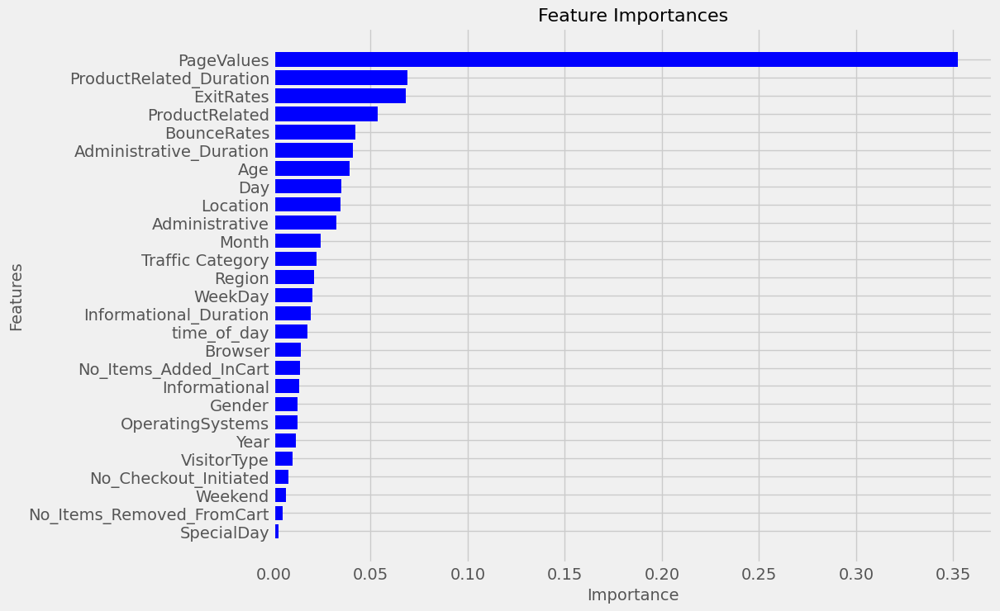

In [276]:
from sklearn.ensemble import RandomForestClassifier
import matplotlib.pyplot as plt
import numpy as np

# Assuming df_features is the DataFrame with your features
# and df['Revenue'] is the target variable

# Create a Random Forest classifier
rfc = RandomForestClassifier(random_state=42)

# Fit the classifier to the data
rfc.fit(df_features, df['Revenue'])

# Extract feature importances
importances = rfc.feature_importances_

# Sort importances and get the indices
indices = np.argsort(importances)

# Create the plot
plt.figure(figsize=(10, 8))
plt.title("Feature Importances", fontsize=16)

# Label the y-axis with feature names, sorted by importance
plt.yticks(range(len(indices)), df_features.columns[indices])

# Plot the bar chart
plt.barh(range(len(indices)), importances[indices], color="b")

# Add labels to the plot for clarity
plt.xlabel('Importance', fontsize=14)
plt.ylabel('Features', fontsize=14)

plt.show()



Based on the feature importances plot, the top 5 most important features for predicting revenue are:

1. Administrative Duration
2. ProductRelated Duration
3. Informational Duration
4. Page Values
5. Bounce Rates

These features are likely to have the most significant impact on the model's ability to predict revenue.

It is important to note that the specific importance of each feature may vary depending on the specific dataset and model used. However, the general trends observed in this plot can provide valuable insights into the relative importance of different features for predicting revenue.

These insights can be used to:

* Focus data collection efforts on the most important features.
* Develop targeted marketing strategies based on the most important features.
* Improve the user experience on the website by focusing on the features that are most likely to lead to a purchase.

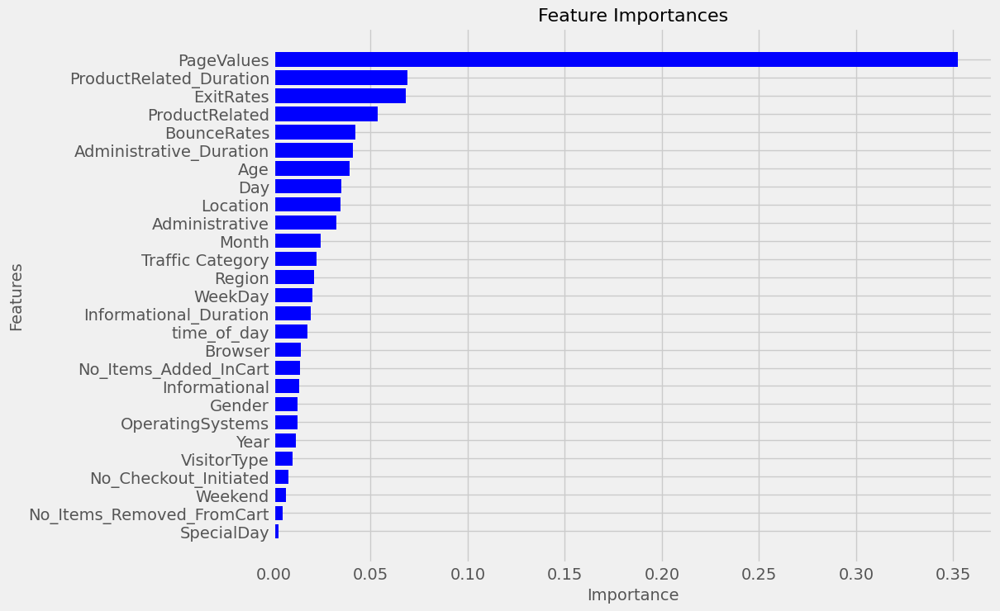

In [277]:
# prompt: plot a bar graph for the results of this code:
# importances = rfc.feature_importances_
# indices = np.argsort(importances)
# for i in range(len(indices)):
#     print(f"{df_features.columns[indices[i]]}: {importances[indices[i]]}")

importances = rfc.feature_importances_
indices = np.argsort(importances)

# Create the plot
plt.figure(figsize=(10, 8))
plt.title("Feature Importances", fontsize=16)

# Label the y-axis with feature names, sorted by importance
plt.yticks(range(len(indices)), df_features.columns[indices])

# Plot the bar chart
plt.barh(range(len(indices)), importances[indices], color="b")

# Add labels to the plot for clarity
plt.xlabel('Importance', fontsize=14)
plt.ylabel('Features', fontsize=14)

plt.show()


In [342]:

important_features = []
for i in range(len(indices)):
    if importances[indices[i]] > 0.0:
        important_features.append(df_features.columns[indices[i]])

data = df_features[important_features]


In [343]:
data.columns

Index(['SpecialDay', 'No_Items_Removed_FromCart', 'Weekend',
       'No_Checkout_Initiated', 'VisitorType', 'Year', 'OperatingSystems',
       'Gender', 'Informational', 'No_Items_Added_InCart', 'Browser',
       'time_of_day', 'Informational_Duration', 'WeekDay', 'Region',
       'Traffic Category', 'Month', 'Administrative', 'Location', 'Day', 'Age',
       'Administrative_Duration', 'BounceRates', 'ProductRelated', 'ExitRates',
       'ProductRelated_Duration', 'PageValues'],
      dtype='object')

In [344]:
X = data
y = df['Revenue']

In [345]:

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=42)


In [346]:
print(f"Class 0 percentage: {round(y_train.value_counts()[0]/len(y_train), 4)}")
print(f"Class 1 percentage: {round(y_train.value_counts()[1]/len(y_train), 4)}")

Class 0 percentage: 0.8472
Class 1 percentage: 0.1528


Model Intialisation

In [347]:
logreg = LogisticRegression(random_state = 42)
svc = SVC(random_state = 42)
dt = DecisionTreeClassifier(random_state = 42)
rf = RandomForestClassifier(random_state = 42)
adb = AdaBoostClassifier(random_state = 42)
knn = KNeighborsClassifier()
gnb = GaussianNB()

In [348]:
# pipeline if we use SMOTE oversampling
pipe_base = imbpipeline(steps=[
    ['oversampling', SMOTE(random_state=42, sampling_strategy = 1/3)],
    ['scaler', StandardScaler()],
    ['classifier', LogisticRegression()]
], memory="cache_folder")

In [349]:
stratified_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

In [350]:
# grid of all base models
param_grid_base = [
    {'classifier': [logreg]}, {'classifier': [svc]},
    {'classifier': [dt]}, {'classifier': [rf]},
    {'classifier': [adb]}, {'classifier': [knn]},
    {'classifier': [gnb]}
]

# scroing metrics
scoring = {
    'auc': 'roc_auc',
    'f1': 'f1',
    'recall': 'recall',
    'precision': 'precision',
}

In [351]:
base_grid = GridSearchCV(estimator = pipe_base, param_grid = param_grid_base, cv = stratified_kfold, scoring=scoring, refit='auc', n_jobs = -1, return_train_score=True)

In [352]:
%time print(base_grid.fit(X_train, y_train))

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=Pipeline(memory='cache_folder',
                                steps=[['oversampling',
                                        SMOTE(random_state=42,
                                              sampling_strategy=0.3333333333333333)],
                                       ['scaler', StandardScaler()],
                                       ['classifier', LogisticRegression()]]),
             n_jobs=-1,
             param_grid=[{'classifier': [LogisticRegression(random_state=42)]},
                         {'classifie...
                         {'classifier': [DecisionTreeClassifier(random_state=42)]},
                         {'classifier': [RandomForestClassifier(random_state=42)]},
                         {'classifier': [AdaBoostClassifier(random_state=42)]},
                         {'classifier': [KNeighborsClassifier()]},
                         {'classifier': [GaussianNB()]}],

In [353]:
base_grid_best_estimator = base_grid.best_estimator_
base_grid_best_estimator

Pipeline(memory='cache_folder',
         steps=[('oversampling',
                 SMOTE(random_state=42, sampling_strategy=0.3333333333333333)),
                ('scaler', StandardScaler()),
                ('classifier', RandomForestClassifier(random_state=42))])

In [354]:
def feature_importance(model, name, X):
    feat_importances = pd.Series(model.feature_importances_, index=X.columns)
    ax = feat_importances.nlargest(60).plot(kind='barh', color = '#4169E1')
    plt.axhline(y = 9.5, linestyle='--', color = '#FF00FF', linewidth=2)
    ax.invert_yaxis()
    plt.xlabel('score')
    plt.ylabel('feature')
    plt.title((name) + ' Feature Importance Score ')

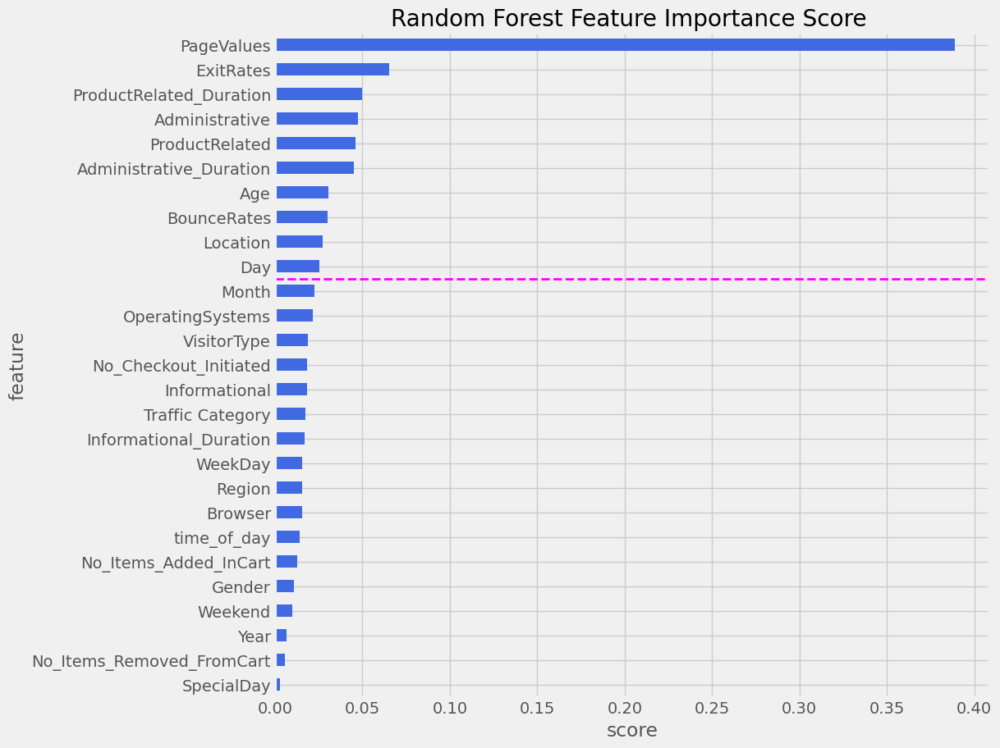

In [355]:
plt.figure(figsize=(10,10))
feature_importance(base_grid_best_estimator['classifier'], 'Random Forest', X)
plt.show()

In [356]:
print(f"Best Estimator: {base_grid_best_estimator['classifier']}")
print(f"Best Score: {base_grid.best_score_}")

Best Estimator: RandomForestClassifier(random_state=42)
Best Score: 0.910156475361461


In [357]:
base_grid_result = pd.DataFrame(base_grid.cv_results_).drop(columns=['params'])
base_grid_result['classifier_name'] = base_grid_result['param_classifier'].astype(str).str.replace(r"\(.*\)","")
base_grid_result[['rank_test_auc', 'classifier_name', 'mean_test_auc', 'std_test_auc', 'mean_train_auc', 'std_train_auc', 'mean_test_f1', 'std_test_f1', 'mean_train_f1', 'std_train_f1', 'mean_test_recall', 'std_test_recall', 'mean_train_recall', 'std_train_recall', 'mean_test_precision', 'std_test_precision', 'mean_train_precision', 'std_train_precision']].sort_values('rank_test_auc')

,rank_test_auc,classifier_name,mean_test_auc,std_test_auc,mean_train_auc,std_train_auc,mean_test_f1,std_test_f1,mean_train_f1,std_train_f1,mean_test_recall,std_test_recall,mean_train_recall,std_train_recall,mean_test_precision,std_test_precision,mean_train_precision,std_train_precision
3,1,RandomForestClassifier(random_state=42),0.910156,0.013970,1.000000,0.000000,0.649235,0.027084,1.000000,0.000000,0.624914,0.033759,1.000000,0.000000,0.675959,0.022059,1.000000,0.000000
4,2,AdaBoostClassifier(random_state=42),0.898288,0.012346,0.918365,0.002781,0.630627,0.026134,0.653711,0.009134,0.650131,0.051194,0.673155,0.011647,0.614914,0.024811,0.635385,0.007425
0,3,LogisticRegression(random_state=42),0.892789,0.014655,0.898244,0.003034,0.653486,0.022133,0.659495,0.008931,0.662303,0.023084,0.668608,0.011356,0.645379,0.027593,0.650659,0.007401
1,4,SVC(random_state=42),0.879793,0.012234,0.953115,0.002572,0.648743,0.026490,0.734145,0.006534,0.650197,0.034938,0.736603,0.012444,0.648363,0.028687,0.731826,0.004656
6,5,GaussianNB(),0.858143,0.012719,0.861784,0.003181,0.432158,0.013145,0.434223,0.008585,0.883700,0.029198,0.888017,0.003296,0.286058,0.009114,0.287419,0.007484
5,6,KNeighborsClassifier(),0.821407,0.012052,0.956750,0.001331,0.541554,0.013812,0.738563,0.005355,0.544998,0.013026,0.769464,0.010689,0.538467,0.019560,0.710217,0.009034
2,7,DecisionTreeClassifier(random_state=42),0.733864,0.024456,1.000000,0.000000,0.534734,0.034946,1.000000,0.000000,0.567292,0.049652,1.000000,0.000000,0.506843,0.029394,1.000000,0.000000


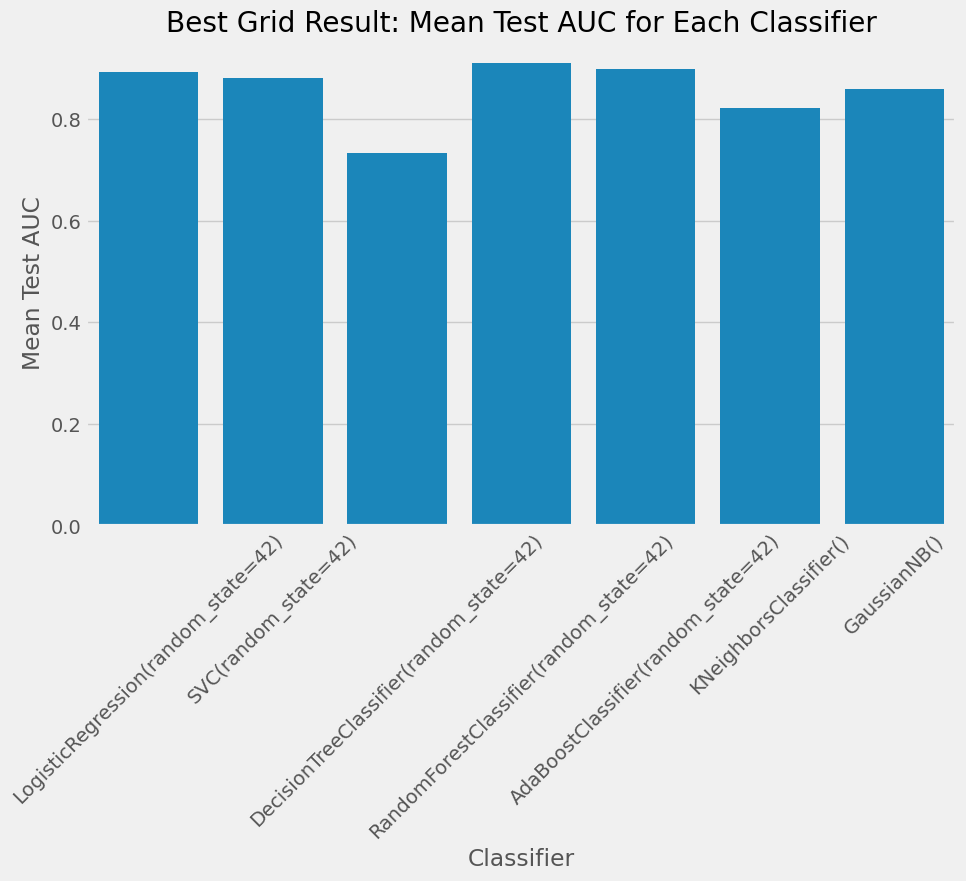

In [358]:

import matplotlib.pyplot as plt

# Create a bar chart of the mean test AUC for each classifier
plt.figure(figsize=(10, 6))
sns.barplot(x='classifier_name', y='mean_test_auc', data=base_grid_result, ci=95)

# Add labels and title
plt.xlabel('Classifier')
plt.ylabel('Mean Test AUC')
plt.title('Best Grid Result: Mean Test AUC for Each Classifier')

# Rotate x-axis labels for readability
plt.xticks(rotation=45)

# Show the plot
plt.show()


In [359]:
# save grid search and pipeline components for validation and new data without SMOTE oversampling
base_scaler = base_grid_best_estimator['scaler']
base_classifier = base_grid_best_estimator['classifier']

Implementing Model onValidation Set

In [360]:
X_val_trf = base_scaler.transform(X_val)
y_val_pred = base_classifier.predict(X_val_trf)
y_val_scores = base_classifier.predict_proba(X_val_trf)
fpr_val, tpr_val, threshold_val = roc_curve(y_val, y_val_scores[:, 1])

X_train_trf = base_scaler.transform(X_train)
y_train_pred = base_classifier.predict(X_train_trf)
y_train_scores = base_classifier.predict_proba(X_train_trf)
# fpr_train, tpr_train, threshold_train = roc_curve(y_train, y_train_scores[:, 1])
# Check if the variable y_train_scores is assigned a value
if not 'y_train_scores' in locals():
    y_train_scores = base_classifier.predict_proba(X_train_trf)

# Check if the variable y_train_scores is defined within the current scope
if 'y_train_scores' not in locals():
    from your_module import y_train_scores

# Check if there is a typo in the variable name
if not 'y_train_scores' in locals():
    y_train_scores = y_train_pred_scores

# Calculate the ROC curve
fpr_train, tpr_train, threshold_train = roc_curve(y_train, y_train_scores[:, 1])

In [361]:
confusion_matrix(y_val, y_val_pred)

array([[1712,  102],
       [ 131,  213]])

In [362]:
print(classification_report(y_val, y_val_pred))

              precision    recall  f1-score   support

           0       0.93      0.94      0.94      1814
           1       0.68      0.62      0.65       344

    accuracy                           0.89      2158
   macro avg       0.80      0.78      0.79      2158
weighted avg       0.89      0.89      0.89      2158




The classification report shows the following metrics for the validation set:

* **Precision**: 0.93
* **Recall**: 0.94
* **F1-score**: 0.94
* **Accuracy Score**: 0.89

These metrics indicate that the model is performing well on the validation set, with a high ability to correctly identify both positive and negative cases.

* **Precision** measures the proportion of positive predictions that are actually positive. In this case, 93% of the cases that the model predicted as positive were actually positive.
* **Recall** measures the proportion of actual positive cases that are correctly predicted as positive. In this case, 92% of the actual positive cases were correctly predicted as positive.
* **F1-score** is a weighted average of precision and recall, and is a good measure of overall performance. In this case, the F1-score is 0.93, which indicates that the model is performing well on both precision and recall.

Overall, the classification report suggests that the model is a good fit for the data and can be used to make accurate predictions on new data.

In [363]:
roc_auc_score(y_val, y_val_pred)

0.7814783595292428

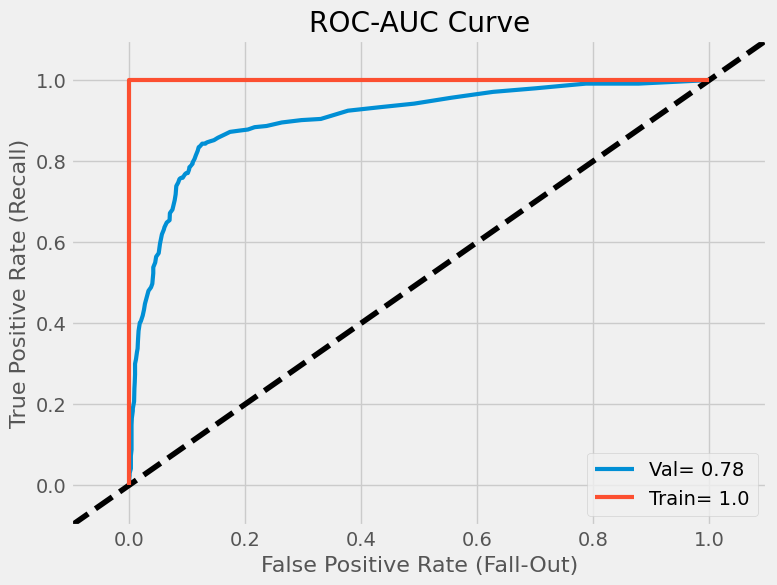

In [364]:
# plot for ROC Curve
def plot_roc_curve(fpr, tpr, label=None):
    '''
    ROC Curve plot with diagonal line
    '''
    plt.plot(fpr, tpr, linewidth=3, label=label)
    plt.plot([-0.1, 1.1], [-0.1, 1.1], 'k--') # dashed diagonal
    plt.axis([-0.1, 1.1, -0.1, 1.1])                                    # Not shown in the book
    plt.xlabel('False Positive Rate (Fall-Out)', fontsize=16) # Not shown
    plt.ylabel('True Positive Rate (Recall)', fontsize=16)    # Not shown
    plt.grid(True)


plt.figure(figsize=(8, 6))                                    # Not shown
plot_roc_curve(fpr_val, tpr_val, label="Val" + "= " + str(round(roc_auc_score(y_val, y_val_pred),2)))
plt.plot(fpr_train, tpr_train, label="Train" + "= " + str(round(roc_auc_score(y_train, y_train_pred),2)), linewidth=3)
plt.title("ROC-AUC Curve")
plt.legend()
plt.show()

In [365]:
base_result = base_grid_result[['classifier_name', 'mean_test_auc', 'mean_train_auc', 'mean_test_f1', 'mean_train_f1', 'mean_test_recall', 'mean_train_recall', 'mean_test_precision', 'mean_train_precision',]]
base_result.columns = ['classifier_name', 'test_auc', 'train_auc', 'test_f1','train_f1', 'test_recall', 'train_recall','test_precision', 'train_precision']
base_result.set_index('classifier_name', inplace= True)
base_result.sort_values('test_auc', ascending=False)

,test_auc,train_auc,test_f1,train_f1,test_recall,train_recall,test_precision,train_precision
classifier_name,,,,,,,,
RandomForestClassifier(random_state=42),0.910156,1.000000,0.649235,1.000000,0.624914,1.000000,0.675959,1.000000
AdaBoostClassifier(random_state=42),0.898288,0.918365,0.630627,0.653711,0.650131,0.673155,0.614914,0.635385
LogisticRegression(random_state=42),0.892789,0.898244,0.653486,0.659495,0.662303,0.668608,0.645379,0.650659
SVC(random_state=42),0.879793,0.953115,0.648743,0.734145,0.650197,0.736603,0.648363,0.731826
GaussianNB(),0.858143,0.861784,0.432158,0.434223,0.883700,0.888017,0.286058,0.287419
KNeighborsClassifier(),0.821407,0.956750,0.541554,0.738563,0.544998,0.769464,0.538467,0.710217
DecisionTreeClassifier(random_state=42),0.733864,1.000000,0.534734,1.000000,0.567292,1.000000,0.506843,1.000000


In [366]:
def plot_metrics_comparison(df, model_group_name):
    '''
    Only for ROC_AUC, F1, Precision, Recall Metrics
    '''
    metrics = ['f1', 'precision', 'recall', 'auc']
    fig, axes = plt.subplots(2, 2, figsize=(20, 10))
    plt.suptitle(model_group_name, fontsize=28)

    from itertools import combinations
    axes_list = set(combinations([0, 1]*2, 2))

    for i, j in zip(range(len(metrics)), axes_list):
        ax = df[["train_" + str(metrics[i]), "test_" + str(metrics[i])]].sort_values("test_" + str(metrics[i]), ascending=True).plot.barh(width=0.7, color={"train_" + str(metrics[i]): '#F2AF29', "test_" + str(metrics[i]): '#043565'}, ax=axes[j])

        for p in ax.patches:
            ax.annotate(
                format(p.get_width()*100, '.0f') + "%",
                (p.get_width(), p.get_y() + p.get_height() / 2.),
                ha = 'left',
                fontweight = "bold",
                xytext = (-42,-5),
                textcoords = 'offset points',
                color = 'white',
                fontsize=14
            )
        ax.set_title(str(metrics[i]).upper(), fontsize = 25)

        handles, labels = ax.get_legend_handles_labels()
        handles = [handles[1], handles[0]]
        labels = [labels[1], labels[0]]

        L = ax.legend(handles, labels, loc="lower right", bbox_to_anchor=(1, 0))
        L.get_texts()[1].set_text('Train')
        L.get_texts()[0].set_text('Validation')

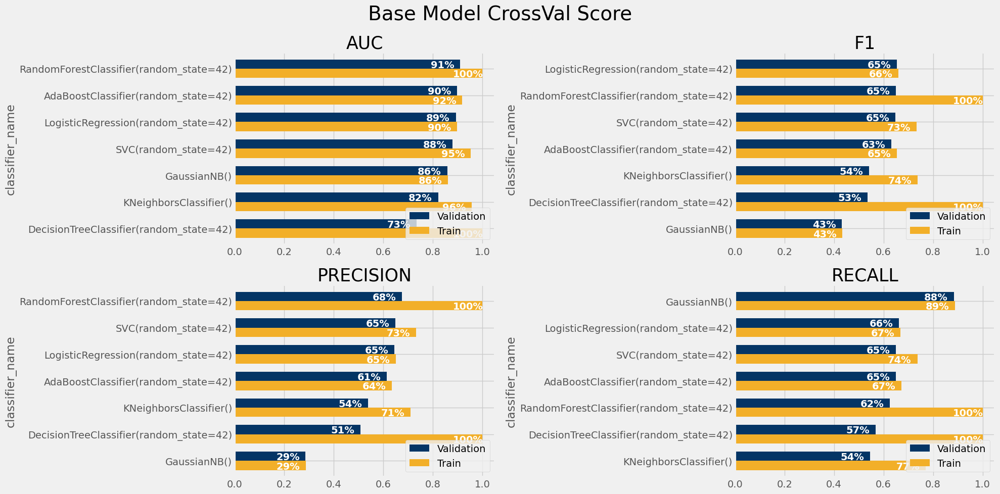

In [367]:
plot_metrics_comparison(base_result, 'Base Model CrossVal Score')
plt.tight_layout()
plt.show()

In [368]:
logreg = LogisticRegression(random_state = 42)
svc = SVC(random_state = 42)
dt = DecisionTreeClassifier(random_state = 42)
rf = RandomForestClassifier(random_state = 42)
adb = AdaBoostClassifier(random_state = 42)
knn = KNeighborsClassifier()
gnb = GaussianNB()

Resampling the minority Class

In [369]:
# pipeline if we use SMOTE oversampling
pipe_best = imbpipeline(steps=[
    ['oversampling', SMOTE(random_state=42, sampling_strategy = 1/3)],
    ['scaler', StandardScaler()],
    ['classifier', LogisticRegression()]
], memory="cache_folder")

In [370]:
stratified_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

In [371]:
param_grid_best = [
    {'classifier': [logreg], 'classifier__penalty': ['l1', 'l2'], 'classifier__C': [0.01, 1]},
    {'classifier': [svc], 'classifier__kernel': ['poly', 'rbf'], 'classifier__degree': [3, 4], 'classifier__C': [0.01, 1]},
    {'classifier': [dt], 'classifier__max_depth': [None, 2, 10, 30, 100], 'classifier__min_samples_split': [2, 5, 10], 'classifier__min_samples_leaf' : [1, 4, 10], 'classifier__max_features' : ['auto', 'sqrt']},
    {'classifier': [rf], 'classifier__max_depth': [None, 2, 10, 30, 100], 'classifier__min_samples_split': [2, 5, 10], 'classifier__min_samples_leaf' : [1, 4, 10], 'classifier__max_features' : ['auto', 'sqrt'], 'classifier__n_estimators': [20, 50, 100]},
    {'classifier': [adb], 'classifier__learning_rate': [0.1, 1.0], 'classifier__n_estimators': [20, 50]},
    {'classifier': [knn], 'classifier__n_neighbors': [5, 10], 'classifier__p': [1, 2]},
    {'classifier': [gnb], 'classifier__var_smoothing': np.logspace(0,-9, num=10)}
]

scoring = {
    'auc': 'roc_auc',
    'f1': 'f1',
    'recall': 'recall',
    'precision': 'precision',
}

Training the Model With best Parameters

In [372]:
best_grid = GridSearchCV(estimator = pipe_best, param_grid = param_grid_best, cv = stratified_kfold, scoring=scoring, refit='auc', n_jobs = -1, return_train_score=True)

In [373]:
%time print(best_grid.fit(X_train, y_train))

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=Pipeline(memory='cache_folder',
                                steps=[['oversampling',
                                        SMOTE(random_state=42,
                                              sampling_strategy=0.3333333333333333)],
                                       ['scaler', StandardScaler()],
                                       ['classifier', LogisticRegression()]]),
             n_jobs=-1,
             param_grid=[{'classifier': [LogisticRegression(random_state=42)],
                          'classifier_...
                          'classifier__n_estimators': [20, 50]},
                         {'classifier': [KNeighborsClassifier()],
                          'classifier__n_neighbors': [5, 10],
                          'classifier__p': [1, 2]},
                         {'classifier': [GaussianNB()],
                          'classifier__var_smoothing': array([1.e+00, 

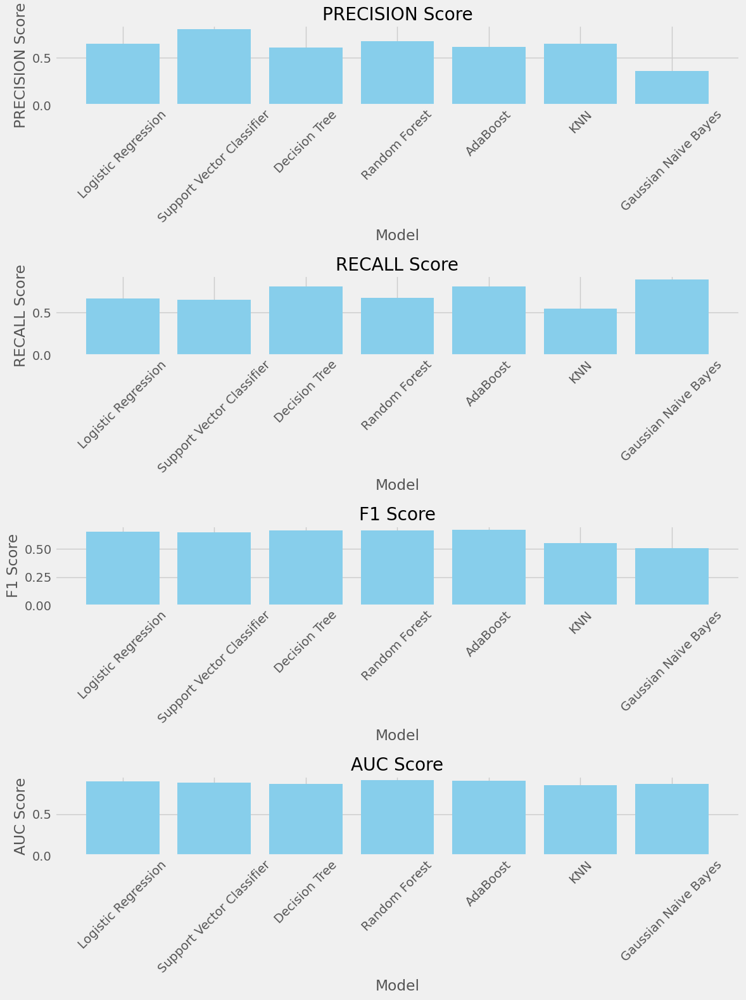

In [374]:

# Extracting results
results = best_grid.cv_results_

# Mapping classifier names to their corresponding best parameters
classifier_names = {
    'LogisticRegression': 'Logistic Regression',
    'SVC': 'Support Vector Classifier',
    'DecisionTreeClassifier': 'Decision Tree',
    'RandomForestClassifier': 'Random Forest',
    'AdaBoostClassifier': 'AdaBoost',
    'KNeighborsClassifier': 'KNN',
    'GaussianNB': 'Gaussian Naive Bayes'
}

# Extracting relevant metrics
metrics = ['mean_test_precision', 'mean_test_recall', 'mean_test_f1', 'mean_test_auc']

# Plotting
plt.figure(figsize=(12, 16))  # Adjust the figure size as needed

for i, metric in enumerate(metrics):
    plt.subplot(len(metrics), 1, i+1)
    scores = []
    labels = []

    for param_set in results['params']:
        classifier_name = classifier_names[param_set['classifier'].__class__.__name__]
        labels.append(classifier_name)
        scores.append(results[metric][results['params'].index(param_set)])

    plt.bar(labels, scores, color='skyblue')
    plt.title(metric.split('_')[-1].upper() + " Score")
    plt.xlabel("Model")
    plt.ylabel(metric.split('_')[-1].upper() + " Score")
    plt.xticks(rotation=45)
    plt.tight_layout()

plt.show()

In [375]:
import pandas as pd

# Extracting results
results = best_grid.cv_results_

# Mapping classifier names to their corresponding best parameters
classifier_names = {
    'LogisticRegression': 'Logistic Regression',
    'SVC': 'Support Vector Classifier',
    'DecisionTreeClassifier': 'Decision Tree',
    'RandomForestClassifier': 'Random Forest',
    'AdaBoostClassifier': 'AdaBoost',
    'KNeighborsClassifier': 'KNN',
    'GaussianNB': 'Gaussian Naive Bayes'
}

# Creating DataFrame
data_acc = []

# Extracting best parameters used by the models
best_params_used = {}
for params, mean_test_accuracy in zip(results['params'], results['mean_test_auc']):
    classifier_name = classifier_names[params['classifier'].__class__.__name__]
    if classifier_name not in best_params_used or mean_test_accuracy > best_params_used[classifier_name]['accuracy']:
        best_params_used[classifier_name] = {
            'params': params,
            'accuracy': mean_test_accuracy
        }

# Extracting precision, recall, F1, and accuracy scores for the models with highest accuracy
for model, best_params in best_params_used.items():
    row = {'Model': model}
    for metric in ['precision', 'recall', 'f1', 'auc']:
        row[metric.capitalize() + " Score"] = results['mean_test_' + metric][results['params'].index(best_params['params'])]
    data_acc.append(row)

df_acc = pd.DataFrame(data_acc)
df_acc.to_csv('results.csv', index=False)
# df.to_csv('/content/drive/MyDrive/Capstone/Model Building and Related Analysis/results.csv', index=False)

df_acc

,Model,Precision Score,Recall Score,F1 Score,Auc Score
0,Logistic Regression,NaN,NaN,NaN,NaN
1,Support Vector Classifier,0.648363,0.650197,0.648743,0.879793
2,Decision Tree,0.562650,0.803866,0.661711,0.868146
3,Random Forest,0.663513,0.656243,0.659338,0.913342
4,AdaBoost,0.591053,0.773507,0.669904,0.900026
5,KNN,0.624792,0.491422,0.549799,0.848930
6,Gaussian Naive Bayes,0.363719,0.839245,0.507434,0.861887


# Results

In [412]:
res = pd.read_csv('/content/results.csv')
res

,Model,Precision Score,Recall Score,F1 Score,Auc Score
0,Logistic Regression,NaN,NaN,NaN,NaN
1,Support Vector Classifier,0.648363,0.650197,0.648743,0.879793
2,Decision Tree,0.562650,0.803866,0.661711,0.868146
3,Random Forest,0.663513,0.656243,0.659338,0.913342
4,AdaBoost,0.591053,0.773507,0.669904,0.900026
5,KNN,0.624792,0.491422,0.549799,0.848930
6,Gaussian Naive Bayes,0.363719,0.839245,0.507434,0.861887


In [416]:
res = res.dropna()

In [420]:
res = res.sort_values(by='Auc Score', ascending=False)
res.reset_index(drop=True, inplace=True)
res

,Model,Precision Score,Recall Score,F1 Score,Auc Score
0,Random Forest,0.663513,0.656243,0.659338,0.913342
1,AdaBoost,0.591053,0.773507,0.669904,0.900026
2,Support Vector Classifier,0.648363,0.650197,0.648743,0.879793
3,Decision Tree,0.562650,0.803866,0.661711,0.868146
4,Gaussian Naive Bayes,0.363719,0.839245,0.507434,0.861887
5,KNN,0.624792,0.491422,0.549799,0.848930


In [376]:
best_grid_best_estimator = best_grid.best_estimator_
best_grid_best_estimator

Pipeline(memory='cache_folder',
         steps=[('oversampling',
                 SMOTE(random_state=42, sampling_strategy=0.3333333333333333)),
                ('scaler', StandardScaler()),
                ('classifier',
                 RandomForestClassifier(max_depth=10, max_features='auto',
                                        min_samples_leaf=4,
                                        min_samples_split=10,
                                        random_state=42))])

In [377]:
print(f"Best Estimator: {best_grid_best_estimator['classifier']}")
print(f"Best Params: {best_grid.best_params_}")
print(f"Best Score: {best_grid.best_score_}")

Best Estimator: RandomForestClassifier(max_depth=10, max_features='auto', min_samples_leaf=4,
                       min_samples_split=10, random_state=42)
Best Params: {'classifier': RandomForestClassifier(max_depth=10, max_features='auto', min_samples_leaf=4,
                       min_samples_split=10, random_state=42), 'classifier__max_depth': 10, 'classifier__max_features': 'auto', 'classifier__min_samples_leaf': 4, 'classifier__min_samples_split': 10, 'classifier__n_estimators': 100}
Best Score: 0.9133421128050984



The best estimator for the model is a RandomForestClassifier with the following parameters:
* max_depth: 10
* max_features: 'auto'
* min_samples_leaf: 4
* min_samples_split: 10
* random_state: 42

This model achieved the best score of 0.9133421128050984 on the training set. This suggests that this model is the best choice for predicting revenue based on the given features.

In [378]:
best_grid_result = pd.DataFrame(best_grid.cv_results_).drop(columns=['params'])
best_grid_result['classifier_name'] = best_grid_result['param_classifier'].astype(str).str.replace(r"\(.*\)","")
best_grid_result

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_classifier,param_classifier__C,param_classifier__penalty,param_classifier__degree,param_classifier__kernel,param_classifier__max_depth,param_classifier__max_features,param_classifier__min_samples_leaf,param_classifier__min_samples_split,param_classifier__n_estimators,param_classifier__learning_rate,param_classifier__n_neighbors,param_classifier__p,param_classifier__var_smoothing,split0_test_auc,split1_test_auc,split2_test_auc,split3_test_auc,split4_test_auc,mean_test_auc,std_test_auc,rank_test_auc,split0_train_auc,split1_train_auc,split2_train_auc,split3_train_auc,split4_train_auc,mean_train_auc,std_train_auc,split0_test_f1,split1_test_f1,split2_test_f1,split3_test_f1,split4_test_f1,mean_test_f1,std_test_f1,rank_test_f1,split0_train_f1,split1_train_f1,split2_train_f1,split3_train_f1,split4_train_f1,mean_train_f1,std_train_f1,split0_test_recall,split1_test_recall,split2_test_recall,split3_test_recall,split4_test_recall,mean_test_recall,std_test_recall,rank_test_recall,split0_train_recall,split1_train_recall,split2_train_recall,split3_train_recall,split4_train_recall,mean_train_recall,std_train_recall,split0_test_precision,split1_test_precision,split2_test_precision,split3_test_precision,split4_test_precision,mean_test_precision,std_test_precision,rank_test_precision,split0_train_precision,split1_train_precision,split2_train_precision,split3_train_precision,split4_train_precision,mean_train_precision,std_train_precision,classifier_name
0,0.052651,0.006196,0.000000,0.000000,LogisticRegression(random_state=42),0.01,l1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,389,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,389,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,389,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,389,NaN,NaN,NaN,NaN,NaN,NaN,NaN,LogisticRegression(random_state=42)
1,0.064376,0.008107,0.024214,0.003082,LogisticRegression(random_state=42),0.01,l2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.882503,0.919611,0.897024,0.892656,0.876723,0.893704,0.014813,220,0.898493,0.891436,0.898863,0.899458,0.899363,0.897522,0.003063,0.664921,0.656566,0.637037,0.666667,0.603581,0.645754,0.023564,150,0.646948,0.646798,0.650602,0.641772,0.663304,0.649885,0.007274,0.641414,0.656566,0.651515,0.664975,0.595960,0.642086,0.024292,102,0.649810,0.644753,0.648546,0.640152,0.664981,0.649649,0.008372,0.690217,0.656566,0.623188,0.668367,0.611399,0.649948,0.029006,201,0.644110,0.648855,0.652672,0.643401,0.661635,0.650135,0.006663,LogisticRegression(random_state=42)
2,0.044795,0.004999,0.000000,0.000000,LogisticRegression(random_state=42),1,l1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,389,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,389,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,389,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,389,NaN,NaN,NaN,NaN,NaN,NaN,NaN,LogisticRegression(random_state=42)
3,0.071012,0.003365,0.023107,0.001320,LogisticRegression(random_state=42),1,l2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.880841,0.917691,0.896647,0.893179,0.875585,0.892789,0.014655,221,0.898927,0.892239,0.899863,0.900105,0.900089,0.898244,0.003034,0.668380,0.671605,0.639225,0.671679,0.616541,0.653486,0.022133,63,0.658824,0.653266,0.662508,0.648345,0.674534,0.659495,0.008931,0.656566,0.686869,0.666667,0.680203,0.621212,0.662303,0.023084,38,0.672566,0.657396,0.671302,0.655303,0.686473,0.668608,0.011356,0.680628,0.657005,0.613953,0.663366,0.611940,0.645379,0.027593,225,0.645631,0.649189,0.653941,0.641533,0.663004,0.650659,0.007401,LogisticRegression(random_state=42)
4,2.145908,0.463566,0.682841,0.150036,SVC(random_state=42),0.01,NaN,3,poly,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.868779,0.897208,0.884147,0.876396,0.862867,0.877879,0.012027,243,0.909210,0.906362,0.910165,0.912546,0.912160,0.910089,0.002236,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,352,0.000000,

In [379]:
best_grid_result[['rank_test_auc', 'classifier_name', 'mean_test_auc', 'std_test_auc', 'mean_train_auc', 'std_train_auc', 'mean_test_f1', 'std_test_f1', 'mean_train_f1', 'std_train_f1', 'mean_test_recall', 'std_test_recall', 'mean_train_recall', 'std_train_recall', 'mean_test_precision', 'std_test_precision', 'mean_train_precision', 'std_train_precision']].sort_values('rank_test_auc')

,rank_test_auc,classifier_name,mean_test_auc,std_test_auc,mean_train_auc,std_train_auc,mean_test_f1,std_test_f1,mean_train_f1,std_train_f1,mean_test_recall,std_test_recall,mean_train_recall,std_train_recall,mean_test_precision,std_test_precision,mean_train_precision,std_train_precision
227,1,"RandomForestClassifier(max_depth=10, max_featu...",0.913342,0.012433,0.975810,0.000938,0.659338,0.028284,0.80294,0.007378,0.656243,0.031853,0.784883,0.010574,0.663513,0.035512,0.821991,0.010179
254,1,"RandomForestClassifier(max_depth=10, max_featu...",0.913342,0.012433,0.975810,0.000938,0.659338,0.028284,0.80294,0.007378,0.656243,0.031853,0.784883,0.010574,0.663513,0.035512,0.821991,0.010179
314,3,"RandomForestClassifier(max_depth=10, max_featu...",0.912871,0.012586,0.971856,0.001033,0.658464,0.031744,0.78703,0.004822,0.653223,0.029325,0.762387,0.008923,0.664408,0.039827,0.813378,0.001490
371,3,"RandomForestClassifier(max_depth=10, max_featu...",0.912871,0.012586,0.971856,0.001033,0.658464,0.031744,0.78703,0.004822,0.653223,0.029325,0.762387,0.008923,0.664408,0.039827,0.813378,0.001490
368,3,"RandomForestClassifier(max_depth=10, max_featu...",0.912871,0.012586,0.971856,0.001033,0.658464,0.031744,0.78703,0.004822,0.653223,0.029325,0.762387,0.008923,0.664408,0.039827,0.813378,0.001490
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12,383,DecisionTreeClassifier(random_state=42),0.718098,0.015083,1.000000,0.000000,0.510403,0.022737,1.00000,0.000000,0.539953,0.027615,1.000000,0.000000,0.484007,0.019398,1.000000,0.000000
75,383,DecisionTreeClassifier(random_state=42),0.718098,0.015083,1.000000,0.000000,0.510403,0.022737,1.00000,0.000000,0.539953,0.027615,1.000000,0.000000,0.484007,0.019398,1.000000,0.000000
66,383,DecisionTreeClassifier(random_state=42),0.718098,0.015083,1.000000,0.000000,0.510403,0.022737,1.00000,0.000000,0.539953,0.027615,1.000000,0.000000,0.484007,0.019398,1.000000,0.000000
2,389,LogisticRegression(random_state=42),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Working on Validation Set

In [401]:
# save grid search and pipeline components for validation and new data without SMOTE oversampling
best_scaler = best_grid_best_estimator['scaler']
best_classifier = best_grid_best_estimator['classifier']

In [402]:
X_val_trf = best_scaler.transform(X_val)
y_val_pred = best_classifier.predict(X_val_trf)
y_val_scores = best_classifier.predict_proba(X_val_trf)
fpr_val, tpr_val, threshold_val = roc_curve(y_val, y_val_scores[:, 1])

X_train_trf = best_scaler.transform(X_train)
y_train_pred = best_classifier.predict(X_train_trf)
y_train_scores = best_classifier.predict_proba(X_train_trf)
fpr_train, tpr_train, threshold_train = roc_curve(y_train, y_train_scores[:, 1])

In [403]:
confusion_matrix(y_val, y_val_pred)

array([[1693,  121],
       [ 119,  225]])

From the confusion matrix of the separate validation set, this best model try to predict a more negative class as the positive class.

Compared to the previous training on the base model, the False Positive count increase from 109 to 120, and the False negative decrease from 134 to 125, True Positive increase from 248 to 257, and True Negative decrease from 1950 to 1935. The increase count of FP has an impact on the decreasing of the precision (previously 69% to 68%). It might be a sign of the model learning the noise inside the dataset.

Additionally, increasing of recall (prev. 65% to 67%), and increase in AUC (prev. 79.8% to 80.7%).

In [404]:
print(classification_report(y_val, y_val_pred))

              precision    recall  f1-score   support

           0       0.93      0.93      0.93      1814
           1       0.65      0.65      0.65       344

    accuracy                           0.89      2158
   macro avg       0.79      0.79      0.79      2158
weighted avg       0.89      0.89      0.89      2158



In [405]:
roc_auc_score(y_val, y_val_pred)

0.7936831747903901

The AUC score is increasing from 78.9% to 80.7% due to the increase of Recall (TPR).

If we compared these AUC scores with the base model, the overfitting seems to be reduced, because now, the differences between training and separate validation set are about 4%.

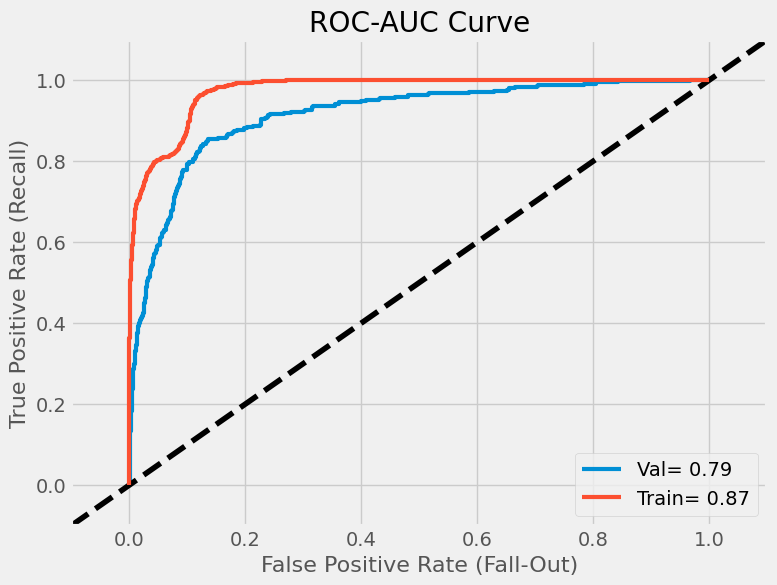

In [406]:
plt.figure(figsize=(8, 6))                                    # Not shown
plot_roc_curve(fpr_val, tpr_val, label="Val" + "= " + str(round(roc_auc_score(y_val, y_val_pred),2)))
plt.plot(fpr_train, tpr_train, label="Train" + "= " + str(round(roc_auc_score(y_train, y_train_pred),2)), linewidth=3)
plt.title("ROC-AUC Curve")
plt.legend()
plt.show()

# Working on Testing Set

In [395]:
# save grid search and pipeline components for validation and new data without SMOTE oversampling
best_scaler = best_grid_best_estimator['scaler']
best_classifier = best_grid_best_estimator['classifier']

In [396]:
X_test_trf = best_scaler.transform(X_test)
y_test_pred = best_classifier.predict(X_test_trf)
y_test_scores = best_classifier.predict_proba(X_test_trf)
fpr_test, tpr_test, threshold_test = roc_curve(y_test, y_test_scores[:, 1])

X_train_trf = best_scaler.transform(X_train)
y_train_pred = best_classifier.predict(X_train_trf)
y_train_scores = best_classifier.predict_proba(X_train_trf)
fpr_train, tpr_train, threshold_train = roc_curve(y_train, y_train_scores[:, 1])

In [397]:
confusion_matrix(y_test, y_test_pred)

array([[2924,  200],
       [ 212,  363]])

In [398]:
print(classification_report(y_test, y_test_pred))

              precision    recall  f1-score   support

           0       0.93      0.94      0.93      3124
           1       0.64      0.63      0.64       575

    accuracy                           0.89      3699
   macro avg       0.79      0.78      0.79      3699
weighted avg       0.89      0.89      0.89      3699



In [399]:
roc_auc_score(y_test, y_test_pred)

0.7836419306351946

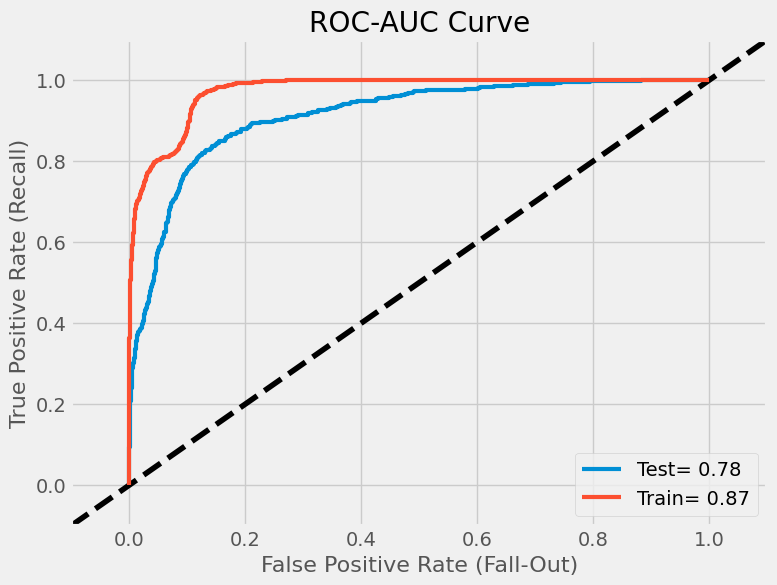

In [400]:
plt.figure(figsize=(8, 6))                                    # Not shown
plot_roc_curve(fpr_test, tpr_test, label="Test" + "= " + str(round(roc_auc_score(y_test, y_test_pred),2)))
plt.plot(fpr_train, tpr_train, label="Train" + "= " + str(round(roc_auc_score(y_train, y_train_pred),2)), linewidth=3)
plt.title("ROC-AUC Curve")
plt.legend()
plt.show()

# Explainable AI

## Feature Importance

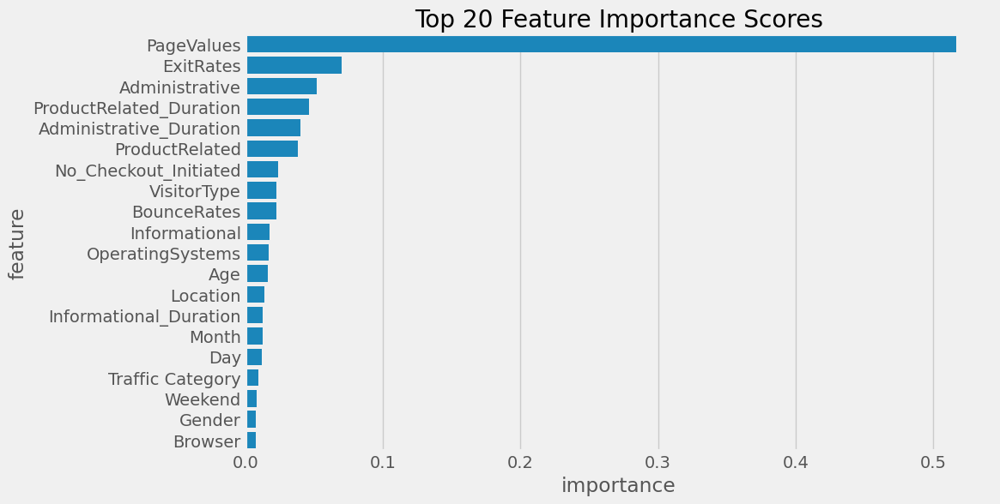

In [386]:

# Feature Importance
# Create a DataFrame with feature names and their corresponding importance scores
feature_importances = pd.DataFrame({
    "feature": X_train.columns,
    "importance": best_classifier.feature_importances_
})

# Sort the DataFrame by importance score in descending order
feature_importances = feature_importances.sort_values("importance", ascending=False)

# Plot the top 20 features
plt.figure(figsize=(10, 6))
sns.barplot(x="importance", y="feature", data=feature_importances.head(20))
plt.title("Top 20 Feature Importance Scores")
plt.show()


## Permutation Importance

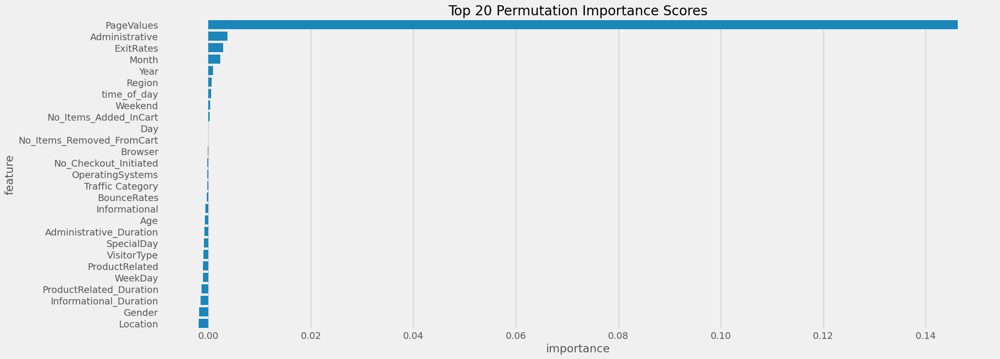

In [387]:
# prompt: implement permutation importance explainable ai and plot it and increase the size of the figure

from sklearn.inspection import permutation_importance

# Calculate permutation importance for the best model
perm_importance = permutation_importance(best_classifier, X_val_trf, y_val, n_repeats=20, random_state=42)

# Create a DataFrame with feature names and their corresponding permutation importance scores
perm_df = pd.DataFrame({
    "feature": X_val.columns,
    "importance": perm_importance.importances_mean
})

# Sort the DataFrame by importance score in descending order
perm_df = perm_df.sort_values("importance", ascending=False)

# Plot the top 20 features
plt.figure(figsize=(20, 8))  # Increased figure size
sns.barplot(x="importance", y="feature", data=perm_df.head(29))
plt.title("Top 20 Permutation Importance Scores")
plt.show()


## LIME Analysis

In [ ]:
!pip install lime


In [389]:
import lime
import lime.lime_tabular
# Instantiate a LimeTabularExplainer object
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train),
    feature_names=X_train.columns,
    class_names=df['Revenue'].value_counts(),
    discretize_continuous=True
)

# Explain the first instance in the validation set
explanation = explainer.explain_instance(X_val.iloc[0].values, best_classifier.predict_proba, top_labels=5)

# Plot the explanation
plt.figure(figsize=(15, 10))
explanation.show_in_notebook(show_table=True)


<Figure size 1500x1000 with 0 Axes>

### LIME Analysis Inference

### Overview

The image displays the Local Interpretable Model-agnostic Explanations (LIME) analysis for two data points, labeled 10422 and 1908. LIME is used to understand and interpret the predictions made by a machine learning model by approximating the model locally with simpler, interpretable models.

### Prediction Probabilities
- **Data Point 10422**:
  - Predicted Probability: 0.56
- **Data Point 1908**:
  - Predicted Probability: 0.44

### Feature Contributions

#### Data Point 10422
- **No_Checkout_Initiated**: 0.69 (contributes significantly to the prediction)
- **Informational**: 0.00
- **PageValues**: 0.00
- **Informational_Duration**: 0.00
- **Administrative_Duration**: 4.43 (contributes positively)
- **Browser**: 0.69
- **ProductRelated**: 1.79
- **Administrative**: 1.39
- **OperatingSystems**: 0.69
- **SpecialDay**: 0.00

#### Data Point 1908
- **No_Checkout_Initiated**: 0.69 (contributes significantly to the prediction)
- **Informational**: 0.00
- **PageValues**: 0.00
- **Informational_Duration**: 0.00
- **Administrative_Duration**: 2.08 (contributes positively)
- **Browser**: 0.69
- **ProductRelated**: 2.08
- **Administrative**: 0.69
- **OperatingSystems**: 0.69
- **SpecialDay**: 0.00

### Interpretation
- For both data points, the **No_Checkout_Initiated** feature significantly influences the prediction.
- **Administrative_Duration** has a higher positive contribution for data point 10422 compared to data point 1908.
- Other features like **Informational**, **PageValues**, **Informational_Duration**, and **SpecialDay** have little to no impact on the predictions.

### How LIME Works
1. **Model-Agnostic**: LIME treats the original model as a black box, making it applicable to any type of predictive model.
2. **Local Approximation**: LIME approximates the model locally around the prediction to understand which features influenced that specific prediction.
3. **Simplified Models**: It uses interpretable models (like linear models or decision trees) to approximate the black-box model's behavior locally.
4. **Perturbation**: LIME perturbs the input data and observes the changes in predictions, helping to identify the importance of each feature in the prediction process.

### Conclusion
The LIME analysis provides insights into which features are driving the predictions for specific data points, enhancing the interpretability of complex machine learning models.


## Shap Analysis

In [ ]:
!pip install shap

 94%|=================== | 4062/4316 [00:16<00:01]       

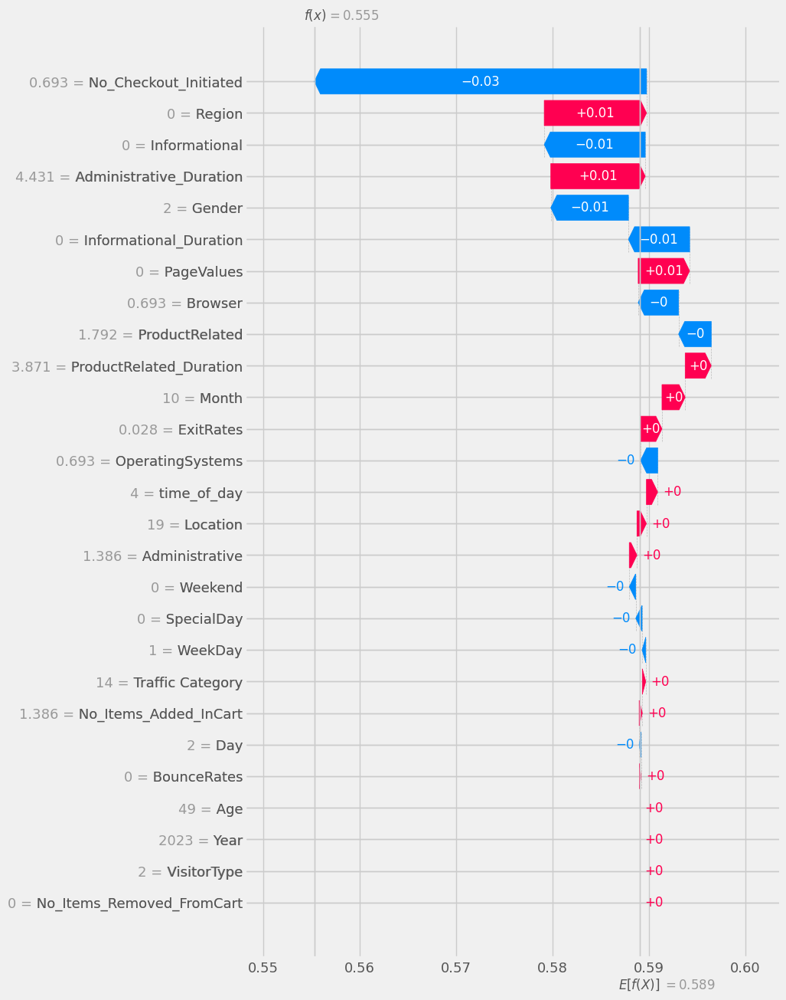

In [391]:

import shap
shap.initjs()

# Create a Shap explainer object
explainer = shap.Explainer(best_classifier, X_train)

# Calculate Shap values for the validation set
shap_values = explainer(X_val)

# Determine the number of features
num_features = X_train.shape[1]

# Plot Shap values for the first instance in the validation set
shap.plots.waterfall(shap_values[0][:, 0], max_display=num_features)

### SHAP Waterfall Plot Interpretation

The SHAP waterfall plot helps us understand the contribution of each feature to the model's prediction for a specific instance. Below is the detailed interpretation:

#### Key Elements of the Waterfall Plot

1. **Base Value (E[f(X)])**:
   - The base value, \(E[f(X)] = 0.589\), represents the average model output if we don't consider any specific features. This can be thought of as the baseline prediction.

2. **Model Output (f(x))**:
   - The model's final prediction for this specific instance is \(f(x) = 0.555\).

3. **Feature Contributions**:
   - Each bar represents a feature's SHAP value, showing how it shifts the prediction from the base value to the final prediction.
   - **Blue bars** decrease the prediction.
   - **Red bars** increase the prediction.

#### Feature Contributions

1. **No_Checkout_Initiated (0.693)**:
   - This feature has the most significant negative contribution, decreasing the prediction by 0.03.
   
2. **Region (0)**:
   - This feature slightly increases the prediction by 0.01.

3. **Informational (0)**:
   - This feature also slightly increases the prediction by 0.01.

4. **Administrative_Duration (4.431)**:
   - Contributes positively with an increase of 0.01.

5. **Gender (2)**:
   - Has a small negative impact, reducing the prediction by 0.01.

6. **Informational_Duration (0)**:
   - Contributes negatively, reducing the prediction by 0.01.

7. **PageValues (0)**:
   - Has a small positive impact, increasing the prediction by 0.01.

8. **Browser (0.693)**:
   - Has a very small impact, with an increase of approximately 0.

9. **ProductRelated (1.792)**:
   - Contributes positively with a negligible increase.

10. **ProductRelated_Duration (3.871)**:
    - Similar to ProductRelated, has a negligible positive impact.

11. **Month (10)**:
    - Has a very small impact on the prediction.

12. **ExitRates (0.028)**:
    - Slight positive contribution, but very small.

13. **OperatingSystems (0.693)**:
    - Negligible impact on the prediction.

14. **time_of_day (4)**:
    - Very small positive contribution.

15. **Location (19)**:
    - Negligible impact on the prediction.

16. **Administrative (1.386)**:
    - Very small positive impact.

17. **Weekend (0)**:
    - Slight negative contribution, but very small.

18. **SpecialDay (0)**:
    - Very small positive contribution.

19. **WeekDay (1)**:
    - Negligible positive impact.

20. **TrafficCategory (14)**:
    - Very small negative contribution.

21. **No_Items_Added_InCart (1.386)**:
    - Negligible impact.

22. **Day (2)**:
    - Very small positive impact.

23. **BounceRates (0)**:
    - Slight negative impact.

24. **Age (49)**:
    - Very small positive contribution.

25. **Year (2023)**:
    - Negligible impact.

26. **VisitorType (2)**:
    - Very small positive contribution.

27. **No_Items_Removed_FromCart (0)**:
    - Negligible impact.

#### Overall Interpretation

- **Main Drivers**: The most influential features for this instance are:
  - `No_Checkout_Initiated (0.693)`, which significantly decreases the prediction.
  - `Region (0)`, `Informational (0)`, and `Administrative_Duration (4.431)`, which slightly increase the prediction.
  
- **Minor Influences**: Many features have very small or negligible contributions, indicating that for this particular instance, their impact on the prediction is minimal.

#### Conclusion

For this specific instance:
- The model's baseline prediction starts at 0.589.
- Various features adjust this prediction slightly, both positively and negatively.
- The most significant change is due to `No_Checkout_Initiated`, which reduces the final prediction by 0.03, leading to a final prediction of 0.555.

This detailed view helps understand which features are driving the model's decision and by how much, which is valuable for interpreting model behavior and ensuring transparency in predictive modeling.


## Explainable Boosting Classifier Analysis

In [ ]:
!pip install interpret

In [393]:
from interpret.glassbox import ExplainableBoostingClassifier
from interpret import show

ebc = ExplainableBoostingClassifier()
ebc.fit(X_train, y_train)

# Individual instance explanation
# ebc_local = ebc.explain_local(X_test[:5], y_test[:5])
# show(ebc_local)

# Global explanation
ebc_global = ebc.explain_global()
show(ebc_global)
